In [1]:
# Import libraries
import os
import os.path
import seaborn as sns

import math
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation
# for a nice colored plot
from matplotlib.colors import LinearSegmentedColormap
from scipy.spatial import ConvexHull
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from scipy.stats import chi2_contingency
#import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from shapely.geometry import Polygon
from shapely.ops import triangulate
# to check memory use
import psutil

In [2]:
def round_n_decimal(x, n_decimal):
    return int(np.floor(x*10**n_decimal))/10**n_decimal

In [3]:
def load_data_data(station_id):
    # determine the file name from the station id
    file_name = "./raw_data/station_"+str(station_id)+".pkl"
    return pd.read_pickle(file_name)

In [4]:
def normalize_df(df):
    
    for station_id in df['station_id'].unique():
        max_WS    = df[df['station_id'] == station_id]['WS'].max()
        max_ustar = df[df['station_id'] == station_id]['ustar'].max()

        df_norm = df.copy()
        df_norm['WS']    = df['WS']    / max_WS
        df_norm['ustar'] = df['ustar'] / max_ustar
    
    return df_norm

In [5]:
def calculate_seasonal_hourly_median(df, year=0, saison='toutes'):
    if saison == "hiver":
        mois = [1, 2] # remove December because it is added later from the previous year
    if saison == "printemps":
        mois = [3, 4, 5]
    if saison == "été":
        mois = [6, 7, 8]
    if saison == "automne":
        mois = [9, 10, 11]
    if saison == "toutes":
        mois = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
    
    # Filter for the year
    if year != 0:
        df_saison = df[df['year'] == year]
    else:
        df_saison = df

    # Filter for seasonal months
    if saison != "toutes":
        df_saison = df_saison[df_saison['month'].isin(mois)]
        
    # Filter for the current year's months
    #df_saison = df[(df['year'] == year) & (df['month'].isin(mois))]
    
    # Also include December of the previous year if winter
    if saison == "hiver":
        if year > df['year'].min():
            df_dec_prev_year = df[(df['year'] == year - 1) & (df['month'] == 12)]
            df_saison = pd.concat([df_dec_prev_year, df_saison])
    
    # Group by 'hour' and calculate the median
    hourly_mean_saison = df_saison.groupby('hour').median()
    
    # Add the station id and location back since they cannot be meaned
    if df_saison.empty:
        return df_saison, df_saison, 0
    if 'station_loc' in df.columns:
        station_id  = df_saison['station_id'].iloc[0]
        station_loc = df_saison['station_loc'].iloc[0]
        hourly_mean_saison['station_loc'] = station_loc
        hourly_mean_saison['station_id'] = station_id
        hourly_mean_saison['saison'] = saison
    
    # Reset the index
    hourly_mean_saison = hourly_mean_saison.reset_index()
    return df_saison, hourly_mean_saison, len(df_saison)

In [6]:
def norm_and_cut():
    saisons = ['hiver', 'printemps', 'été', 'automne']
    first_plot = True
    
    # create an empty dataframe
    df_mean_data = pd.DataFrame(columns=['station_loc', 'station_id', 'saison', 'year', 'month', 'day', 'hour',
                                         'WS', 'ustar', 'ZL', 'WS_max', 'ustar_max'])
    df_raw_data  = pd.DataFrame(columns=['station_loc', 'station_id', 'saison', 'year', 'month', 'day', 'hour', 
                                         'WS', 'ustar', 'ZL', 'WS_max', 'ustar_max'])
    
    mean_data_dict   = []
    df_raw_data_dict = []
    
    # load station ids and locations
    df_station_loc = pd.read_pickle("Station_loc_info.pkl")
    station_ids  = df_station_loc['station_id']
    station_locs = df_station_loc['location']
    del df_station_loc
    
    # define the criteria for good saisons
    n_hour_max = 24*30*3
    crit_75p_max = n_hour_max*0.75
    # lets count how mane are good saisons
    n_saisons = 0
    n_good_saisons = 0
    
    print('max elem: ', n_hour_max)
    print('75% de max elem: ', crit_75p_max)
    
    
    for i in range(len(station_ids)):
    #for i in range(2):
        station_id  = station_ids[i]
        station_loc = station_locs[i]
        df = load_data_data(station_id)
        print('total hours in station ', station_id, ' : ', len(df))
        for year in df['year'].unique():
            for saison in saisons:
                n_saisons += 1
                df_saison, hourly_mean, n_hours = calculate_seasonal_hourly_median(df, year, saison)
                
                print(station_id, year, saison)
                print('n_hours: ', n_hours, '  crit_75p_max: ', crit_75p_max, '\n')
                
                # nous ajoutons un critère qu'il doit y avoir au moins 75% des données afin que le résultat soit représentatif de la saison
                if int(n_hours) > int(crit_75p_max):
                    n_good_saisons += 1
                    print('pass cut: n_hours: ', n_hours, '  crit_75p_max: ', crit_75p_max, '\n')
                    # find the highest hourly mean value
                    WS_max    = hourly_mean['WS'].max()
                    ustar_max = hourly_mean['ustar'].max()
                    
                    # Plot the first result
                    if first_plot == True:
                        show_plot = True
                        first_plot = False
                    else:
                        show_plot = False

                    # save the raw data (after cutting)
                    print(station_id, year, saison)
                    #print(df_saison)
                    for idx, row in df_saison.iterrows():
                        df_raw_data_dict = {
                            'station_id': station_id,
                            'station_loc': station_loc,
                            'saison': saison,  
                            'year': row['year'],
                            'month': row['month'],
                            'day': row['day'],
                            'hour': row['hour'],
                            'WS': row['WS'],
                            'ustar': row['ustar'],
                            'ZL': row['ZL'],
                            'WS_max': WS_max,
                            'ustar_max': ustar_max,
                        }
                        # Append the dict to the dataframe
                        df_raw_data = df_raw_data.append(df_raw_data_dict, ignore_index=True)
    
    print('there are ', n_saisons, ' saisons')
    print('there are ', n_good_saisons, ' good saisons')
    print('% of good saisons: ', 100*n_good_saisons/n_saisons)
    return df_raw_data

In [7]:
file_name_raw  = "data_raw_test.pkl"
update = False
if (os.path.exists(file_name_raw) == False) or (update == True):
    df_raw = norm_and_cut()
    df_raw.to_pickle(file_name_raw)  
else: 
    df_raw = pd.read_pickle(file_name_raw)
df_raw_norm = normalize_df(df_raw)

In [8]:
df_raw

,station_loc,station_id,saison,year,month,day,hour,WS,ustar,ZL,WS_max,ustar_max
0,US-WA,2,printemps,2018.0,3.0,1.0,0.0,6.878897,0.310506,0.099593,6.135573,0.425802
1,US-WA,2,printemps,2018.0,3.0,1.0,1.0,6.202563,0.321481,0.094543,6.135573,0.425802
2,US-WA,2,printemps,2018.0,3.0,1.0,2.0,6.405616,0.295024,0.115495,6.135573,0.425802
3,US-WA,2,printemps,2018.0,3.0,1.0,3.0,6.335181,0.321730,0.059697,6.135573,0.425802
4,US-WA,2,printemps,2018.0,3.0,1.0,4.0,8.440815,0.433898,0.036114,6.135573,0.425802
...,...,...,...,...,...,...,...,...,...,...,...,...
455053,US-FL,35,automne,2019.0,11.0,30.0,17.0,1.356818,0.055000,2.638273,3.422404,0.377915
455054,US-FL,35,automne,2019.0,11.0,30.0,18.0,0.805828,0.047000,-0.783770,3.422404,0.377915
455055,US-FL,35,automne,2019.0,11.0,30.0,19.0,0.545015,0.050300,-2.714395,3.422404,0.377915
455056,US-FL,35,automne,2019.0,11.0,30.0,20.0,1.759809,0.105669,1.811427,3.422404,0.377915


In [110]:
    print(df_raw[['station_id', 'saison', 'year']].drop_duplicates().reset_index(drop=True))
    print(df_raw[['station_id', 'saison', 'year']].drop_duplicates().shape[0])

    station_id     saison    year
0            2  printemps  2018.0
1            2  printemps  2020.0
2            3  printemps  2015.0
3            3        été  2015.0
4            3        été  2016.0
..         ...        ...     ...
247         35      hiver  2018.0
248         35      hiver  2019.0
249         35  printemps  2019.0
250         35        été  2019.0
251         35    automne  2019.0

[252 rows x 3 columns]
252


In [9]:
df_raw_norm

,station_loc,station_id,saison,year,month,day,hour,WS,ustar,ZL,WS_max,ustar_max
0,US-WA,2,printemps,2018.0,3.0,1.0,0.0,0.737236,0.332993,0.099593,6.135573,0.425802
1,US-WA,2,printemps,2018.0,3.0,1.0,1.0,0.664751,0.344763,0.094543,6.135573,0.425802
2,US-WA,2,printemps,2018.0,3.0,1.0,2.0,0.686512,0.316390,0.115495,6.135573,0.425802
3,US-WA,2,printemps,2018.0,3.0,1.0,3.0,0.678964,0.345030,0.059697,6.135573,0.425802
4,US-WA,2,printemps,2018.0,3.0,1.0,4.0,0.904632,0.465322,0.036114,6.135573,0.425802
...,...,...,...,...,...,...,...,...,...,...,...,...
455053,US-FL,35,automne,2019.0,11.0,30.0,17.0,0.145415,0.058983,2.638273,3.422404,0.377915
455054,US-FL,35,automne,2019.0,11.0,30.0,18.0,0.086363,0.050404,-0.783770,3.422404,0.377915
455055,US-FL,35,automne,2019.0,11.0,30.0,19.0,0.058411,0.053943,-2.714395,3.422404,0.377915
455056,US-FL,35,automne,2019.0,11.0,30.0,20.0,0.188605,0.113322,1.811427,3.422404,0.377915


In [61]:
def test_data_3d_plot(station_id = 0, norm = False, uncut=False):
    
    if (uncut == True):
        if station_id == 0:
            df_station_loc = pd.read_pickle("Station_loc_info.pkl")
            station_ids  = df_station_loc['station_id']
            station_locs = df_station_loc['location'] 
            for i in range(len(station_ids)):
                if i == 0:
                    df_station = load_data_data(station_ids[i])
                else:
                    df_station = df_station.append(load_data_data(station_ids[i]))
        else:
            df_station = df = load_data_data(station_id)
    else:
        if (norm == False):
            df_station = df_raw
        else:
            df_station = df_raw_norm

        if (station_id == 0):
            df_station = df_station
        else:
            df_station = df_station[df_station['station_id'] == station_id]
    

    
    #plt.hist(df_station['ZL'])

    print("WS    range: ", df_station['WS'].min(), ", ",    df_station['WS'].max())
    print("ustar range: ", df_station['ustar'].min(), ", ", df_station['ustar'].max())
    print("ZL    range: ", df_station['ZL'].min(), ", ",    df_station['ZL'].max())

    fig = plt.figure(figsize = (10, 7))
    ax = plt.axes(projection ="3d")

    # Creating plot
    ax.scatter3D(df_station['WS'], df_station['ustar'], df_station['ZL'])
    ax.set_xlabel('$u_{10m}$', fontsize=22)
    ax.set_ylabel('$u^*$', fontsize=22)
    ax.set_zlabel('$z/L$', fontsize=22)
    if station_id == 0:
        station_id = 'toutes'
    # save plot
    if uncut == False:
        if (norm == True):
            print('cut norm station: ', station_id, "./Plots_report/Raw_data_station_"+str(station_id)+"_cut_norm.png")
            plt.savefig("./Plots_report/Raw_data_station_"+str(station_id)+"_cut_norm.png", bbox_inches='tight')
        else:
            print('cut station: ', station_id, "./Plots_report/Raw_data_station_"+str(station_id)+"_cut.png")
            plt.savefig("./Plots_report/Raw_data_station_"+str(station_id)+"_cut.png", bbox_inches='tight')
    else:
        print('uncut station: ', station_id, "./Plots_report/Raw_data_station_"+str(station_id)+"_uncut.png")
        plt.savefig("./Plots_report/Raw_data_station_"+str(station_id)+"_uncut.png", bbox_inches='tight')
    # show plot
    plt.show()
    plt.close()

WS    range:  0.02 ,  13.786984018552905
ustar range:  0.0 ,  0.9550000000000001
ZL    range:  -242.07407407407413 ,  123.06172839506175
uncut station:  10 ./Plots_report/Raw_data_station_10_uncut.png


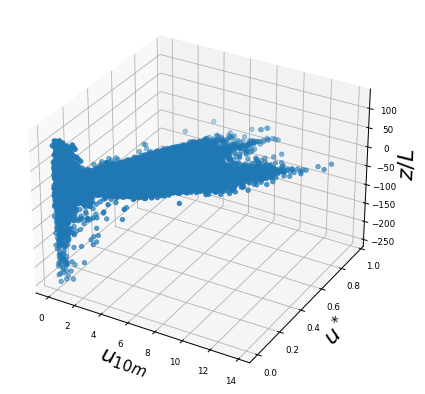

WS    range:  0.02 ,  13.786984018552905
ustar range:  0.0 ,  0.9550000000000001
ZL    range:  -242.07407407407413 ,  123.01234567901236
cut station:  10 ./Plots_report/Raw_data_station_10_cut.png


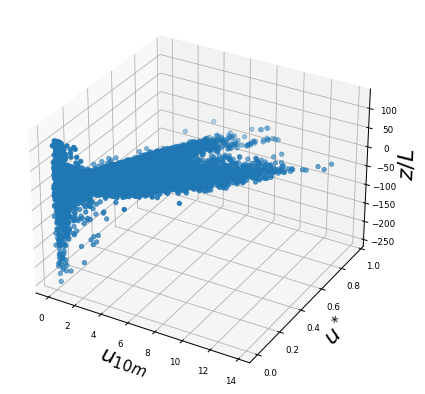

WS    range:  0.0021434705301842097 ,  1.4775996971944412
ustar range:  0.0 ,  1.0241616352268705
ZL    range:  -242.07407407407413 ,  123.01234567901236
cut norm station:  10 ./Plots_report/Raw_data_station_10_cut_norm.png


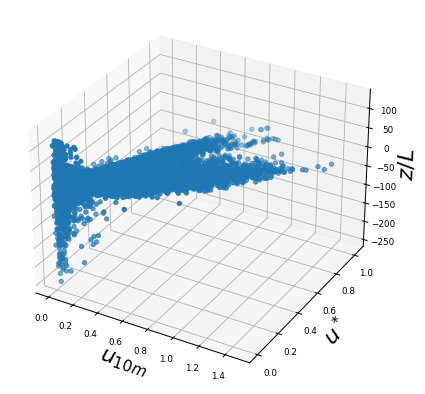

WS    range:  0.02 ,  29.712246892214267
ustar range:  0.0 ,  2.153319
ZL    range:  -5613.3761904761905 ,  8411.938009722222
uncut station:  toutes ./Plots_report/Raw_data_station_toutes_uncut.png


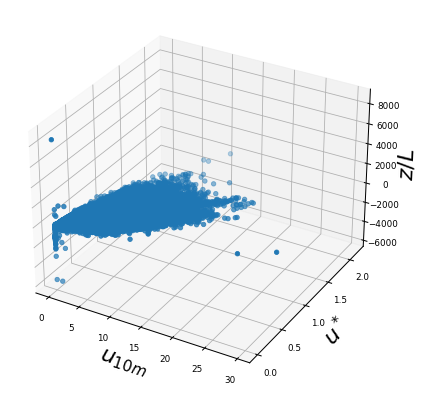

WS    range:  0.02 ,  29.712246892214267
ustar range:  0.0 ,  2.153319
ZL    range:  -5551.6643875 ,  8411.938009722222
cut station:  toutes ./Plots_report/Raw_data_station_toutes_cut.png


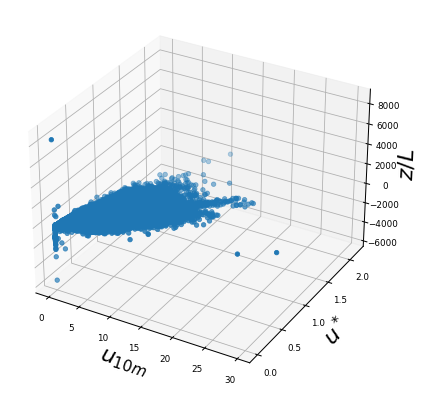

WS    range:  0.0021434705301842097 ,  3.184366279950933
ustar range:  0.0 ,  2.3092635688011414
ZL    range:  -5551.6643875 ,  8411.938009722222
cut norm station:  toutes ./Plots_report/Raw_data_station_toutes_cut_norm.png


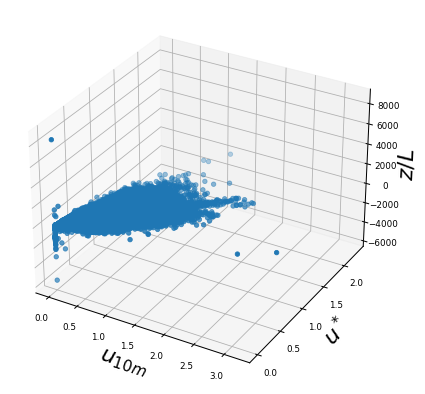

In [62]:
test_data_3d_plot(station_id=10, norm=False, uncut=True)
test_data_3d_plot(station_id=10)
test_data_3d_plot(station_id=10, norm=True)
#test_data_3d_plot(station_id=12)
#test_data_3d_plot(station_id=12, norm=True)
#test_data_3d_plot(station_id=20)
#test_data_3d_plot(station_id=20, norm=True)
test_data_3d_plot(station_id=0, norm=False, uncut=True)
test_data_3d_plot()
test_data_3d_plot(station_id=0, norm=True)

# Find center of the loop
### note: this is the mean value of each of the parameters

In [12]:
def Orbit_center(df):
    # Extract coordinates from panda dataframe
    x_center = df['WS'].mean()
    y_center = df['ustar'].mean()
    z_center = df['ZL'].mean()
    
    return x_center, y_center, z_center

# Find best fit plane and its var

In [13]:
# Calc of var between data and plane
def Plane_data_var(params, x, y, z):
    # Extract coefficients
    a, b, c, d = params
    
    # Calculate perpendicular distance from point to plane
    distances = np.abs(a * x + b * y + c * z + d) / np.sqrt(a**2 + b**2 + c**2)
    
    # Calc Var
    Var = np.sum(distances*distances)/(len(distances)-1)
    return Var

# Fit the best plane to the data
def fit_plane(df):
    # Extract coordinates from panda dataframe
    x = df['WS']
    y = df['ustar']
    z = df['ZL']
    
    # Initial guess for the parameters 
    guess_a = 0.3
    guess_b = 0.2
    guess_c = 0.02
    guess_d = -0.2
    initial_guess = np.array([guess_a, guess_b, guess_c, guess_d])
    
    # Minimize the variance
    result = minimize(Plane_data_var, initial_guess, args=(x, y, z))
    
    # Extract parameters
    params = result.x
    
    var = Plane_data_var(params, x, y, z)
    
    return params, var

# Find angles between the plane and the x-y plane

In [14]:
def plane_angles(params):
    # Extract the normal vector components
    a, b, c, d = params
    
    # Normal vector of the plane
    normal_vector = np.array([a, b, c])
    
    # Calculate the angle in the x-z plane (rotation around y-axis)
    angle_xz = np.arctan2(a, c)  # tan(theta) = a / c
    angle_yz = np.arctan2(b, c)  # tan(theta) = a / c
    
    # The rotation angle depends on the order of oprerations, so if we want to use the angles to test
    #   if the functions are working properly, we need to calculate the absremaining angle in the y-z plane
    #   after the rotation in the x-z plane
    
    # Calculate the xz rotation matrix
    R_xz = np.array([
        [np.cos(angle_xz), 0, -np.sin(angle_xz)],
        [0, 1, 0],
        [np.sin(angle_xz), 0, np.cos(angle_xz)]
    ])
    
    # Apply rotation to normal vector
    rotated_normal = R_xz @ normal_vector
    
    # Calculate the remaining angle in the y-z plane
    angle_yz_after_rotation = np.arctan2(rotated_normal[1], rotated_normal[2])  # tan(theta) = b' / c'
    
    # Convert radians to degrees
    angle_xz_deg = np.rad2deg(angle_xz)
    angle_yz_deg = np.rad2deg(angle_yz)
    angle_yz_after_rotation_deg = np.rad2deg(angle_yz_after_rotation)
    
    return angle_xz_deg, angle_yz_deg, angle_yz_after_rotation_deg

# Rotate points in a plane around a points

In [15]:
def rotation_around_xz_plane(angle_xz, translated_points_x, translated_points_y, translated_points_z):
    rotated_x = translated_points_x*np.cos(angle_xz) - translated_points_z*np.sin(angle_xz)
    rotated_y = translated_points_y
    rotated_z = translated_points_x*np.sin(angle_xz) + translated_points_z*np.cos(angle_xz)

    return rotated_x, rotated_y, rotated_z

def rotation_around_yz_plane(angle_yz, translated_points_x, translated_points_y, translated_points_z):
    rotated_x = translated_points_x
    rotated_y = translated_points_y*np.cos(angle_yz) - translated_points_z*np.sin(angle_yz)
    rotated_z = translated_points_y*np.sin(angle_yz) + translated_points_z*np.cos(angle_yz)

    return rotated_x, rotated_y, rotated_z


def rotate_points_around_point(df, rotation_point, angle_xz_deg, angle_yz_deg, reverse=False):
    x = df['WS']
    y = df['ustar']
    z = df['ZL']
    
    # Convert angles from degree to radiant
    angle_xz = angle_xz_deg * np.pi / 180
    angle_yz = angle_yz_deg * np.pi / 180
    
    # Translate points so that rotation point becomes the origin
    translated_points_x = x - rotation_point[0]
    translated_points_y = y - rotation_point[1]
    translated_points_z = z - rotation_point[2]
    
    if (reverse == False):
        # Rotation around x-z plane
        rotated_x, rotated_y, rotated_z = rotation_around_xz_plane(angle_xz, translated_points_x, translated_points_y, translated_points_z)

        # Rotation around y-z plane
        rotated_x, rotated_y, rotated_z = rotation_around_yz_plane(angle_yz, rotated_x, rotated_y, rotated_z)

    else: # the order of operation matters, so we reverse the order if we want to do the inverse opperation
        # Rotation around y-z plane
        rotated_x, rotated_y, rotated_z = rotation_around_yz_plane(angle_yz, translated_points_x, translated_points_y, translated_points_z)

        # Rotation around x-z plane
        rotated_x, rotated_y, rotated_z = rotation_around_xz_plane(angle_xz, rotated_x, rotated_y, rotated_z)

    # Translate back to original position
    rotated_x += rotation_point[0]
    rotated_y += rotation_point[1]
    rotated_z += rotation_point[2]
    
    rotated_points = pd.DataFrame({
        'WS':    rotated_x,
        'ustar': rotated_y,
        'ZL':    rotated_z
    })
    
    return rotated_points

# calc the perimeter of the loop

In [16]:
def calculate_perimeter(df):
    # Initialize total perimeter
    total_perimeter = 0.0

    # Extract x, y, z coordinates from DataFrame
    x = np.array(df['WS'])
    y = np.array(df['ustar'])
    z = np.array(df['ZL'])

    # Iterate over pairs of consecutive points
    for i in range(len(df) - 1):
        # Calculate distance between consecutive points
        dist = np.sqrt((x[i+1] - x[i])**2 + (y[i+1] - y[i])**2 + (z[i+1] - z[i])**2)
        total_perimeter += dist

    # Add distance between last and first points to close the loop
    dist = np.sqrt((x[0] - x[-1])**2 + (y[0] - y[-1])**2 + (z[0] - z[-1])**2)
    total_perimeter += dist

    return total_perimeter

# calc area of loop

In [17]:
def calculate_enclosed_area(df_in_xy_plane, show_plot=False, verbose=False):
    # these data should already be rotated and be in the x-y plane
    
    #extract x, y coordinates
    xy_points = df_in_xy_plane[['WS', 'ustar']] 
    
    #polygon wants a tuple, so convert it
    polygon_coords = xy_points.apply(tuple, axis=1).tolist()
        
    # Create a Shapely Polygon object
    polygon = Polygon(polygon_coords)

    # Calculate the area of the polygon
    area = polygon.area

    if (show_plot == True) and (verbose == True):
    
        # Triangulate the polygon
        triangles = triangulate(polygon)

        # Extract coordinates of the triangles
        tri_coords = [list(triangle.exterior.coords) for triangle in triangles]

        # Extract x and y coordinates for plotting
        x_coords = [x for tri in tri_coords for x, y in tri]
        y_coords = [y for tri in tri_coords for x, y in tri]

        # Plot the polygon and its triangulation
        plt.figure(figsize=(8, 6))
        plt.plot([], [], ' ', label='Aire = '+str(area))
        plt.scatter(df_in_xy_plane['WS'], df_in_xy_plane['ustar'], color='red', s=50, label='data points')
        plt.plot(*polygon.exterior.xy, color='blue', linewidth=2, label='Polygon')
        for tri in tri_coords:
            plt.fill(*zip(*tri), color='orange', alpha=0.5)
        plt.xlabel('$u_{10m}$', fontsize=16)
        plt.ylabel('$u^*$', fontsize=16)
        plt.grid(True)
        plt.gca().set_aspect('equal', adjustable='box')
        
        
        #ax.set_xlabel('$u_{10m}$', fontsize=16)
        #ax.set_ylabel('$u^*$', fontsize=16)
        #ax.set_zlabel('$z/L$', fontsize=16)
        #ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1), prop={'size': 14})
    
        plt.legend(prop={'size': 14})
        plt.savefig('./Plots_report/calc_aire_triangulation.pdf', bbox_inches='tight')

        plt.show()
        plt.close()
    
    
    if np.isnan(area):
        return -999
    else:
        return area

# Find circle area and ratio

In [18]:
def calculate_circle_area(perimeter):
    # The formula for the circumference (perimeter) of a circle is 2 * pi * r
    # Solving for r: r = perimeter / (2 * pi)
    radius = perimeter / (2 * math.pi)
    # The area of a circle is pi * r^2
    area = math.pi * (radius ** 2)
    return area

def calculate_area_ratio(shape_area, shape_perimeter):
    # Calculate the area of the circle with the same perimeter
    circle_area = calculate_circle_area(shape_perimeter)
    # Calculate the ratio of the actual area to the circle's area
    ratio =   shape_area / circle_area
    return ratio

# Find closest position of point in the plane

In [19]:
def closest_point_in_plane(points_df, plane_params): 
    # Extract coordinates from panda dataframe
    px = points_df['WS']
    py = points_df['ustar']
    pz = points_df['ZL']
    
    # Extract plane parameters
    a, b, c, d = plane_params
    
    # Calculate the distances between points and the plane (+/- tell us above of bellow)
    distances = - (a*px + b*py + c*pz + d) / np.sqrt(a**2 + b**2 + c**2)
    
    # Calculate t to find the closest point in the plane
    t = - (d + a * px + b * py + c * pz) / (a**2 + b**2 + c**2)
    
    new_x = a * t + px
    new_y = b * t + py
    new_z = c * t + pz
    
    closest_points_df = pd.DataFrame({
        'WS':    new_x,
        'ustar': new_y,
        'ZL':    new_z
    })
    
    return closest_points_df, distances

# Tests

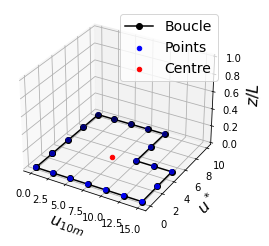

In [20]:
# testing data

#the loop
df_test = pd.DataFrame({
        'WS':    [0, 2.5, 5, 7.5, 10, 12.5, 15, 15,  15, 12.5,  10, 10,  10, 7.5, 5,  2.5, 0,  0,   0, 0], # x
        'ustar': [0, 0,   0, 0,   0,  0,    0,  2.5, 5,  5,     5,  7.5, 10, 10,  10, 10,  10, 7.5, 5, 2.5], # y
        'ZL':    [0, 0,   0, 0,   0,  0,    0,  0,   0,  0,     0,   0,  0,  0,   0,  0,   0,  0,   0, 0]  # z
    })
# we can easyly calculate the area by hand, a square 10x10 and a rectangle 10x5, so the area is 10x10 + 15x5 = 125
test_manually_calculated_area = 125

#the center (this is not the real center, but it is in the plane of the loop)
test_center = Orbit_center(df_test)
test_center_x, test_center_y, test_center_z = test_center

# The angles to rotate the plane (typical values)
test_angle_xz_deg = 160
test_angle_yz_deg = 15

# 3D plot of the loop, looking from the top

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(df_test['WS'], df_test['ustar'], df_test['ZL'], c='k', marker='o', label='Boucle')
ax.plot([np.array(df_test['WS'])[-1], np.array(df_test['WS'])[0]], 
        [np.array(df_test['ustar'])[-1], np.array(df_test['ustar'])[0]], 
        [np.array(df_test['ZL'])[-1], np.array(df_test['ZL'])[0]], c='k', marker='o')
ax.scatter(df_test['WS'], df_test['ustar'], df_test['ZL'], c='b', marker='o', label='Points')
ax.scatter(test_center_x, test_center_y, test_center_z, c='r', marker='o', label='Centre')
ax.set_xlabel('$u_{10m}$', fontsize=16)
ax.set_ylabel('$u^*$', fontsize=16)
ax.set_zlabel('$z/L$', fontsize=16)
ax.legend(prop={'size': 14})
ax.set_zlim([0, 1])
plt.savefig('./Plots_report/boucle_test.pdf', bbox_inches='tight')
plt.show()
plt.close()

# Test Rotation
### lets plot the points before and after and see if they have the same distance between them before and after

initial test distances:  [2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5
 2.5 2.5]
rotated test distances:  [2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5 2.5
 2.5 2.5]
test params:  [ 0.26054004  0.20411505 -0.71582788 -2.74229777]
initial angle_xz_deg:  160
angle_xz_deg        :  160.00000019850813
initial angle_yz_deg:  15
angle_yz_deg        :  14.999992617886903


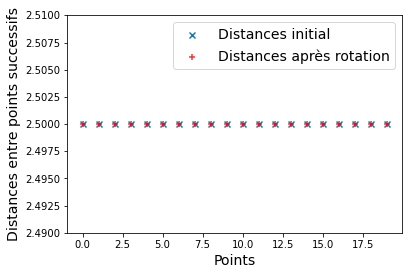

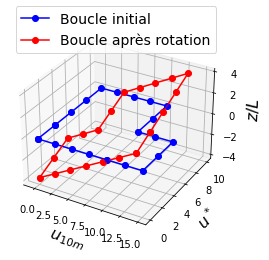

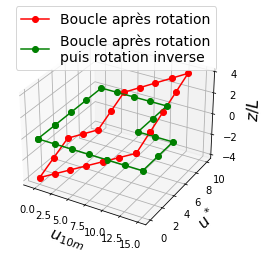

1.3386202912801792e-06


In [21]:
# Distance between each data point
def plane_distances(x, y, z):
    #convert x, y, z into arrays
    x = np.array(x)
    y = np.array(y)
    z = np.array(z)
    dist = []
    
    # Iterate over pairs of consecutive points
    for i in range(len(x) - 1):
        # Calculate distance between consecutive points
        dist.append(np.sqrt((x[i+1] - x[i])**2 + (y[i+1] - y[i])**2 + (z[i+1] - z[i])**2))

    # Add distance between last and first points to close the loop
    dist.append(np.sqrt((x[0] - x[-1])**2 + (y[0] - y[-1])**2 + (z[0] - z[-1])**2))

    # Convert to numpy array
    distances = np.array(dist)
    
    # Return the distances
    return distances

#initial test distances
test_distances = plane_distances(df_test['WS'], df_test['ustar'], df_test['ZL'])
print("initial test distances: ", test_distances)

# rotation of the plane (here we do the reverse, because the initial data is flat on the z axis, and it is normal not)
df_rotated_test = rotate_points_around_point(df_test, test_center, -test_angle_xz_deg, -test_angle_yz_deg, True)

# distances after rotation
rotated_distances = plane_distances(df_rotated_test['WS'], df_rotated_test['ustar'], df_rotated_test['ZL'])
print("rotated test distances: ", rotated_distances)

# fit the plane
test_params, test_var = fit_plane(df_rotated_test)
print("test params: ", test_params)

# find the angles
calculatred_angle_xz_deg_test, calculatred_angle_yz_deg_test, calculatred_angle_yz_after_xz_deg_test = plane_angles(test_params)

print("initial angle_xz_deg: ", test_angle_xz_deg)
print("angle_xz_deg        : ", calculatred_angle_xz_deg_test)
print("initial angle_yz_deg: ", test_angle_yz_deg)
print("angle_yz_deg        : ", calculatred_angle_yz_after_xz_deg_test)

# unrotation of the plane (the center sould not have changed)
df_unrotated_test = rotate_points_around_point(df_rotated_test, test_center, 
                                               calculatred_angle_xz_deg_test, calculatred_angle_yz_after_xz_deg_test)



# plot the distances
x_plot = np.arange(len(test_distances))
plt.scatter(x_plot, test_distances,    label='Distances initial',        marker='x')
plt.scatter(x_plot, rotated_distances, label='Distances après rotation', color='r', marker='+', alpha = 0.8)
plt.xlabel('Points', fontsize=14)
plt.ylabel('Distances entre points successifs', fontsize=14)
plt.ylim([2.49, 2.51])
plt.legend(prop={'size': 14})
plt.savefig('./Plots_report/Distence_entre_points_rot.pdf', bbox_inches='tight')
plt.show()
plt.close()




#plot the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# initial data
ax.scatter(df_test['WS'], df_test['ustar'], df_test['ZL'], c='b', marker='o')
ax.plot(df_test['WS'], df_test['ustar'], df_test['ZL'], c='b', marker='o', label='Boucle initial')
ax.plot([np.array(df_test['WS'])[-1], np.array(df_test['WS'])[0]], 
        [np.array(df_test['ustar'])[-1], np.array(df_test['ustar'])[0]], 
        [np.array(df_test['ZL'])[-1], np.array(df_test['ZL'])[0]], c='b', marker='o')
# rotated data
ax.scatter(df_rotated_test['WS'], df_rotated_test['ustar'], df_rotated_test['ZL'], c='r', marker='o')
ax.plot(df_rotated_test['WS'], df_rotated_test['ustar'], df_rotated_test['ZL'], c='r', marker='o', label='Boucle après rotation')
ax.plot([np.array(df_rotated_test['WS'])[-1], np.array(df_rotated_test['WS'])[0]], 
        [np.array(df_rotated_test['ustar'])[-1], np.array(df_rotated_test['ustar'])[0]], 
        [np.array(df_rotated_test['ZL'])[-1], np.array(df_rotated_test['ZL'])[0]], c='r', marker='o')
ax.set_xlabel('$u_{10m}$', fontsize=16)
ax.set_ylabel('$u^*$', fontsize=16)
ax.set_zlabel('$z/L$', fontsize=16)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1), prop={'size': 14})
plt.savefig('./Plots_report/Boucle_initial_et_rot.pdf', bbox_inches='tight')
plt.show()
plt.close()

#plot the 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# rotated data
ax.scatter(df_rotated_test['WS'], df_rotated_test['ustar'], df_rotated_test['ZL'], c='r', marker='o')
ax.plot(df_rotated_test['WS'], df_rotated_test['ustar'], df_rotated_test['ZL'], c='r', marker='o', label='Boucle après rotation')
ax.plot([np.array(df_rotated_test['WS'])[-1], np.array(df_rotated_test['WS'])[0]], 
        [np.array(df_rotated_test['ustar'])[-1], np.array(df_rotated_test['ustar'])[0]], 
        [np.array(df_rotated_test['ZL'])[-1], np.array(df_rotated_test['ZL'])[0]], c='r', marker='o')
# unrotated data
ax.scatter(df_unrotated_test['WS'], df_unrotated_test['ustar'], df_unrotated_test['ZL'], c='g', marker='o', )
ax.plot(df_unrotated_test['WS'], df_unrotated_test['ustar'], df_unrotated_test['ZL'], c='g', marker='o', label='Boucle après rotation\npuis rotation inverse')
ax.plot([np.array(df_unrotated_test['WS'])[-1], np.array(df_unrotated_test['WS'])[0]], 
        [np.array(df_unrotated_test['ustar'])[-1], np.array(df_unrotated_test['ustar'])[0]], 
        [np.array(df_unrotated_test['ZL'])[-1], np.array(df_unrotated_test['ZL'])[0]], c='g', marker='o')
ax.set_xlabel('$u_{10m}$', fontsize=16)
ax.set_ylabel('$u^*$', fontsize=16)
ax.set_zlabel('$z/L$', fontsize=16)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1), prop={'size': 14})
plt.savefig('./Plots_report/Boucle_rot_et_unrot.pdf', bbox_inches='tight')
plt.show()
plt.close()
print(df_unrotated_test['ZL'].max()-df_unrotated_test['ZL'].min())

In [22]:
df_test

,WS,ustar,ZL
0,0.0,0.0,0
1,2.5,0.0,0
2,5.0,0.0,0
3,7.5,0.0,0
4,10.0,0.0,0
5,12.5,0.0,0
6,15.0,0.0,0
7,15.0,2.5,0
8,15.0,5.0,0
9,12.5,5.0,0


# Test plane fit and angle retrival

In [23]:
df_unrotated_test

,WS,ustar,ZL
0,-4.035194e-09,6.277003e-09,5.563638e-07
1,2.500000e+00,4.035230e-09,5.647303e-07
2,5.000000e+00,1.793456e-09,5.730967e-07
3,7.500000e+00,-4.483169e-10,5.814631e-07
4,1.000000e+01,-2.690091e-09,5.898295e-07
5,1.250000e+01,-4.931864e-09,5.981959e-07
6,1.500000e+01,-7.173638e-09,6.065623e-07
7,1.500000e+01,2.500000e+00,2.844569e-07
8,1.500000e+01,5.000000e+00,-3.764856e-08
9,1.250000e+01,5.000000e+00,-4.601497e-08


# Test calc Aire

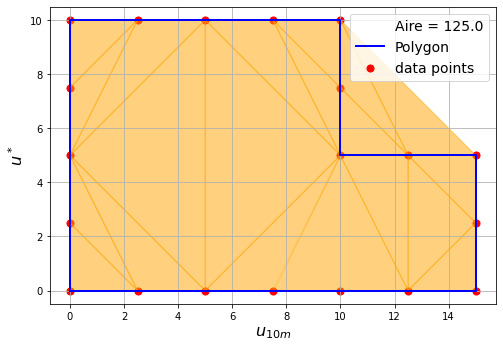

manually calculated area:  125
test area:  125.0
test area unrotated:  124.99999999999896


In [24]:
# fit the plane

test_area = calculate_enclosed_area(df_test, show_plot=True, verbose=True)
print("manually calculated area: ", test_manually_calculated_area)
print("test area: ", test_area)
print("test area unrotated: ", 124.99999999999896)


# Eigenvalues and Eigenvectors

In [25]:
def Eigenvalues_and_Eigenvectors(df):
    points = df[['WS', 'ustar', 'ZL']].to_numpy()
    # Center the data
    mean = np.mean(points, axis=0)
    centered_points = points - mean

    # Compute the covariance matrix
    cov_matrix = np.cov(centered_points, rowvar=False)

    # Perform eigenvalue decomposition
    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)

    # Sort the eigenvalues and eigenvectors in descending order
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]

    # Select the top two eigenvectors that form the plane
    plane_eigenvectors = eigenvectors[:, :2]

    # Compute the normal vector to the plane
    normal_vector = np.cross(plane_eigenvectors[:, 0], plane_eigenvectors[:, 1])

    # Plane equation: ax + by + cz = -d
    a, b, c = normal_vector
    d = -np.dot(normal_vector, mean)
    
    # Print the eigenvalues and eigenvectors
    #print("Eigenvalues:\n", eigenvalues)
    #print("\nEigenvectors:\n", eigenvectors)

    # Analyze the eigenvalues to determine if the points lie mostly in a plane
    variance_ratio = eigenvalues / np.sum(eigenvalues)
    #print("\nVariance ratio:\n", variance_ratio)
    #print("\n")

    # Sort in ascending order
    variance_ratio = np.sort(variance_ratio)
    # [1, 2, 3, 4]

    # Reverse the sorted array
    variance_ratio = variance_ratio[::-1]
    # [4, 3, 2, 1]

    return eigenvalues, eigenvectors, a, b, c, d, variance_ratio

# Normalize angles

In [26]:
def normalize_angle(angle):
    if angle < 0:
        return angle + 180
    else:
        return angle

In [120]:
def angle_between(v2):
    v1 = np.array([1, 0, 0])
    v1_u = v1 / np.linalg.norm(v1)
    v2_u = v2 / np.linalg.norm(v2)
    return np.arccos(np.dot(v1_u, v2_u)) * 180 / np.pi

# plot and calc all

In [123]:
def plot_with_plane(df, df_plot_label='Médiane', rot_x=60, rot_y=45, show_plot=False, verbose=False, 
                                     save_fig_name='No'):
    # Find center
    xc, yc, zc = Orbit_center(df)
    # Find eigenvalues and eigenvectors
    eigenvalues, eigenvectors, a, b, c, d, variance_ratio = Eigenvalues_and_Eigenvectors(df)
    plane_params = np.array([a, b, c, d])
    
    angle_axe_principal = angle_between(eigenvectors[0])
    
    # find the plane angles
    xz_angle_deg, yz_angle_deg, yz_angle_after_xz_rot_deg = plane_angles(plane_params)
    xz_angle_deg = normalize_angle(xz_angle_deg)
    yz_angle_deg = normalize_angle(yz_angle_deg)
    
    # Find the closest points in the plane
    df_points_in_plane, distances = closest_point_in_plane(df, plane_params)   
    
    # Find the center of the plane
    plane_center = Orbit_center(df_points_in_plane)
    xc_plane, yc_plane, zc_plane = plane_center
    var = np.var(distances)
    
    # Do a rotation of the points in the plane around the center to be in the x-y plane (WS-ustar plane)
    df_xy_points = rotate_points_around_point(df_points_in_plane, plane_center, 
                                                    xz_angle_deg, yz_angle_after_xz_rot_deg)
    
    
    # Find perimeter of data points
    perim = calculate_perimeter(df)

    # Find the area
    area = calculate_enclosed_area(df_xy_points, show_plot)

    if (show_plot == True):
        
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        #plot data
        ax.plot(df['WS'], df['ustar'], df['ZL'], alpha = 0.5, label = df_plot_label)  

        # Create a color gradient
        num_points = len(df['WS'])
        colors = np.linspace(0, 1, num_points)
        cmap = plt.get_cmap('viridis')
        ax.scatter( df['WS'], df['ustar'], df['ZL'], c=colors, cmap=cmap)

        # Create a scalar mappable to map the color values to colors in the colormap
        norm = Normalize(vmin=df['hour'].min(), vmax=df['hour'].max())
        sm = ScalarMappable(cmap='viridis', norm=norm)
        sm.set_array([])  # An array with no values is required

        # Add colorbar
        cbar = plt.colorbar(sm)
        cbar.set_label('heure', fontsize=14)
        
        
        if verbose == True:
            # plot the plane and mesh
            x = np.linspace(min(df['WS']), max(df['WS']), 10)
            y = np.linspace(min(df['ustar']), max(df['ustar']), 10)
            X, Y = np.meshgrid(x, y)

            #plane from optimize import curve_fit
            Z = ( -a * X - b * Y - d) / c            
            
            ax.plot_wireframe(X, Y, Z, color='r', alpha = 0.2, 
                              label='Plan:'
                                   +'\nAngles: $\\varphi_{u_{10m}}$ = '+str(round_n_decimal(xz_angle_deg,2))
                                   +'\N{DEGREE SIGN}, $\\varphi_{u^*}$ = '+str(round_n_decimal(yz_angle_deg,2))
                                   +'\N{DEGREE SIGN}'
                                   +"\nVariance = "+str(round_n_decimal(var,6))
                                   +'\nVariance ratios: ('+str(round_n_decimal(variance_ratio[0],2))
                                   +', '+str(round_n_decimal(variance_ratio[1],4))
                                   +', '+str(round_n_decimal(variance_ratio[2],6))+')'
                             )

            plt.plot([], [], ' ', label="Perimétre = "+str(round_n_decimal(perim,6))
                                     #+"\nPerimeter-Plan = "+str(round_n_decimal(perim_flat,6))
                                     +"\nAire   = "+str(round_n_decimal(area,6))
                                     
                    )
            
            #plot the center of the loop
            ax.scatter(xc, yc, zc, color = 'k', label = 'Centre: '
                                                               +'\n($u_{10m}=$'+str(round_n_decimal(xc,4))+', '
                                                                 +'$u^*=$'+str(round_n_decimal(yc,4))+', '
                                                                 +'$z/L=$' +str(round_n_decimal(zc,4))+')')

            ax.legend(loc='center left', bbox_to_anchor=(1.4, 0.5), prop={'size': 14})


        #rotate the fig to see better what's going on
        ax.view_init(rot_x, rot_y)

        ax.set_xlabel('$u_{10m}$', fontsize=16)
        ax.set_ylabel('$u^*$', fontsize=16)
        ax.set_zlabel('$z/L$', fontsize=16)

        if save_fig_name != 'No':
            plt.savefig('./Plots_report/'+save_fig_name+'_Eigen.pdf', bbox_inches='tight')
        plt.show()

        plt.close()

    return (xz_angle_deg, yz_angle_deg, xc, yc, zc, 
            var, perim, area, variance_ratio[0], variance_ratio[1], variance_ratio[2], 
            angle_axe_principal)

In [124]:
def seasonal_analysis(): # this is for seaborn plots
    #saisons = ['hiver', 'printemps', 'été', 'automne', 'toutes']
    saisons = ['hiver', 'printemps', 'été', 'automne']
    first_plot = True

    # create an empty dataframe
    df_loop = pd.DataFrame(columns=['station_id', 'station_loc', 'year', 'saison', 
                                    'xz_angle_deg', 'yz_angle_deg', 'xc', 'yc', 'zc', 
                                    'var', 'perim', 'area', 'var_ratio_1', 'var_ratio_2', 'var_ratio_3', 
                                    'angle_axe_principal'])
    
    # load station ids and locations
    df_station_loc = pd.read_pickle("Station_loc_info.pkl")
    station_ids  = df_station_loc['station_id']
    station_locs = df_station_loc['location']
    del df_station_loc

    n_season_in_this_loop = 0
    
    for i in range(len(station_ids)):
        station_id = station_ids[i]
        for year in df_raw_norm['year'].unique():
            for saison in saisons:
                print("station_id:", station_id, "year:", year, "saison:", saison)
                df_stations_norm = df_raw_norm[(df_raw_norm['station_id'] == station_id)]
                _, df_hourly_mean_norm, len_df = calculate_seasonal_hourly_median(df_stations_norm, 
                                                                             year=year, saison=saison)
                # check if it is an empty dataframe
                if len_df != 0:
                    n_season_in_this_loop += 1
                    print("len_df:", len_df)
                    results = plot_with_plane(df_hourly_mean_norm)
                    #plot_with_plane(df_station_med, "Médiane toutes saisons, station "+str(station_used), 
                    #        show_plot = show_plot, verbose=False, save_fig_name="Exemple_Boucle")
                    #print(df_raw_norm)
                    #print(df_hourly_mean_norm)
                    station_loc = df_hourly_mean_norm['station_loc'].unique()
                    #print(station_loc)
                    # Create a dictionary of results to append to the DataFrame
                    loop_dict = {
                        'station_id': station_id,
                        'station_loc': station_loc,
                        'year': year,
                        'saison': saison,

                        'xz_angle_deg': results[0],
                        'yz_angle_deg': results[1],
                        'xc': results[2],
                        'yc': results[3],
                        'zc': results[4],

                        'var': results[5],
                        'perim': results[6],
                        'area': results[7],
                        'var_ratio_1': results[8],
                        'var_ratio_2': results[9],
                        'var_ratio_3': results[10],
                        'var_ratio_12': results[8]/results[9],
                        'var_ratio_13': results[8]/results[10],
                        'var_ratio_23': results[9]/results[10],
                        
                        'angle_axe_principal': results[11]
                    }
                    # Append the dict to the DataFrame
                    df_loop = df_loop.append(loop_dict, ignore_index=True)

    print("n_season_in_this_loop:", n_season_in_this_loop)
    return df_loop

In [125]:
file_name_loop = "df_loop_saisons.pkl"
update = True
if (os.path.exists(file_name_loop) == False) or (update == True):
    df_loop_saisons_norm = seasonal_analysis()
    df_loop_saisons_norm.to_pickle(file_name_loop)  
else: 
    df_loop_saisons_norm = pd.read_pickle(file_name_loop)

station_id: 2 year: 2018.0 saison: hiver
station_id: 2 year: 2018.0 saison: printemps
len_df: 1781
station_id: 2 year: 2018.0 saison: été
station_id: 2 year: 2018.0 saison: automne
station_id: 2 year: 2020.0 saison: hiver
station_id: 2 year: 2020.0 saison: printemps
len_df: 1711
station_id: 2 year: 2020.0 saison: été
station_id: 2 year: 2020.0 saison: automne
station_id: 2 year: 2015.0 saison: hiver
station_id: 2 year: 2015.0 saison: printemps
station_id: 2 year: 2015.0 saison: été
station_id: 2 year: 2015.0 saison: automne
station_id: 2 year: 2016.0 saison: hiver
station_id: 2 year: 2016.0 saison: printemps
station_id: 2 year: 2016.0 saison: été
station_id: 2 year: 2016.0 saison: automne
station_id: 2 year: 2017.0 saison: hiver
station_id: 2 year: 2017.0 saison: printemps
station_id: 2 year: 2017.0 saison: été
station_id: 2 year: 2017.0 saison: automne
station_id: 2 year: 2019.0 saison: hiver
station_id: 2 year: 2019.0 saison: printemps
station_id: 2 year: 2019.0 saison: été
station_i

len_df: 1752
station_id: 10 year: 2016.0 saison: été
len_df: 1702
station_id: 10 year: 2016.0 saison: automne
len_df: 1724
station_id: 10 year: 2017.0 saison: hiver
station_id: 10 year: 2017.0 saison: printemps
len_df: 1925
station_id: 10 year: 2017.0 saison: été
len_df: 1994
station_id: 10 year: 2017.0 saison: automne
len_df: 1641
station_id: 10 year: 2019.0 saison: hiver
station_id: 10 year: 2019.0 saison: printemps
station_id: 10 year: 2019.0 saison: été
station_id: 10 year: 2019.0 saison: automne
station_id: 12 year: 2018.0 saison: hiver
len_df: 2015
station_id: 12 year: 2018.0 saison: printemps
len_df: 1721
station_id: 12 year: 2018.0 saison: été
len_df: 2203
station_id: 12 year: 2018.0 saison: automne
station_id: 12 year: 2020.0 saison: hiver
station_id: 12 year: 2020.0 saison: printemps
station_id: 12 year: 2020.0 saison: été
station_id: 12 year: 2020.0 saison: automne
station_id: 12 year: 2015.0 saison: hiver
station_id: 12 year: 2015.0 saison: printemps
station_id: 12 year: 20

station_id: 21 year: 2016.0 saison: été
len_df: 2194
station_id: 21 year: 2016.0 saison: automne
len_df: 2144
station_id: 21 year: 2017.0 saison: hiver
len_df: 1736
station_id: 21 year: 2017.0 saison: printemps
len_df: 2035
station_id: 21 year: 2017.0 saison: été
len_df: 2193
station_id: 21 year: 2017.0 saison: automne
len_df: 2043
station_id: 21 year: 2019.0 saison: hiver
station_id: 21 year: 2019.0 saison: printemps
station_id: 21 year: 2019.0 saison: été
station_id: 21 year: 2019.0 saison: automne
station_id: 22 year: 2018.0 saison: hiver
station_id: 22 year: 2018.0 saison: printemps
station_id: 22 year: 2018.0 saison: été
station_id: 22 year: 2018.0 saison: automne
len_df: 1890
station_id: 22 year: 2020.0 saison: hiver
station_id: 22 year: 2020.0 saison: printemps
len_df: 1809
station_id: 22 year: 2020.0 saison: été
station_id: 22 year: 2020.0 saison: automne
station_id: 22 year: 2015.0 saison: hiver
station_id: 22 year: 2015.0 saison: printemps
station_id: 22 year: 2015.0 saison: 

station_id: 28 year: 2019.0 saison: hiver
station_id: 28 year: 2019.0 saison: printemps
station_id: 28 year: 2019.0 saison: été
station_id: 28 year: 2019.0 saison: automne
station_id: 29 year: 2018.0 saison: hiver
station_id: 29 year: 2018.0 saison: printemps
station_id: 29 year: 2018.0 saison: été
station_id: 29 year: 2018.0 saison: automne
station_id: 29 year: 2020.0 saison: hiver
station_id: 29 year: 2020.0 saison: printemps
len_df: 1779
station_id: 29 year: 2020.0 saison: été
station_id: 29 year: 2020.0 saison: automne
len_df: 1667
station_id: 29 year: 2015.0 saison: hiver
station_id: 29 year: 2015.0 saison: printemps
station_id: 29 year: 2015.0 saison: été
station_id: 29 year: 2015.0 saison: automne
station_id: 29 year: 2016.0 saison: hiver
station_id: 29 year: 2016.0 saison: printemps
station_id: 29 year: 2016.0 saison: été
len_df: 2147
station_id: 29 year: 2016.0 saison: automne
station_id: 29 year: 2017.0 saison: hiver
station_id: 29 year: 2017.0 saison: printemps
len_df: 1860


In [126]:
df_loop_saisons_norm

,station_id,station_loc,year,saison,xz_angle_deg,yz_angle_deg,xc,yc,zc,var,perim,area,var_ratio_1,var_ratio_2,var_ratio_3,angle_axe_principal,var_ratio_12,var_ratio_13,var_ratio_23
0,2,[US-WA],2018.0,printemps,146.801205,71.551507,0.526719,0.319399,0.005232,0.000224,1.993612,0.102381,0.920533,0.076059,0.003409,97.692453,12.102918,270.064665,22.314013
1,2,[US-WA],2020.0,printemps,115.726141,72.877210,0.497653,0.321213,0.049401,0.000866,2.310578,0.007669,0.967932,0.020543,0.011525,99.430372,47.118138,83.982267,1.782377
2,3,[US-CA],2015.0,printemps,102.333386,78.096858,0.515676,0.420081,-0.009862,0.000064,1.557660,0.000945,0.899957,0.098515,0.001527,114.056512,9.135187,589.261879,64.504633
3,3,[US-CA],2015.0,été,106.810669,74.639971,0.604888,0.497553,-0.028085,0.000025,1.150575,0.002220,0.813887,0.185022,0.001091,118.199762,4.398856,746.267857,169.650434
4,3,[US-CA],2016.0,été,106.039396,75.626699,0.619613,0.504859,-0.030821,0.000033,1.122087,0.002587,0.818259,0.180032,0.001709,111.479756,4.545064,478.862704,105.358855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,35,[US-FL],2017.0,automne,98.665697,80.548524,0.276052,0.221639,0.177414,0.000109,2.365937,0.006061,0.987668,0.011249,0.001083,97.984528,87.802867,912.069614,10.387697
234,35,[US-FL],2019.0,hiver,98.950955,79.709092,0.276108,0.229883,0.199768,0.000053,2.168272,0.009278,0.972235,0.027185,0.000580,100.028521,35.763618,1677.403495,46.902512
235,35,[US-FL],2019.0,printemps,102.154614,79.836806,0.276344,0.242204,0.077183,0.000103,2.070886,0.015708,0.979454,0.019643,0.000903,102.179783,49.862602,1085.004035,21.759876
236,35,[US-FL],2019.0,été,97.128291,83.248609,0.213215,0.198067,0.019837,0.000088,1.967935,0.004562,0.962488,0.036498,0.001015,102.023351,26.371310,948.689461,35.974301


# Total average

In [148]:
def make_plots(station_used, year_used=0, season_used='toutes', show_plot = False, verbose = False):
    df_stations_norm = df_raw_norm[(df_raw_norm['station_id'] == station_used)]
    _, df_hourly_mean_norm, _ = calculate_seasonal_hourly_median(df_stations_norm, year=year_used, saison=season_used)
    labe_name = 'Médiane '+season_used+' '+str(year_used)+', station '+str(station_used)
    if (verbose == False) :
        plot_with_plane(df_hourly_mean_norm, labe_name, 
                        show_plot = show_plot, verbose=False, save_fig_name="Exemple_Boucle")
    if (verbose == True) :
        plot_with_plane(df_hourly_mean_norm, df_plot_label=labe_name, 
                        rot_x=110-90, rot_y=90-105, show_plot = show_plot, verbose=verbose, 
                        save_fig_name="Boucle_flat_station"+str(station_used)+"_year_"+str(year_used)+"_saison_"+season_used)

        plot_with_plane(df_hourly_mean_norm, df_plot_label=labe_name, 
                        rot_x=30, rot_y=110, show_plot = show_plot, verbose=verbose, 
                        save_fig_name="Boucle_station"+str(station_used)+"_year_"+str(year_used)+"_saison_"+season_used)
    
    df_stations_not_norm = df_raw[(df_raw['station_id'] == station_used)]
    _, df_hourly_mean_not_norm, _ = calculate_seasonal_hourly_median(df_stations_not_norm, year=year_used, 
                                                                     saison=season_used)
    if (verbose == False) :
        plot_with_plane(df_hourly_mean_not_norm, labe_name, 
                        show_plot = show_plot, verbose=False, save_fig_name="Exemple_Boucle_not_norm")
    if (verbose == True) :
        plot_with_plane(df_hourly_mean_not_norm, df_plot_label=labe_name, 
                        rot_x=110-90, rot_y=90-105, show_plot = show_plot, verbose=verbose, 
                        save_fig_name="Exemple_Boucle_all_plane_not_norm")

        plot_with_plane(df_hourly_mean_not_norm, df_plot_label=labe_name, 
                        rot_x=30, rot_y=110, show_plot = show_plot, verbose=verbose, 
                        save_fig_name="Exemple_Boucle_all_not_norm")
    
    return 

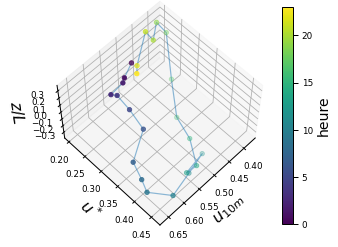

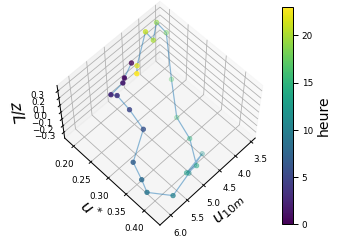

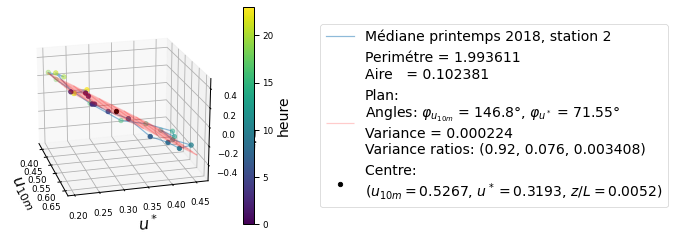

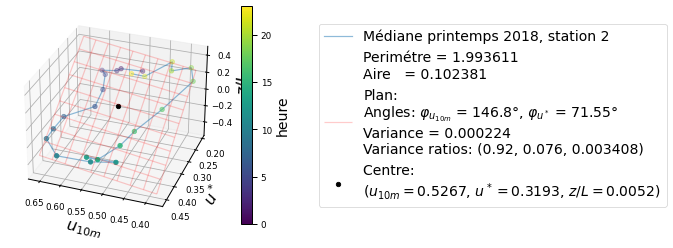

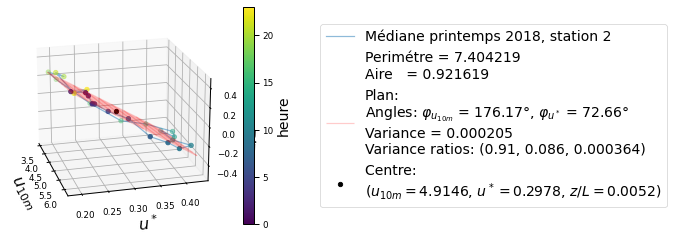

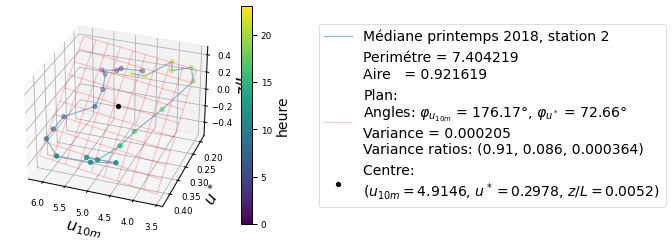

In [65]:
station_used = 2
make_plots(station_used, year_used=2018, season_used='printemps', show_plot = True, verbose = False)
make_plots(station_used, year_used=2018, season_used='printemps', show_plot = True, verbose = True)

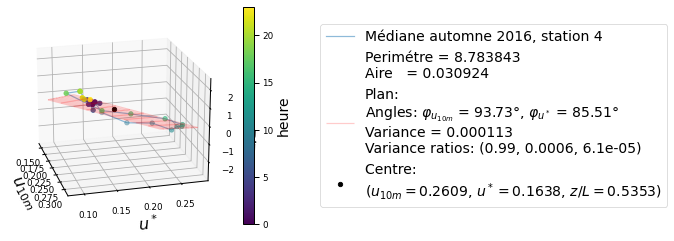

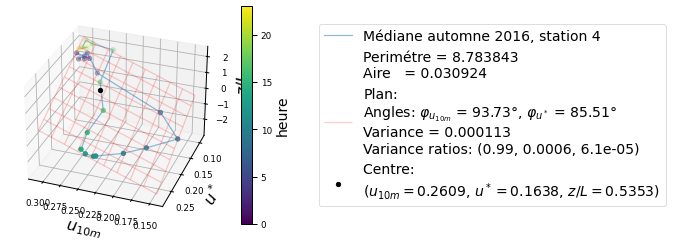

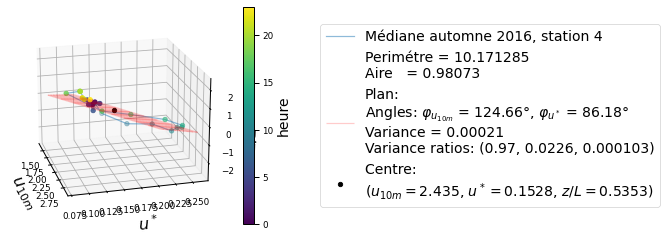

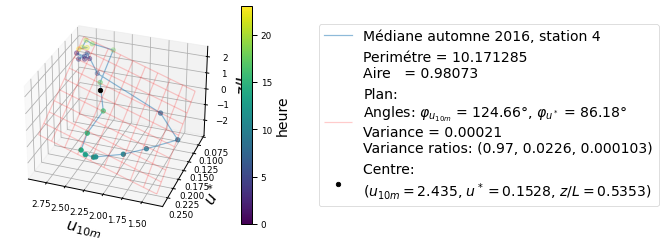

In [149]:
make_plots(4, year_used=2016, season_used='automne', show_plot = True, verbose = True)

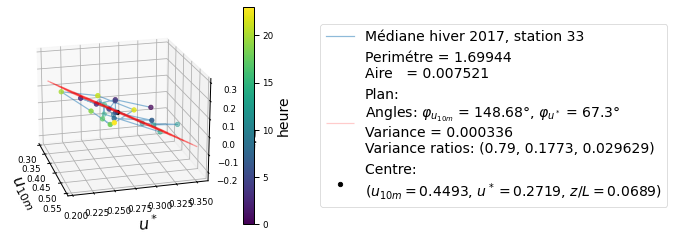

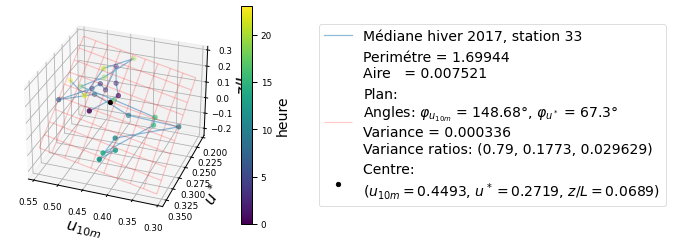

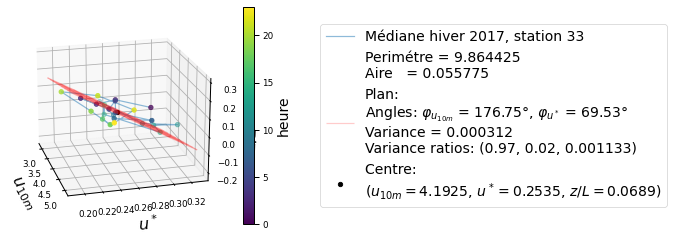

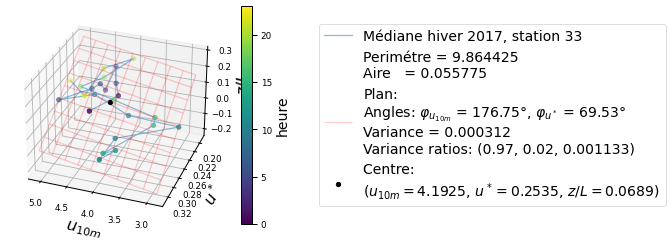

In [150]:
make_plots(33, year_used=2017, season_used='hiver', show_plot = True, verbose = True)

# Moyennes saisonières

In [33]:
'''# We want to normalize the data in WS and ustar the the highest hourly mean value over all season for each station.
def normalize_df(df):
    
    # Evaluate the loop
    hourly_avg = df.groupby(['hour']).median()
    hourly_avg = hourly_avg.reset_index()
    hourly_avg = hourly_avg[['hour', 'WS', 'ustar', 'ZL']]
    
    # find the highest hourly mean value
    WS_max    = hourly_avg['WS'].max()
    ustar_max = hourly_avg['ustar'].max()

    # Normalize the data
    normalized_df = df.copy()
    normalized_df['WS'] = df['WS'] / WS_max
    normalized_df['ustar'] = df['ustar'] / ustar_max

    return normalized_df'''

"# We want to normalize the data in WS and ustar the the highest hourly mean value over all season for each station.\ndef normalize_df(df):\n    \n    # Evaluate the loop\n    hourly_avg = df.groupby(['hour']).median()\n    hourly_avg = hourly_avg.reset_index()\n    hourly_avg = hourly_avg[['hour', 'WS', 'ustar', 'ZL']]\n    \n    # find the highest hourly mean value\n    WS_max    = hourly_avg['WS'].max()\n    ustar_max = hourly_avg['ustar'].max()\n\n    # Normalize the data\n    normalized_df = df.copy()\n    normalized_df['WS'] = df['WS'] / WS_max\n    normalized_df['ustar'] = df['ustar'] / ustar_max\n\n    return normalized_df"

In [34]:
'''def better_normalize_df(df):
    WS_maxes = []
    ustar_maxes = []
    station_id_maxeds = []
    for i in range(len(station_ids)):
        station_id  = station_ids[i]
        station_loc = station_locs[i]
        df_not_norm = load_data_data(station_id)
        df = normalize_df(df_not_norm)
        #print(station_id)
        for year in df['year'].unique():
            for saison in saisons:
                hourly_avg, n_hours = calculate_seasonal_hourly_median(df, year, saison)
                # nous ajoutons un critère qu'il doit y avoir au moins 75% des données afin que le résultat soit représentatif de la saison
                #print(n_hours, crit_75p_max)
                if int(n_hours) > int(crit_75p_max):
                    n_good_saisons += 1
                    #print('good')
                    hourly_avg = hourly_avg.reset_index()
                    hourly_avg = hourly_avg[['hour', 'WS', 'ustar', 'ZL']]

                    # find the highest hourly mean value
                    WS_max    = hourly_avg['WS'].max()
                    ustar_max = hourly_avg['ustar'].max()
                    
                    WS_maxes.append(WS_max)
                    ustar_maxes.append(ustar_max)
                    station_id_maxeds.append(station_id)
    
    # fint the max value for each station
    for station_id in station_ids:
        WS_max    = max(WS_maxes)
        ustar_max = max(ustar_maxes)
                    
                    
    # find the highest hourly mean value
    WS_max    = df['WS'].max()
    ustar_max = df['ustar'].max()

    # Normalize the data
    normalized_df = df.copy()
    normalized_df['WS'] = df['WS'] / WS_max
    normalized_df['ustar'] = df['ustar'] / ustar_max

    return normalized_df'''

"def better_normalize_df(df):\n    WS_maxes = []\n    ustar_maxes = []\n    station_id_maxeds = []\n    for i in range(len(station_ids)):\n        station_id  = station_ids[i]\n        station_loc = station_locs[i]\n        df_not_norm = load_data_data(station_id)\n        df = normalize_df(df_not_norm)\n        #print(station_id)\n        for year in df['year'].unique():\n            for saison in saisons:\n                hourly_avg, n_hours = calculate_seasonal_hourly_median(df, year, saison)\n                # nous ajoutons un critère qu'il doit y avoir au moins 75% des données afin que le résultat soit représentatif de la saison\n                #print(n_hours, crit_75p_max)\n                if int(n_hours) > int(crit_75p_max):\n                    n_good_saisons += 1\n                    #print('good')\n                    hourly_avg = hourly_avg.reset_index()\n                    hourly_avg = hourly_avg[['hour', 'WS', 'ustar', 'ZL']]\n\n                    # find the highest hou

In [35]:
# Ici, je veux dessiner le cycle diurne de chacun des 3 params
# pour : -total de toutes les stations et toutes les saisons
#        -toutes les stations, mais pour chaque saisons
#        -Pour chaque saison, pour chaque région

# Le plus simple serait de calculer la boucle pour chaque saison (qui a au moins 75% des données)
# le df doit avoir: station_loc, saison, WS, ustar, ZL (et on garde juste les 75%+)

# For the decompositions

In [37]:
# Define the sine wave parameters
B1 = 2 * np.pi / 24
B2 = 4 * np.pi / 24


# Define the sine wave function
def sin_cycle(x, A, B, C):
    wave = A * np.sin(B * x + C)
    return wave

# Define the model function: a combination of two sine waves
def sine_wave_model(x, A1, C1, A2, C2):

    wave_1 = sin_cycle(x, A1, B1, C1)
    wave_2 = sin_cycle(x, A2, B2, C2)
    return wave_1 + wave_2

In [38]:
import numpy as np
import scipy.stats as stats

def chi_squared_test(observed, fitted):
    observed = np.array(observed)
    fitted = np.array(fitted)
    # Calculate the chi-squared statistic
    chi2 = np.sum((observed - fitted) ** 2 / np.abs(fitted))

    # Degrees of freedom
    num_data_points = len(observed)
    num_parameters = 4  # given function's degrees of freedom
    degrees_of_freedom = num_data_points - num_parameters
    
    # Calculate reduced chi-squared statistic
    reduced_chi2 = chi2 / degrees_of_freedom

    # Calculate the p-value
    p_value = 1 - stats.chi2.cdf(chi2, degrees_of_freedom)

    return chi2, degrees_of_freedom, p_value, reduced_chi2

In [127]:
def Cycle_Diurne(saison, param_name, sation_loc_id='toutes', file_name='None'):

    # Filter the DataFrame for rows of a saison
    if saison == 'toutes':
        df_season = df_raw_norm
    else:
        df_season = df_raw_norm[df_raw_norm['saison'] == saison]
        
    # For specific location
    if (sation_loc_id != 'toutes'):
        df_season = df_season[df_season['station_loc'] == sation_loc_id]

    print(df_season[['station_id', 'saison', 'year']].drop_duplicates().reset_index(drop=True))
    print(df_season[['station_id', 'saison', 'year']].drop_duplicates().shape[0])
    
    # If we have no season that fulfil the requirement, exit
    if df_season.empty:
        print("not seasons")
        return
        
    # How many season are used in this average
    N_season_used = len(df_season)
    print('N hour used: ', N_season_used)
    
    # Calculate the mean param value for each hour 
    med_param_saison_per_hour = df_season.groupby('hour')[param_name].median().reset_index()
    #med_param_saison_per_hour = df_season.groupby('hour')[param_name].mean().reset_index()
    
    # Extract hours and average values
    hours  = med_param_saison_per_hour['hour'].values
    med_param = med_param_saison_per_hour[param_name].values
    
    # Center the WS values by subtracting the mean
    param_centered = med_param - np.mean(med_param)

    # Fit the model to the data
    initial_guess = [1, 0, 1, 0]  # Initial guess for the parameters
    params, params_covariance = curve_fit(sine_wave_model, hours, param_centered, p0=initial_guess)
    A1, C1, A2, C2, = params

    # Generate data for the fitted curve
    hours_fit = np.linspace(0, 23, 1000)
    ws_fit = sine_wave_model(hours_fit, *params)
    ws_wave1 = sin_cycle(hours_fit, A1, B1, C1)
    ws_wave2 = sin_cycle(hours_fit, A2, B2, C2)

    # Find the hour of the peak
    hour_peak = hours_fit[np.argmax(ws_fit)]
    peak_value = np.max(ws_fit)
    print(hour_peak, np.floor(hour_peak))
    peak_h = int(np.floor(hour_peak))
    peak_min = str(int((hour_peak-peak_h)*60))
    # since this can be between 0 and 9, to add a '0' at the beginning to not read say :4 instead of :04
    if len(peak_min) == 1:  # Check if the string has only one character
        peak_min = '0' + peak_min
        
    # Find the hour of the min
    hour_min = hours_fit[np.argmin(ws_fit)]
    min_value = np.min(ws_fit)
    print(hour_min, np.floor(hour_min))
    min_h = int(np.floor(hour_min))
    min_min = str(int((hour_min-min_h)*60))
    # since this can be between 0 and 9, to add a '0' at the beginning to not read say :4 instead of :04
    if len(min_min) == 1:  # Check if the string has only one character
        min_min = '0' + min_min

    
    # Calculate residuals and variance
    residuals = param_centered - sine_wave_model(hours, *params)
    variance = np.var(residuals)
    
    # Calculate Chi2 here 
    chi2, degrees_of_freedom, p_value, reduced_chi2 = chi_squared_test(param_centered, sine_wave_model(hours, *params))
    print(f"Chi2 = {chi2}, degrees of freedom = {degrees_of_freedom}, p-value = {p_value}, reduced chi2 = {reduced_chi2}")
    
    #before plotting, lets add the average back so that we know what the values are
    param_centered += np.mean(med_param)
    ws_wave1 += np.mean(med_param)
    ws_wave2 += np.mean(med_param)
    ws_fit += np.mean(med_param)
    peak_value += np.mean(med_param)
    min_value += np.mean(med_param)
    
    # Plot the results
    plt.figure(figsize=(10, 4))
    #plt.scatter(hours, sine_wave_model(hours, *params), color='gray', label='fit points test')
    plt.scatter(hours, param_centered, color='skyblue', label='Médiane horaire')
    plt.plot(hours_fit, ws_wave1, color='blue', linestyle='--', label='Cycle diurne\nAmplitude = '+str(round_n_decimal(abs(A1), 3)))
    plt.plot(hours_fit, ws_wave2, color='green', linestyle='--', label='Cycle semidiurne\nAmplitude = '+str(round_n_decimal(abs(A2), 3)))
    plt.scatter(hour_peak, peak_value, color='black', label=f'Max à '+str(peak_h)+':'+peak_min)
    if param_name == 'ZL':
        plt.scatter(hour_min, min_value, color='purple', label=f'Min à '+str(min_h)+':'+min_min)
    plt.plot(hours_fit, ws_fit, color='red', label='Cycle total\nVar = '+str(round_n_decimal(variance, 6)))
    plt.plot([], [], ' ', label="$\chi^2_{\\nu} = $"+str(round_n_decimal(reduced_chi2,4)) )
    plt.xlim(0, 23)
    plt.xlabel('Heure', fontsize=18)
    if param_name == 'ustar':
        plt.ylabel('$u^*$', fontsize=18)
    elif param_name == 'WS':
        plt.ylabel('$u_{10m}$', fontsize=18)
    elif param_name == 'ZL':
        plt.ylabel('$z/L$', fontsize=18)
    plt.legend(loc='upper center', bbox_to_anchor=(1.2025, 1.04), prop={'size': 17})
    plt.grid(True)
    print(file_name)
    print(file_name != 'None')
    if file_name != 'None':
        print('saving')
        plt.savefig('./Plots_report/'+file_name+str('.pdf'), bbox_inches='tight')
    plt.show()
    plt.close()

    # Print the fitted parameters
    print("Fitted parameters:")
    print("peak_value =", hour_peak)
    print("C1 =", C1)
    print("C2 =", C2)
    print("Number of season averaged:", N_season_used)
    


WS hiver US-WA
WS_hiver_US-WA
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
WS hiver US-CA
WS_hiver_US-CA
  station_id saison    year
0          4  hiver  2015.0
1          4  hiver  2016.0
2          4  hiver  2017.0
3          4  hiver  2018.0
4          4  hiver  2019.0
5          4  hiver  2020.0
6         17  hiver  2019.0
7         17  hiver  2020.0
8
N hour used:  6776
1.933933933933934 1.0
10.636636636636638 10.0
Chi2 = 1.0253317690899633, degrees of freedom = 20, p-value = 0.9999999997829421, reduced chi2 = 0.05126658845449816
WS_hiver_US-CA
True
saving


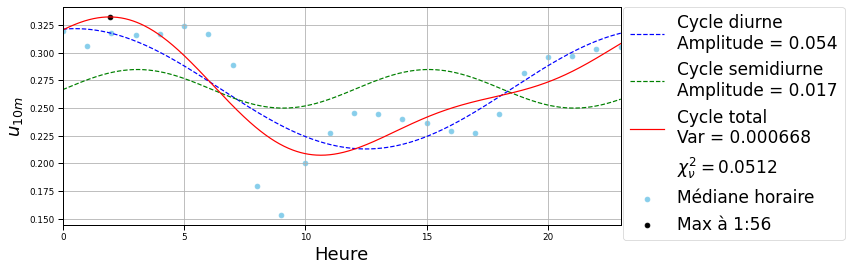

Fitted parameters:
peak_value = 1.933933933933934
C1 = 1.440890107513856
C2 = -0.0426709204012892
Number of season averaged: 6776
WS hiver US-MN
WS_hiver_US-MN
   station_id saison    year
0           9  hiver  2017.0
1           9  hiver  2018.0
2           9  hiver  2019.0
3           9  hiver  2020.0
4          20  hiver  2016.0
5          20  hiver  2017.0
6          20  hiver  2018.0
7          20  hiver  2019.0
8          20  hiver  2020.0
9          25  hiver  2017.0
10         25  hiver  2018.0
11         25  hiver  2019.0
12         25  hiver  2020.0
13
N hour used:  18071
13.583583583583584 13.0
5.778778778778779 5.0
Chi2 = 0.07326537382769138, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0036632686913845693
WS_hiver_US-MN
True
saving


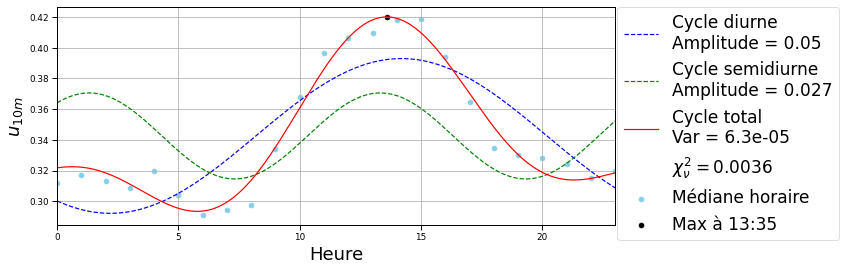

Fitted parameters:
peak_value = 13.583583583583584
C1 = 0.9971376069445168
C2 = 0.879348566786491
Number of season averaged: 18071
WS hiver US-IL
WS_hiver_US-IL
  station_id saison    year
0         10  hiver  2017.0
1         10  hiver  2018.0
2
N hour used:  1785
12.800800800800802 12.0
21.204204204204206 21.0
Chi2 = 0.09352917260880067, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.004676458630440033
WS_hiver_US-IL
True
saving


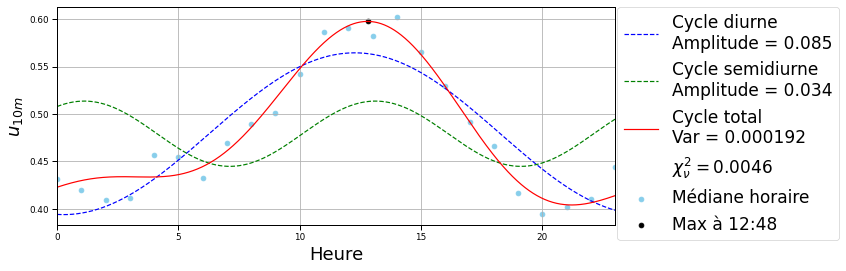

Fitted parameters:
peak_value = 12.800800800800802
C1 = 1.5008276606485602
C2 = 0.9862265685200828
Number of season averaged: 1785
WS hiver US-ID
WS_hiver_US-ID
  station_id saison    year
0         12  hiver  2017.0
1         12  hiver  2018.0
2         21  hiver  2015.0
3         21  hiver  2016.0
4         21  hiver  2017.0
5         21  hiver  2018.0
6         33  hiver  2016.0
7         33  hiver  2017.0
8         33  hiver  2018.0
9
N hour used:  11236
1.910910910910911 1.0
13.353353353353354 13.0
Chi2 = 0.5110441842970687, degrees of freedom = 20, p-value = 0.9999999999997408, reduced chi2 = 0.025552209214853433
WS_hiver_US-ID
True
saving


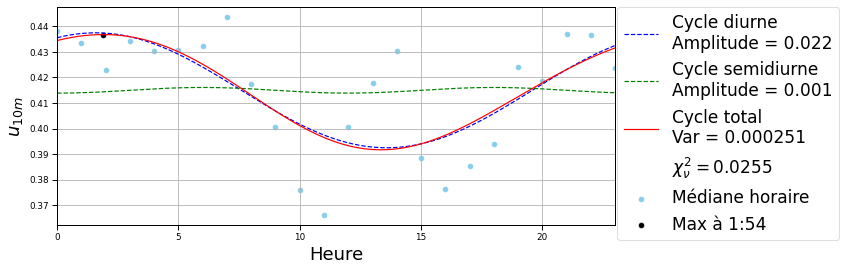

Fitted parameters:
peak_value = 1.910910910910911
C1 = 1.1550697099808653
C2 = -1.5661556697005792
Number of season averaged: 11236
WS hiver CA-ON
WS_hiver_CA-ON
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
WS hiver US-AZ
WS_hiver_US-AZ
  station_id saison    year
0         30  hiver  2016.0
1         30  hiver  2017.0
2
N hour used:  2142
15.126126126126128 15.0
8.587587587587588 8.0
Chi2 = 3.5226082533839493, degrees of freedom = 20, p-value = 0.9999838489503855, reduced chi2 = 0.17613041266919746
WS_hiver_US-AZ
True
saving


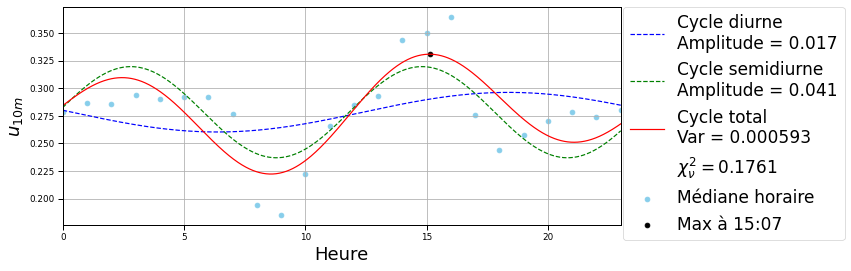

Fitted parameters:
peak_value = 15.126126126126128
C1 = -0.09763944628460934
C2 = 0.10309406869009545
Number of season averaged: 2142
WS hiver US-DE
WS_hiver_US-DE
  station_id saison    year
0         31  hiver  2016.0
1         31  hiver  2017.0
2
N hour used:  1925
11.810810810810812 11.0
19.24724724724725 19.0
Chi2 = 11.474042484866649, degrees of freedom = 20, p-value = 0.932991146085278, reduced chi2 = 0.5737021242433324
WS_hiver_US-DE
True
saving


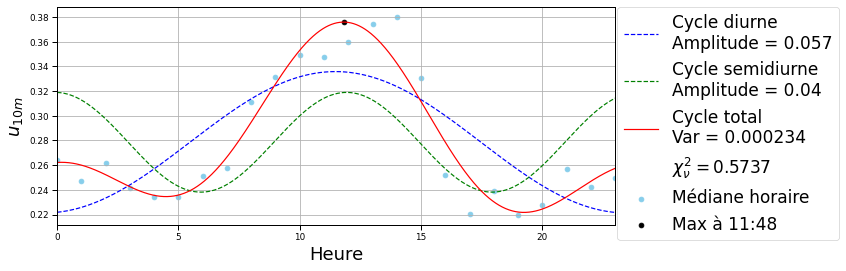

Fitted parameters:
peak_value = 11.810810810810812
C1 = -1.4326239743314144
C2 = 1.6075099296450115
Number of season averaged: 1925
WS hiver US-FL
WS_hiver_US-FL
  station_id saison    year
0         35  hiver  2018.0
1         35  hiver  2019.0
2
N hour used:  2052
12.455455455455457 12.0
3.9829829829829833 3.0
Chi2 = 0.13985502461691005, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.006992751230845503
WS_hiver_US-FL
True
saving


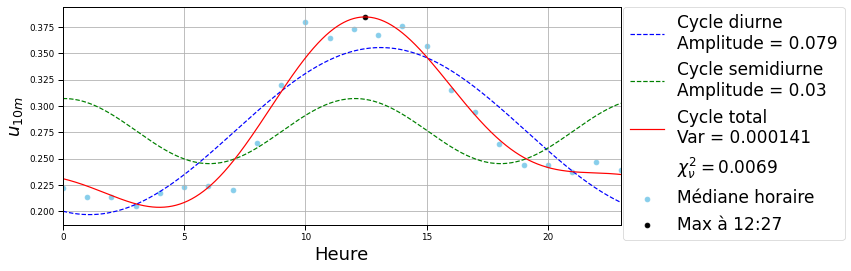

Fitted parameters:
peak_value = 12.455455455455457
C1 = 1.2828575807816942
C2 = 1.548193260001728
Number of season averaged: 2052
WS hiver toutes
WS_hiver_toutes
   station_id saison    year
0           4  hiver  2015.0
1           4  hiver  2016.0
2           4  hiver  2017.0
3           4  hiver  2018.0
4           4  hiver  2019.0
5           4  hiver  2020.0
6           9  hiver  2017.0
7           9  hiver  2018.0
8           9  hiver  2019.0
9           9  hiver  2020.0
10         10  hiver  2017.0
11         10  hiver  2018.0
12         12  hiver  2017.0
13         12  hiver  2018.0
14         17  hiver  2019.0
15         17  hiver  2020.0
16         20  hiver  2016.0
17         20  hiver  2017.0
18         20  hiver  2018.0
19         20  hiver  2019.0
20         20  hiver  2020.0
21         21  hiver  2015.0
22         21  hiver  2016.0
23         21  hiver  2017.0
24         21  hiver  2018.0
25         25  hiver  2017.0
26         25  hiver  2018.0
27         25  hiver  2019

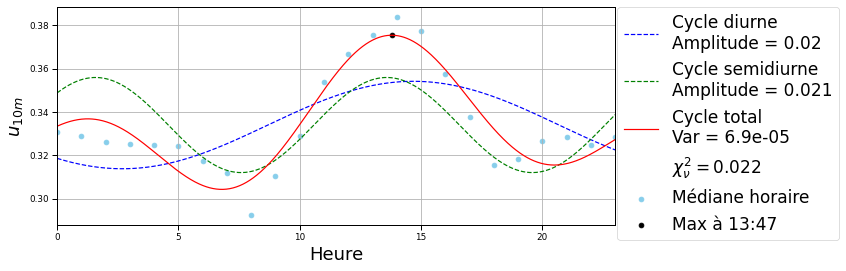

Fitted parameters:
peak_value = 13.790790790790792
C1 = 0.8670840490559046
C2 = 0.7422407889338875
Number of season averaged: 43987
WS printemps US-WA
WS_printemps_US-WA
  station_id     saison    year
0          2  printemps  2018.0
1          2  printemps  2020.0
2          5  printemps  2018.0
3
N hour used:  5261
9.853853853853854 9.0
19.04004004004004 19.0
Chi2 = 0.45843973198925625, degrees of freedom = 20, p-value = 0.9999999999999104, reduced chi2 = 0.02292198659946281
WS_printemps_US-WA
True
saving


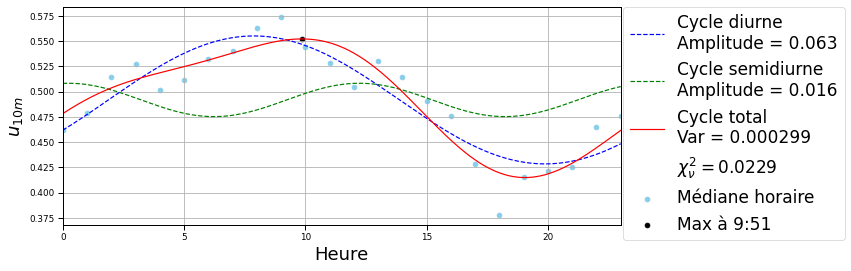

Fitted parameters:
peak_value = 9.853853853853854
C1 = -0.4925329294126579
C2 = 1.4513037799386934
Number of season averaged: 5261
WS printemps US-CA
WS_printemps_US-CA
   station_id     saison    year
0           3  printemps  2015.0
1           4  printemps  2015.0
2           4  printemps  2016.0
3           4  printemps  2017.0
4           4  printemps  2018.0
5           4  printemps  2019.0
6           4  printemps  2020.0
7          14  printemps  2017.0
8          14  printemps  2018.0
9          14  printemps  2019.0
10         14  printemps  2020.0
11         15  printemps  2019.0
12         17  printemps  2015.0
13         17  printemps  2016.0
14         17  printemps  2017.0
15         17  printemps  2018.0
16         17  printemps  2019.0
17         17  printemps  2020.0
18         22  printemps  2019.0
19         22  printemps  2020.0
20         23  printemps  2015.0
21         23  printemps  2017.0
22         23  printemps  2018.0
23         23  printemps  2019.0
24    

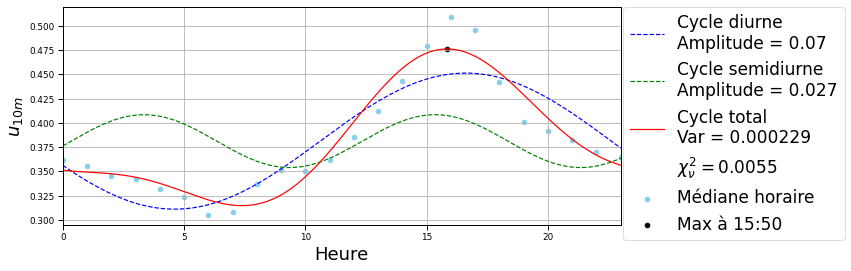

Fitted parameters:
peak_value = 15.839839839839842
C1 = 0.3639932410314793
C2 = -0.18198808497896585
Number of season averaged: 57454
WS printemps US-MN
WS_printemps_US-MN
   station_id     saison    year
0           9  printemps  2017.0
1           9  printemps  2019.0
2          20  printemps  2016.0
3          20  printemps  2017.0
4          20  printemps  2018.0
5          20  printemps  2019.0
6          20  printemps  2020.0
7          25  printemps  2017.0
8          25  printemps  2018.0
9          25  printemps  2019.0
10         25  printemps  2020.0
11
N hour used:  20566
13.537537537537538 13.0
4.673673673673674 4.0
Chi2 = 0.19289903447298262, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.00964495172364913
WS_printemps_US-MN
True
saving


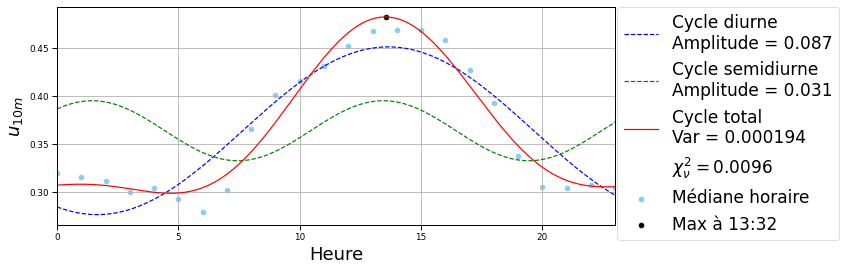

Fitted parameters:
peak_value = 13.537537537537538
C1 = 1.1392830000709322
C2 = 0.8149693198289806
Number of season averaged: 20566
WS printemps US-IL
WS_printemps_US-IL
  station_id     saison    year
0         10  printemps  2016.0
1         10  printemps  2017.0
2         10  printemps  2018.0
3         27  printemps  2016.0
4         27  printemps  2018.0
5
N hour used:  8888
13.238238238238239 13.0
1.2662662662662663 1.0
Chi2 = 0.1868420579404165, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009342102897020825
WS_printemps_US-IL
True
saving


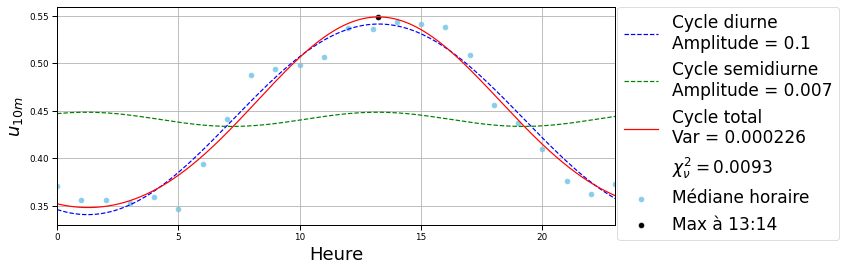

Fitted parameters:
peak_value = 13.238238238238239
C1 = 1.2421201246213822
C2 = 0.9404928366666371
Number of season averaged: 8888
WS printemps US-ID
WS_printemps_US-ID
   station_id     saison    year
0          12  printemps  2016.0
1          12  printemps  2017.0
2          12  printemps  2018.0
3          19  printemps  2016.0
4          19  printemps  2017.0
5          19  printemps  2018.0
6          21  printemps  2015.0
7          21  printemps  2017.0
8          21  printemps  2018.0
9          33  printemps  2016.0
10         33  printemps  2017.0
11         33  printemps  2018.0
12
N hour used:  23516
14.343343343343344 14.0
7.344344344344345 7.0
Chi2 = 0.22352455610029137, degrees of freedom = 20, p-value = 0.9999999999999999, reduced chi2 = 0.01117622780501457
WS_printemps_US-ID
True
saving


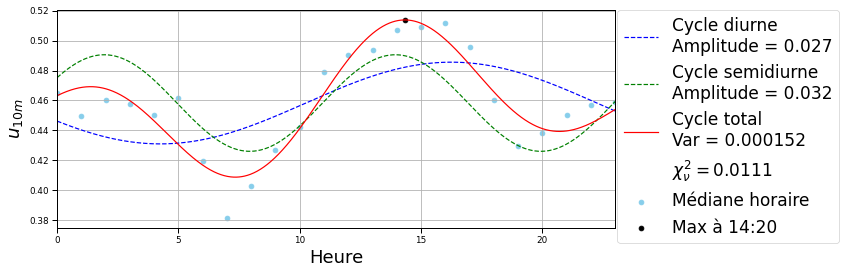

Fitted parameters:
peak_value = 14.343343343343344
C1 = 0.4583271164933557
C2 = 0.554699765528123
Number of season averaged: 23516
WS printemps CA-ON
WS_printemps_CA-ON
  station_id     saison    year
0         24  printemps  2016.0
1         24  printemps  2019.0
2         24  printemps  2020.0
3
N hour used:  5099
13.721721721721723 13.0
2.2562562562562563 2.0
Chi2 = 0.2614892928679411, degrees of freedom = 20, p-value = 0.9999999999999997, reduced chi2 = 0.013074464643397055
WS_printemps_CA-ON
True
saving


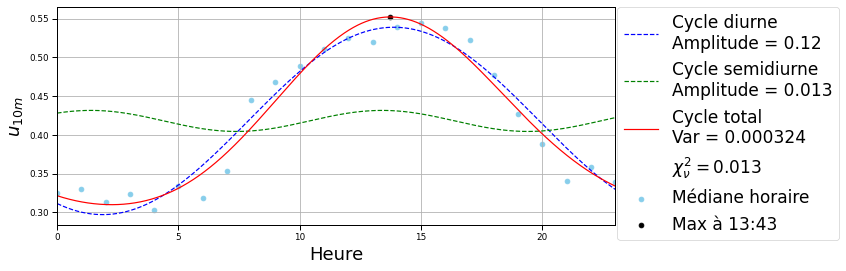

Fitted parameters:
peak_value = 13.721721721721723
C1 = 1.0797302770419575
C2 = 0.839262308893896
Number of season averaged: 5099
WS printemps US-AZ
WS_printemps_US-AZ
  station_id     saison    year
0         30  printemps  2015.0
1         30  printemps  2016.0
2         30  printemps  2017.0
3         30  printemps  2018.0
4
N hour used:  7999
15.37937937937938 15.0
8.127127127127128 8.0
Chi2 = 0.5515767258452704, degrees of freedom = 20, p-value = 0.999999999999454, reduced chi2 = 0.02757883629226352
WS_printemps_US-AZ
True
saving


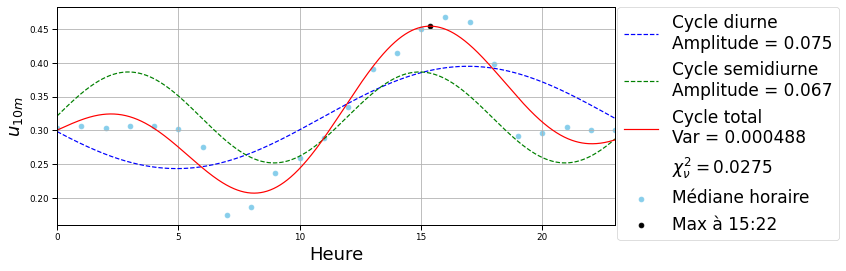

Fitted parameters:
peak_value = 15.37937937937938
C1 = 0.28042634534875993
C2 = 0.032760293297723155
Number of season averaged: 7999
WS printemps US-DE
WS_printemps_US-DE
  station_id     saison    year
0         31  printemps  2017.0
1
N hour used:  2087
12.961961961961963 12.0
2.0720720720720722 2.0
Chi2 = 0.2567266776272492, degrees of freedom = 20, p-value = 0.9999999999999997, reduced chi2 = 0.01283633388136246
WS_printemps_US-DE
True
saving


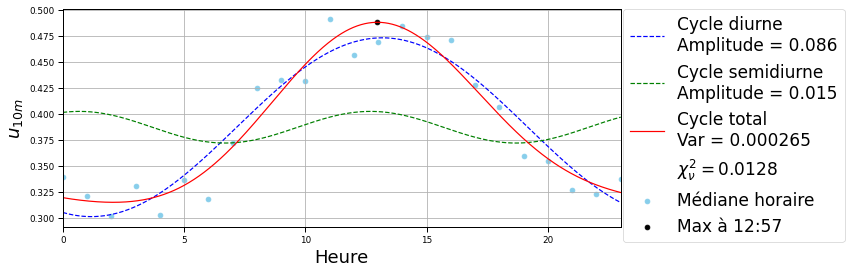

Fitted parameters:
peak_value = 12.961961961961963
C1 = 1.2643749566782496
C2 = 1.2123468455157669
Number of season averaged: 2087
WS printemps US-FL
WS_printemps_US-FL
  station_id     saison    year
0         35  printemps  2017.0
1         35  printemps  2019.0
2
N hour used:  4261
13.62962962962963 13.0
2.095095095095095 2.0
Chi2 = 0.6900635324620245, degrees of freedom = 20, p-value = 0.9999999999951829, reduced chi2 = 0.03450317662310122
WS_printemps_US-FL
True
saving


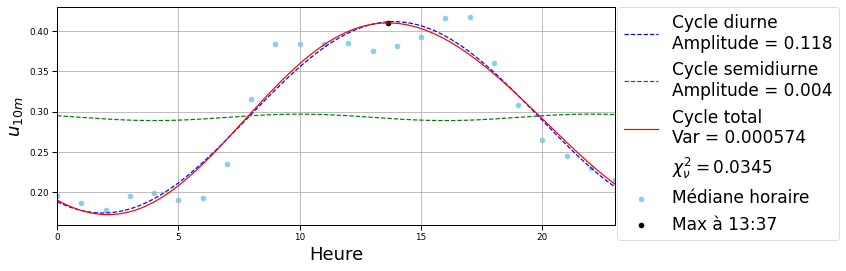

Fitted parameters:
peak_value = 13.62962962962963
C1 = 1.0789770432120467
C2 = -0.5236755936419834
Number of season averaged: 4261
WS printemps toutes
WS_printemps_toutes
   station_id     saison    year
0           2  printemps  2018.0
1           2  printemps  2020.0
2           3  printemps  2015.0
3           4  printemps  2015.0
4           4  printemps  2016.0
..        ...        ...     ...
67         33  printemps  2016.0
68         33  printemps  2017.0
69         33  printemps  2018.0
70         35  printemps  2017.0
71         35  printemps  2019.0

[72 rows x 3 columns]
72
N hour used:  135131
14.573573573573574 14.0
6.055055055055055 6.0
Chi2 = 0.19863477873447685, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009931738936723843
WS_printemps_toutes
True
saving


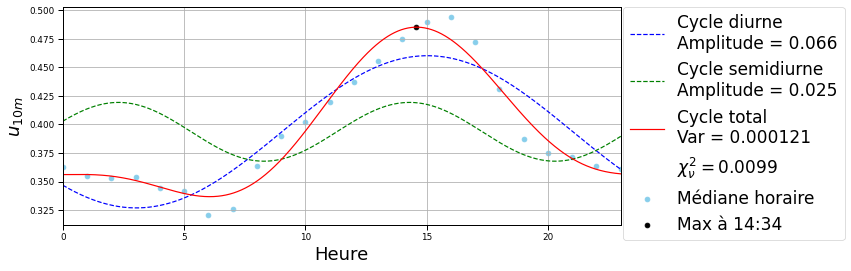

Fitted parameters:
peak_value = 14.573573573573574
C1 = 0.77740754663492
C2 = 0.36907856322311716
Number of season averaged: 135131
WS été US-WA
WS_été_US-WA
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
WS été US-CA
WS_été_US-CA
   station_id saison    year
0           3    été  2015.0
1           3    été  2016.0
2           3    été  2017.0
3           4    été  2015.0
4           4    été  2016.0
5           4    été  2017.0
6           4    été  2018.0
7           4    été  2019.0
8           4    été  2020.0
9           6    été  2015.0
10          6    été  2016.0
11          6    été  2017.0
12          6    été  2018.0
13          6    été  2019.0
14          6    été  2020.0
15         14    été  2017.0
16         14    été  2018.0
17         14    été  2019.0
18         15    été  2018.0
19         15    été  2019.0
20         17    été  2015.0
21         17    été  2016.0
22         17    été  2017.0
23         17    été  2018.0
24         17  

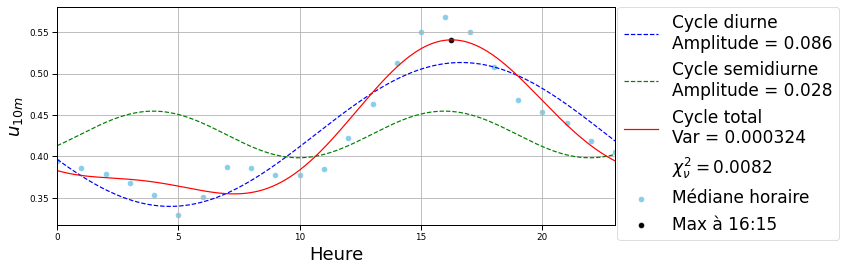

Fitted parameters:
peak_value = 16.254254254254256
C1 = 0.35304866419549547
C2 = -0.5028828688443939
Number of season averaged: 73096
WS été US-MN
WS_été_US-MN
   station_id saison    year
0           9    été  2017.0
1           9    été  2018.0
2           9    été  2019.0
3          20    été  2016.0
4          20    été  2017.0
5          20    été  2018.0
6          20    été  2019.0
7          25    été  2017.0
8          25    été  2018.0
9          25    été  2019.0
10         25    été  2020.0
11
N hour used:  20977
13.284284284284285 13.0
22.562562562562565 22.0
Chi2 = 0.19351143021671613, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009675571510835807
WS_été_US-MN
True
saving


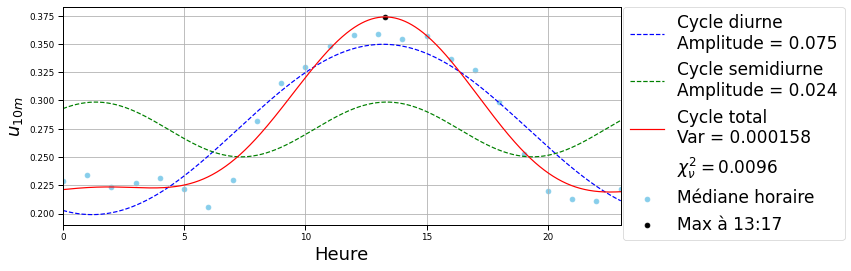

Fitted parameters:
peak_value = 13.284284284284285
C1 = 1.2546549872342345
C2 = 0.8614486254862788
Number of season averaged: 20977
WS été US-IL
WS_été_US-IL
  station_id saison    year
0         10    été  2016.0
1         10    été  2017.0
2         27    été  2016.0
3         27    été  2017.0
4         27    été  2018.0
5
N hour used:  8726
13.215215215215217 13.0
2.2792792792792795 2.0
Chi2 = 1.4725630211686063, degrees of freedom = 20, p-value = 0.9999999933805978, reduced chi2 = 0.07362815105843032
WS_été_US-IL
True
saving


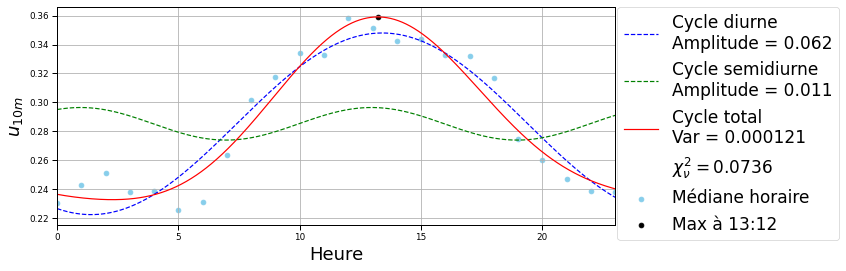

Fitted parameters:
peak_value = 13.215215215215217
C1 = 1.2044004783104603
C2 = 1.0680687548451464
Number of season averaged: 8726
WS été US-ID
WS_été_US-ID
   station_id saison    year
0          12    été  2015.0
1          12    été  2016.0
2          12    été  2017.0
3          12    été  2018.0
4          19    été  2015.0
5          19    été  2016.0
6          19    été  2017.0
7          19    été  2018.0
8          21    été  2015.0
9          21    été  2016.0
10         21    été  2017.0
11         21    été  2018.0
12         33    été  2015.0
13         33    été  2016.0
14         33    été  2017.0
15         33    été  2018.0
16
N hour used:  34248
0.920920920920921 0.0
7.68968968968969 7.0
Chi2 = 3.421820646462856, degrees of freedom = 20, p-value = 0.9999873604131299, reduced chi2 = 0.1710910323231428
WS_été_US-ID
True
saving


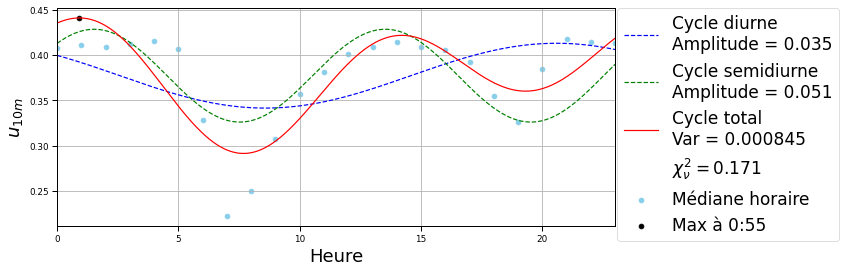

Fitted parameters:
peak_value = 0.920920920920921
C1 = -0.6755254137328716
C2 = 0.7711458700585773
Number of season averaged: 34248
WS été CA-ON
WS_été_CA-ON
  station_id saison    year
0         24    été  2016.0
1         24    été  2018.0
2         24    été  2019.0
3
N hour used:  5312
14.113113113113114 14.0
1.013013013013013 1.0
Chi2 = 0.24866533623338527, degrees of freedom = 20, p-value = 0.9999999999999998, reduced chi2 = 0.012433266811669263
WS_été_CA-ON
True
saving


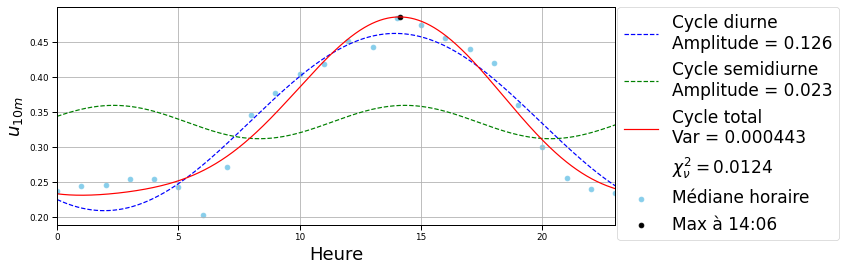

Fitted parameters:
peak_value = 14.113113113113114
C1 = 1.0639184109122675
C2 = 0.3500274467137779
Number of season averaged: 5312
WS été US-AZ
WS_été_US-AZ
  station_id saison    year
0         30    été  2016.0
1         30    été  2017.0
2         30    été  2018.0
3
N hour used:  5417
16.024024024024026 16.0
8.38038038038038 8.0
Chi2 = 0.17420831356097818, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.00871041567804891
WS_été_US-AZ
True
saving


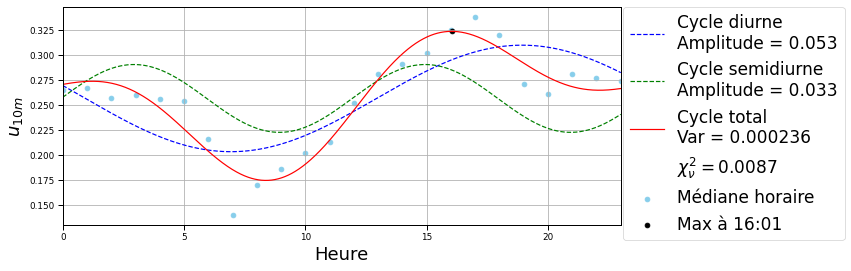

Fitted parameters:
peak_value = 16.024024024024026
C1 = -0.24445108710372332
C2 = 0.03475729111707591
Number of season averaged: 5417
WS été US-DE
WS_été_US-DE
  station_id saison    year
0         31    été  2015.0
1         31    été  2016.0
2         31    été  2017.0
3
N hour used:  6175
13.62962962962963 13.0
1.3813813813813816 1.0
Chi2 = 0.7015047766828468, degrees of freedom = 20, p-value = 0.9999999999943513, reduced chi2 = 0.03507523883414234
WS_été_US-DE
True
saving


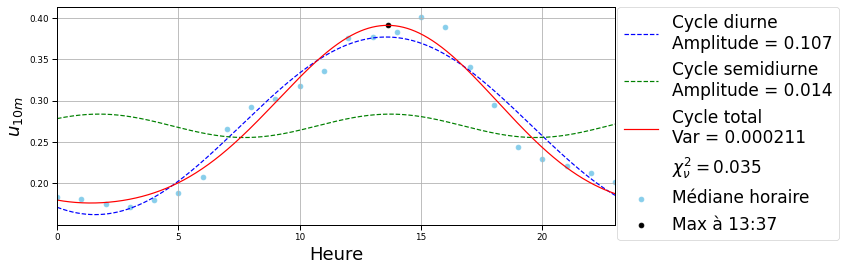

Fitted parameters:
peak_value = 13.62962962962963
C1 = 1.1611679762517184
C2 = 0.6655710887517295
Number of season averaged: 6175
WS été US-FL
WS_été_US-FL
  station_id saison    year
0         35    été  2016.0
1         35    été  2018.0
2         35    été  2019.0
3
N hour used:  6385
14.021021021021022 14.0
1.0590590590590592 1.0
Chi2 = 0.7243154536041214, degrees of freedom = 20, p-value = 0.999999999992301, reduced chi2 = 0.03621577268020607
WS_été_US-FL
True
saving


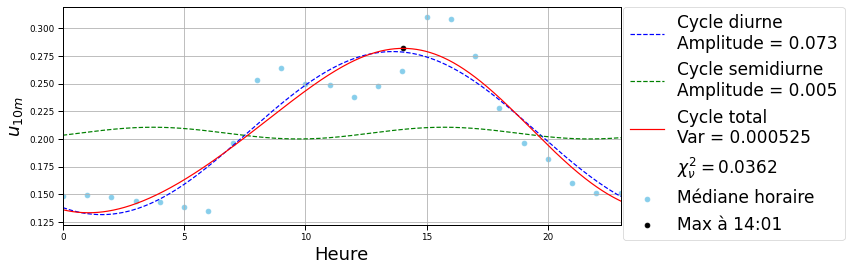

Fitted parameters:
peak_value = 14.021021021021022
C1 = 1.1518326897042335
C2 = -0.37466185196224866
Number of season averaged: 6385
WS été toutes
WS_été_toutes
   station_id saison    year
0           3    été  2015.0
1           3    été  2016.0
2           3    été  2017.0
3           4    été  2015.0
4           4    été  2016.0
..        ...    ...     ...
75         33    été  2017.0
76         33    été  2018.0
77         35    été  2016.0
78         35    été  2018.0
79         35    été  2019.0

[80 rows x 3 columns]
80
N hour used:  160336
14.872872872872874 14.0
6.676676676676677 6.0
Chi2 = 0.07510995365982416, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.003755497682991208
WS_été_toutes
True
saving


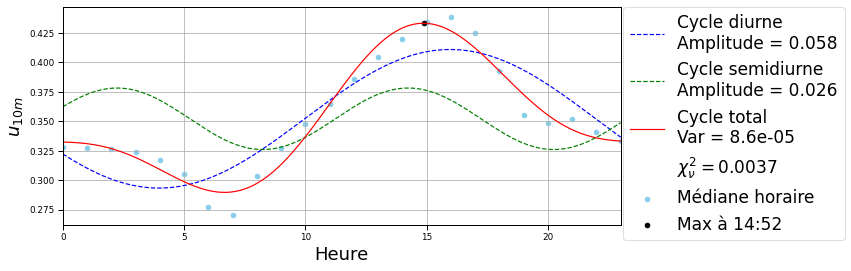

Fitted parameters:
peak_value = 14.872872872872874
C1 = 0.5319741220530263
C2 = 0.3987064712496717
Number of season averaged: 160336
WS automne US-WA
WS_automne_US-WA
  station_id   saison    year
0          5  automne  2017.0
1         28  automne  2020.0
2
N hour used:  3305
7.344344344344345 7.0
15.310310310310312 15.0
Chi2 = 1.0182709949523296, degrees of freedom = 20, p-value = 0.9999999997967861, reduced chi2 = 0.050913549747616485
WS_automne_US-WA
True
saving


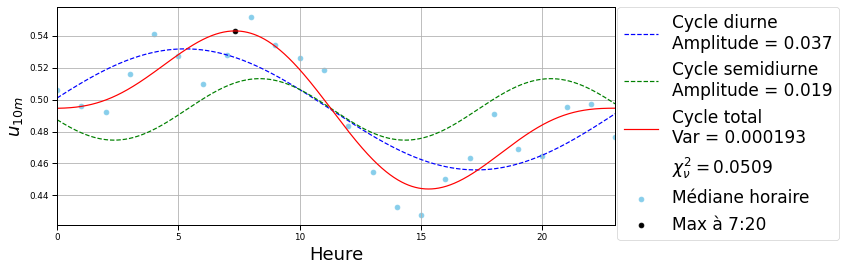

Fitted parameters:
peak_value = 7.344344344344345
C1 = 0.19008838812385512
C2 = 0.34261635951224284
Number of season averaged: 3305
WS automne US-CA
WS_automne_US-CA
   station_id   saison    year
0           4  automne  2015.0
1           4  automne  2016.0
2           4  automne  2017.0
3           4  automne  2019.0
4          14  automne  2016.0
5          14  automne  2017.0
6          14  automne  2019.0
7          15  automne  2018.0
8          17  automne  2015.0
9          17  automne  2016.0
10         17  automne  2017.0
11         17  automne  2018.0
12         17  automne  2019.0
13         17  automne  2020.0
14         22  automne  2018.0
15         23  automne  2018.0
16         23  automne  2019.0
17         23  automne  2020.0
18         26  automne  2017.0
19         26  automne  2018.0
20         26  automne  2019.0
21         26  automne  2020.0
22         29  automne  2020.0
23
N hour used:  41861
23.0 23.0
7.183183183183184 7.0
Chi2 = 0.13304268893750215, degrees

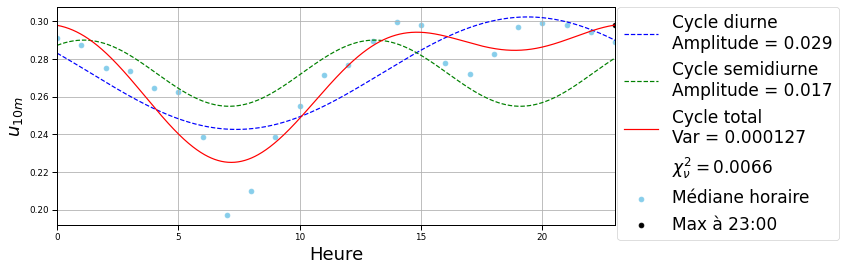

Fitted parameters:
peak_value = 23.0
C1 = -0.36365285476444154
C2 = 1.0009339097157472
Number of season averaged: 41861
WS automne US-MN
WS_automne_US-MN
   station_id   saison    year
0           9  automne  2017.0
1           9  automne  2018.0
2           9  automne  2019.0
3           9  automne  2020.0
4          20  automne  2016.0
5          20  automne  2017.0
6          20  automne  2018.0
7          20  automne  2019.0
8          20  automne  2020.0
9          25  automne  2017.0
10         25  automne  2018.0
11         25  automne  2019.0
12         25  automne  2020.0
13
N hour used:  24026
12.70870870870871 12.0
4.8808808808808815 4.0
Chi2 = 0.09632497659136977, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.004816248829568488
WS_automne_US-MN
True
saving


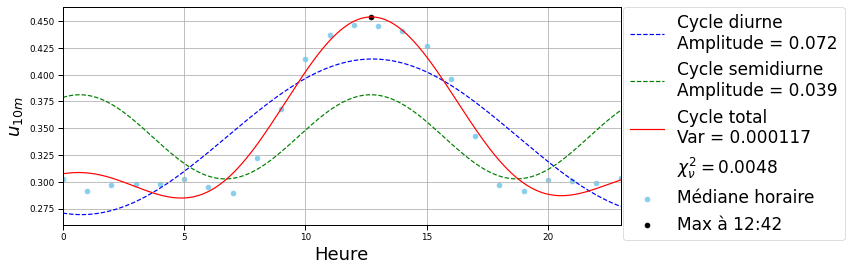

Fitted parameters:
peak_value = 12.70870870870871
C1 = 1.3706429683353643
C2 = 1.2046506503214587
Number of season averaged: 24026
WS automne US-IL
WS_automne_US-IL
  station_id   saison    year
0         10  automne  2016.0
1         10  automne  2017.0
2         27  automne  2016.0
3         27  automne  2017.0
4         27  automne  2018.0
5
N hour used:  8490
12.041041041041042 12.0
20.49049049049049 20.0
Chi2 = 0.10980494870053897, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.005490247435026949
WS_automne_US-IL
True
saving


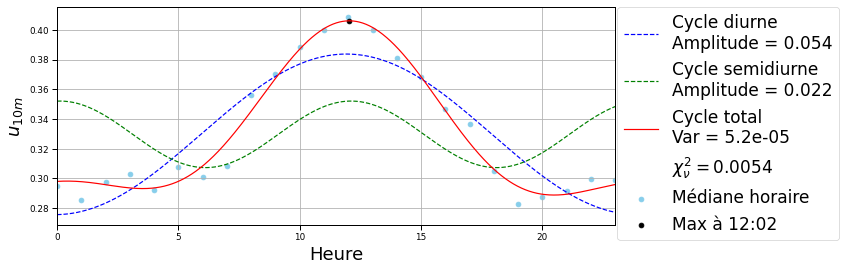

Fitted parameters:
peak_value = 12.041041041041042
C1 = -1.5505364728456954
C2 = 1.5102231548699236
Number of season averaged: 8490
WS automne US-ID
WS_automne_US-ID
  station_id   saison    year
0         12  automne  2015.0
1         12  automne  2016.0
2         12  automne  2017.0
3         19  automne  2016.0
4         21  automne  2015.0
5         21  automne  2016.0
6         21  automne  2017.0
7         33  automne  2015.0
8         33  automne  2016.0
9         33  automne  2017.0
10
N hour used:  20070
1.0360360360360361 1.0
8.495495495495495 8.0
Chi2 = 0.7783214797079354, degrees of freedom = 20, p-value = 0.999999999984579, reduced chi2 = 0.038916073985396774
WS_automne_US-ID
True
saving


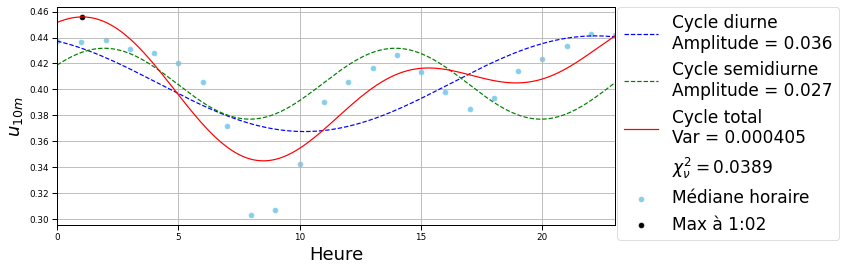

Fitted parameters:
peak_value = 1.0360360360360361
C1 = -1.0985647097215956
C2 = 0.5545945078146256
Number of season averaged: 20070
WS automne CA-ON
WS_automne_CA-ON
  station_id   saison    year
0         24  automne  2020.0
1
N hour used:  1661
13.606606606606608 13.0
5.548548548548549 5.0
Chi2 = 0.07301964606230268, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0036509823031151342
WS_automne_CA-ON
True
saving


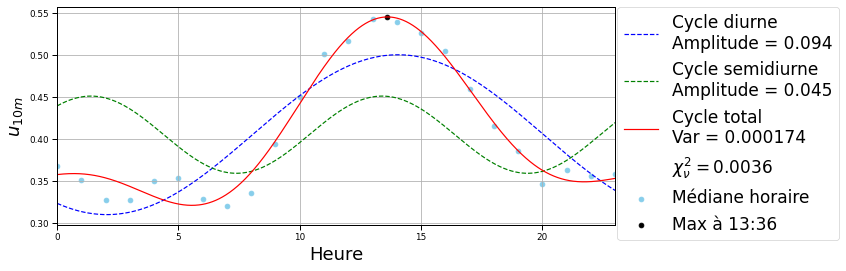

Fitted parameters:
peak_value = 13.606606606606608
C1 = 1.0336907679941736
C2 = 0.8412411566371789
Number of season averaged: 1661
WS automne US-AZ
WS_automne_US-AZ
  station_id   saison    year
0         30  automne  2015.0
1         30  automne  2016.0
2
N hour used:  4121
15.448448448448449 15.0
8.587587587587588 8.0
Chi2 = 0.656590110053272, degrees of freedom = 20, p-value = 0.9999999999970254, reduced chi2 = 0.0328295055026636
WS_automne_US-AZ
True
saving


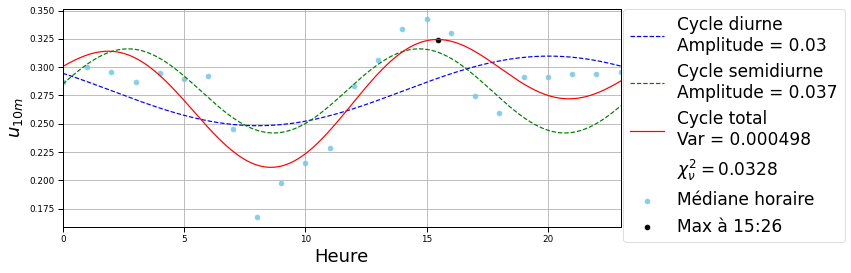

Fitted parameters:
peak_value = 15.448448448448449
C1 = -0.5319850523224819
C2 = 0.1612587117578465
Number of season averaged: 4121
WS automne US-DE
WS_automne_US-DE
  station_id   saison    year
0         31  automne  2015.0
1         31  automne  2016.0
2         31  automne  2017.0
3
N hour used:  6257
11.810810810810812 11.0
3.2692692692692695 3.0
Chi2 = 0.09098034663751622, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.004549017331875811
WS_automne_US-DE
True
saving


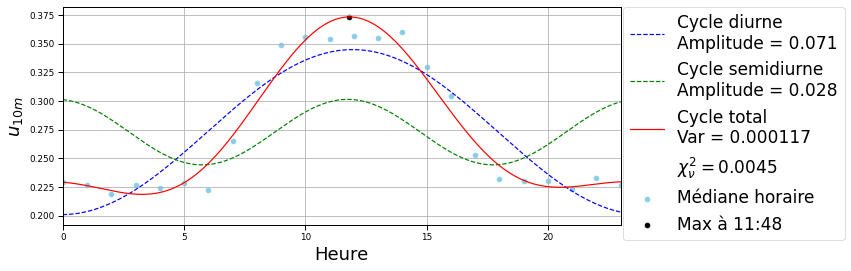

Fitted parameters:
peak_value = 11.810810810810812
C1 = -1.5576932244412345
C2 = -1.4342935878935454
Number of season averaged: 6257
WS automne US-FL
WS_automne_US-FL
  station_id   saison    year
0         35  automne  2017.0
1         35  automne  2018.0
2         35  automne  2019.0
3
N hour used:  5813
12.386386386386388 12.0
2.831831831831832 2.0
Chi2 = 0.22560540215433578, degrees of freedom = 20, p-value = 0.9999999999999999, reduced chi2 = 0.011280270107716789
WS_automne_US-FL
True
saving


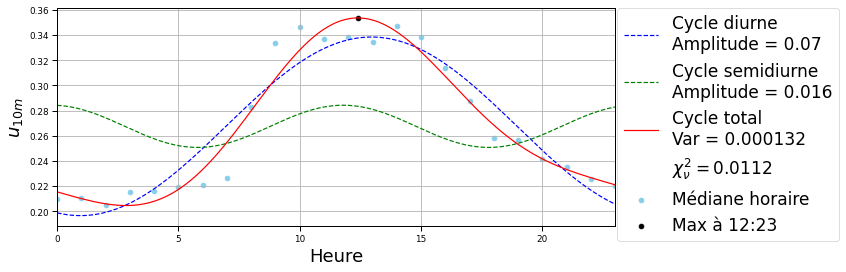

Fitted parameters:
peak_value = 12.386386386386388
C1 = 1.320229360451326
C2 = -1.460568117765748
Number of season averaged: 5813
WS automne toutes
WS_automne_toutes
   station_id   saison    year
0           4  automne  2015.0
1           4  automne  2016.0
2           4  automne  2017.0
3           4  automne  2019.0
4           5  automne  2017.0
..        ...      ...     ...
57         33  automne  2016.0
58         33  automne  2017.0
59         35  automne  2017.0
60         35  automne  2018.0
61         35  automne  2019.0

[62 rows x 3 columns]
62
N hour used:  115604
13.3993993993994 13.0
6.101101101101102 6.0
Chi2 = 0.19078352922707648, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009539176461353823
WS_automne_toutes
True
saving


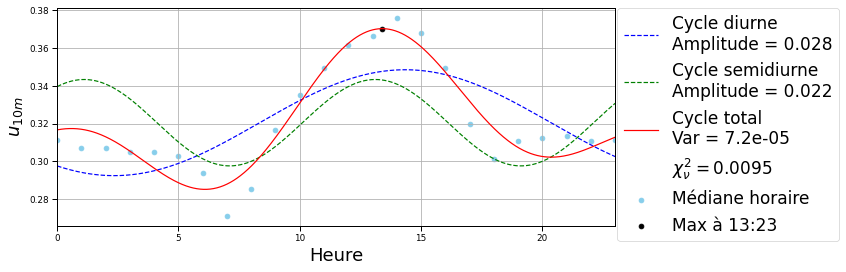

Fitted parameters:
peak_value = 13.3993993993994
C1 = 0.9557808432680917
C2 = 0.9879121720838825
Number of season averaged: 115604
WS toutes US-WA
WS_toutes_US-WA
  station_id     saison    year
0          2  printemps  2018.0
1          2  printemps  2020.0
2          5    automne  2017.0
3          5  printemps  2018.0
4         28    automne  2020.0
5
N hour used:  8566
8.403403403403404 8.0
18.165165165165167 18.0
Chi2 = 0.1116798233782123, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0055839911689106155
WS_toutes_US-WA
True
saving


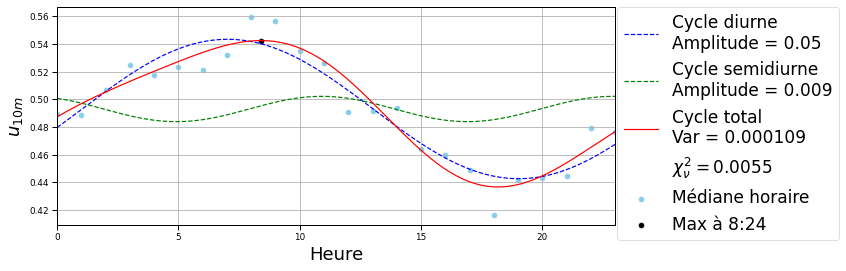

Fitted parameters:
peak_value = 8.403403403403404
C1 = -0.26868621034793316
C2 = -1.002812057492544
Number of season averaged: 8566
WS toutes US-CA
WS_toutes_US-CA
   station_id     saison    year
0           3  printemps  2015.0
1           3        été  2015.0
2           3        été  2016.0
3           3        été  2017.0
4           4  printemps  2015.0
..        ...        ...     ...
93         29        été  2017.0
94         29  printemps  2019.0
95         29        été  2019.0
96         29  printemps  2020.0
97         29    automne  2020.0

[98 rows x 3 columns]
98
N hour used:  179187
16.093093093093096 16.0
7.643643643643644 7.0
Chi2 = 0.06818612888050242, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.003409306444025121
WS_toutes_US-CA
True
saving


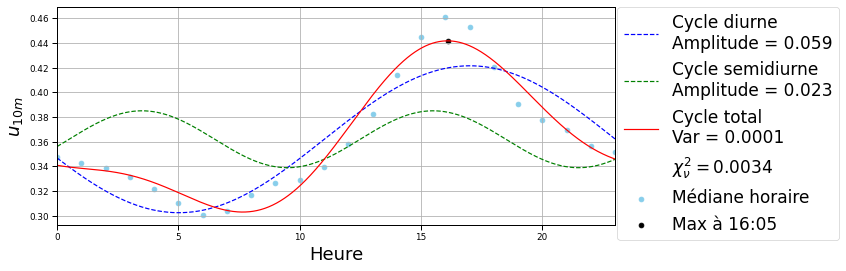

Fitted parameters:
peak_value = 16.093093093093096
C1 = 0.2586520081342275
C2 = -0.25872427850314783
Number of season averaged: 179187
WS toutes US-MN
WS_toutes_US-MN
   station_id     saison    year
0           9  printemps  2017.0
1           9        été  2017.0
2           9    automne  2017.0
3           9      hiver  2017.0
4           9      hiver  2018.0
5           9        été  2018.0
6           9    automne  2018.0
7           9      hiver  2019.0
8           9  printemps  2019.0
9           9        été  2019.0
10          9    automne  2019.0
11          9      hiver  2020.0
12          9    automne  2020.0
13         20  printemps  2016.0
14         20        été  2016.0
15         20    automne  2016.0
16         20      hiver  2016.0
17         20      hiver  2017.0
18         20  printemps  2017.0
19         20        été  2017.0
20         20    automne  2017.0
21         20      hiver  2018.0
22         20  printemps  2018.0
23         20        été  2018.0
24      

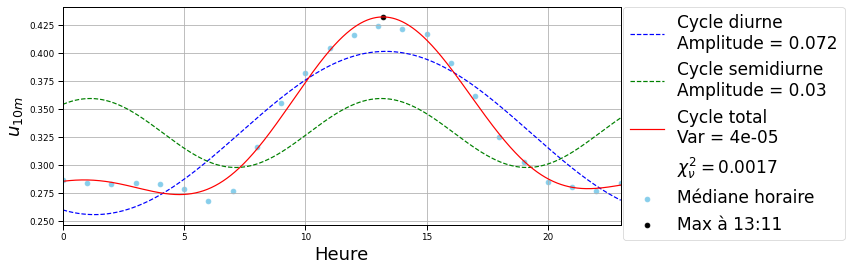

Fitted parameters:
peak_value = 13.192192192192193
C1 = 1.2297281019313493
C2 = 0.9784808863357966
Number of season averaged: 83640
WS toutes US-IL
WS_toutes_US-IL
   station_id     saison    year
0          10  printemps  2016.0
1          10        été  2016.0
2          10    automne  2016.0
3          10  printemps  2017.0
4          10        été  2017.0
5          10    automne  2017.0
6          10      hiver  2017.0
7          10      hiver  2018.0
8          10  printemps  2018.0
9          27  printemps  2016.0
10         27        été  2016.0
11         27    automne  2016.0
12         27        été  2017.0
13         27    automne  2017.0
14         27  printemps  2018.0
15         27        été  2018.0
16         27    automne  2018.0
17
N hour used:  27889
12.93893893893894 12.0
2.601601601601602 2.0
Chi2 = 0.11007705842487224, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.005503852921243612
WS_toutes_US-IL
True
saving


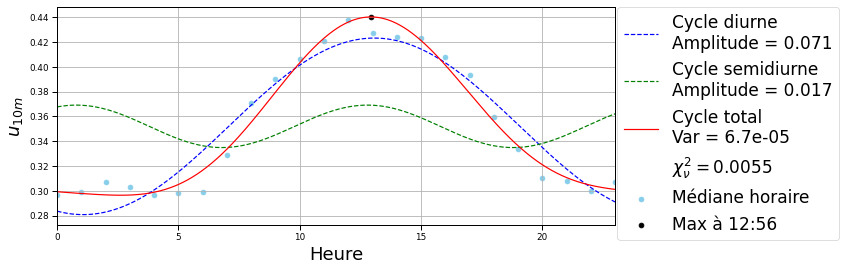

Fitted parameters:
peak_value = 12.93893893893894
C1 = 1.2901863718160504
C2 = 1.1556988761055018
Number of season averaged: 27889
WS toutes US-ID
WS_toutes_US-ID
   station_id     saison    year
0          12        été  2015.0
1          12    automne  2015.0
2          12  printemps  2016.0
3          12        été  2016.0
4          12    automne  2016.0
5          12  printemps  2017.0
6          12        été  2017.0
7          12    automne  2017.0
8          12      hiver  2017.0
9          12      hiver  2018.0
10         12  printemps  2018.0
11         12        été  2018.0
12         19        été  2015.0
13         19  printemps  2016.0
14         19        été  2016.0
15         19    automne  2016.0
16         19  printemps  2017.0
17         19        été  2017.0
18         19  printemps  2018.0
19         19        été  2018.0
20         21  printemps  2015.0
21         21        été  2015.0
22         21    automne  2015.0
23         21      hiver  2015.0
24         2

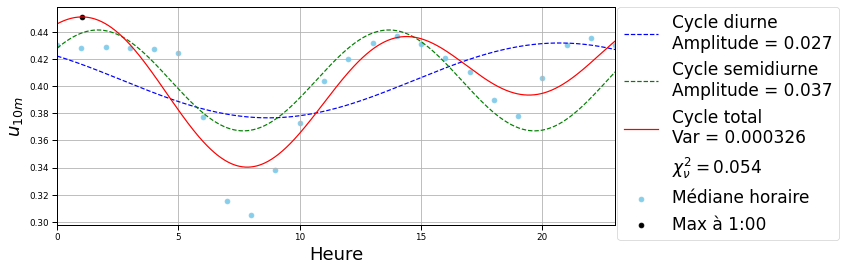

Fitted parameters:
peak_value = 1.013013013013013
C1 = -0.7080858256931228
C2 = 0.6930504205828887
Number of season averaged: 89070
WS toutes CA-ON
WS_toutes_CA-ON
  station_id     saison    year
0         24  printemps  2016.0
1         24        été  2016.0
2         24        été  2018.0
3         24  printemps  2019.0
4         24        été  2019.0
5         24  printemps  2020.0
6         24    automne  2020.0
7
N hour used:  12072
13.836836836836838 13.0
1.9569569569569571 1.0
Chi2 = 0.13372645525797178, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.006686322762898589
WS_toutes_CA-ON
True
saving


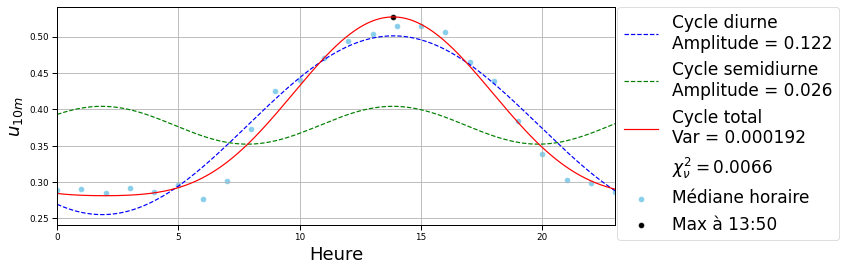

Fitted parameters:
peak_value = 13.836836836836838
C1 = 1.0848688631754246
C2 = 0.6085570256063508
Number of season averaged: 12072
WS toutes US-AZ
WS_toutes_US-AZ
   station_id     saison    year
0          30  printemps  2015.0
1          30    automne  2015.0
2          30  printemps  2016.0
3          30        été  2016.0
4          30    automne  2016.0
5          30      hiver  2016.0
6          30      hiver  2017.0
7          30  printemps  2017.0
8          30        été  2017.0
9          30  printemps  2018.0
10         30        été  2018.0
11
N hour used:  19679
15.494494494494495 15.0
8.311311311311313 8.0
Chi2 = 0.6165640496128192, degrees of freedom = 20, p-value = 0.9999999999983851, reduced chi2 = 0.03082820248064096
WS_toutes_US-AZ
True
saving


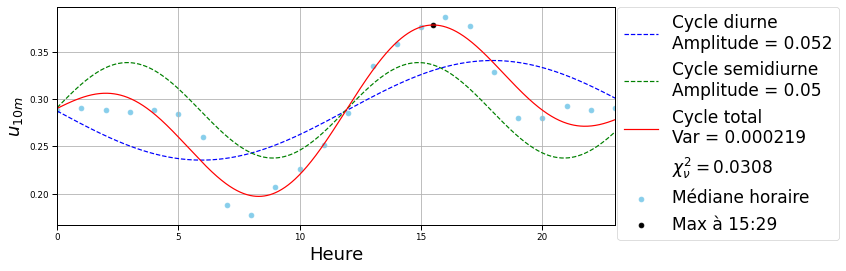

Fitted parameters:
peak_value = 15.494494494494495
C1 = 0.014625372449857376
C2 = 0.05588344121149924
Number of season averaged: 19679
WS toutes US-DE
WS_toutes_US-DE
  station_id     saison    year
0         31        été  2015.0
1         31    automne  2015.0
2         31        été  2016.0
3         31    automne  2016.0
4         31      hiver  2016.0
5         31      hiver  2017.0
6         31  printemps  2017.0
7         31        été  2017.0
8         31    automne  2017.0
9
N hour used:  16444
12.593593593593594 12.0
2.9239239239239243 2.0
Chi2 = 0.182480115412281, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009124005770614051
WS_toutes_US-DE
True
saving


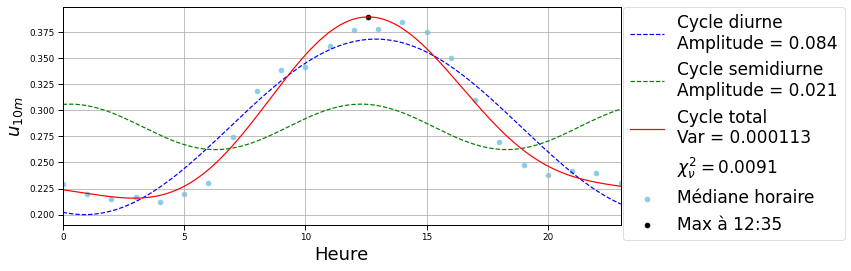

Fitted parameters:
peak_value = 12.593593593593594
C1 = 1.3362167412846573
C2 = 1.4167324241851482
Number of season averaged: 16444
WS toutes US-FL
WS_toutes_US-FL
  station_id     saison    year
0         35        été  2016.0
1         35  printemps  2017.0
2         35    automne  2017.0
3         35        été  2018.0
4         35    automne  2018.0
5         35      hiver  2018.0
6         35      hiver  2019.0
7         35  printemps  2019.0
8         35        été  2019.0
9         35    automne  2019.0
10
N hour used:  18511
13.031031031031032 13.0
2.141141141141141 2.0
Chi2 = 0.18475396486926066, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009237698243463034
WS_toutes_US-FL
True
saving


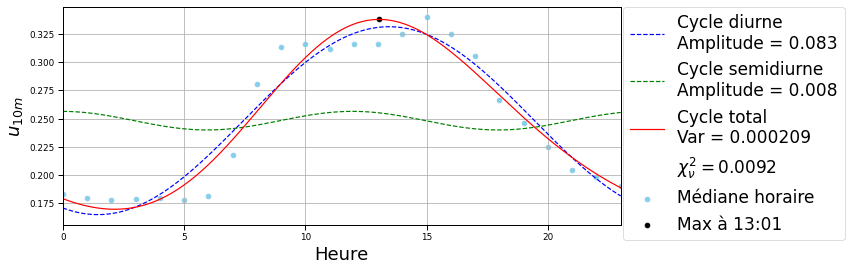

Fitted parameters:
peak_value = 13.031031031031032
C1 = 1.1916709035255733
C2 = -1.5446022651584288
Number of season averaged: 18511
WS toutes toutes
WS_toutes_toutes
    station_id     saison    year
0            2  printemps  2018.0
1            2  printemps  2020.0
2            3  printemps  2015.0
3            3        été  2015.0
4            3        été  2016.0
..         ...        ...     ...
247         35      hiver  2018.0
248         35      hiver  2019.0
249         35  printemps  2019.0
250         35        été  2019.0
251         35    automne  2019.0

[252 rows x 3 columns]
252
N hour used:  455058
14.38938938938939 14.0
6.400400400400401 6.0
Chi2 = 0.06004306944030262, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.003002153472015131
WS_toutes_toutes
True
saving


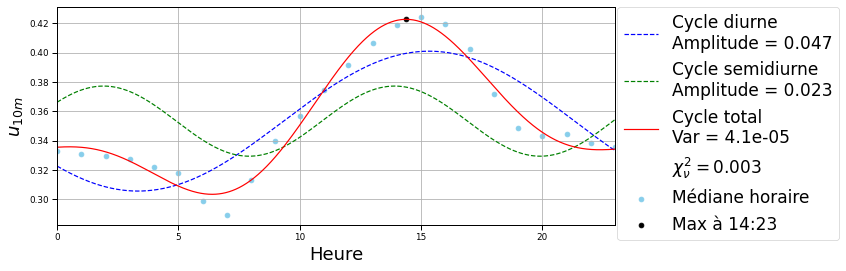

Fitted parameters:
peak_value = 14.38938938938939
C1 = 0.6988323287448557
C2 = 0.5694513822423798
Number of season averaged: 455058
ustar hiver US-WA
ustar_hiver_US-WA
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
ustar hiver US-CA
ustar_hiver_US-CA
  station_id saison    year
0          4  hiver  2015.0
1          4  hiver  2016.0
2          4  hiver  2017.0
3          4  hiver  2018.0
4          4  hiver  2019.0
5          4  hiver  2020.0
6         17  hiver  2019.0
7         17  hiver  2020.0
8
N hour used:  6776
11.994994994994995 11.0
19.40840840840841 19.0
Chi2 = 0.3035226270316884, degrees of freedom = 20, p-value = 0.9999999999999984, reduced chi2 = 0.01517613135158442
ustar_hiver_US-CA
True
saving


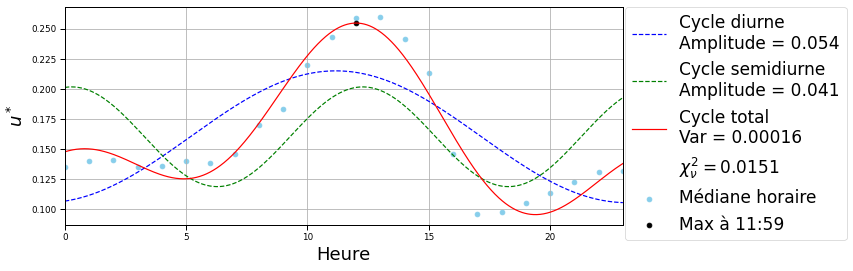

Fitted parameters:
peak_value = 11.994994994994995
C1 = -1.3538562123776392
C2 = 1.42374462922649
Number of season averaged: 6776
ustar hiver US-MN
ustar_hiver_US-MN
   station_id saison    year
0           9  hiver  2017.0
1           9  hiver  2018.0
2           9  hiver  2019.0
3           9  hiver  2020.0
4          20  hiver  2016.0
5          20  hiver  2017.0
6          20  hiver  2018.0
7          20  hiver  2019.0
8          20  hiver  2020.0
9          25  hiver  2017.0
10         25  hiver  2018.0
11         25  hiver  2019.0
12         25  hiver  2020.0
13
N hour used:  18071
12.294294294294295 12.0
4.48948948948949 4.0
Chi2 = 0.07916789976395838, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.003958394988197919
ustar_hiver_US-MN
True
saving


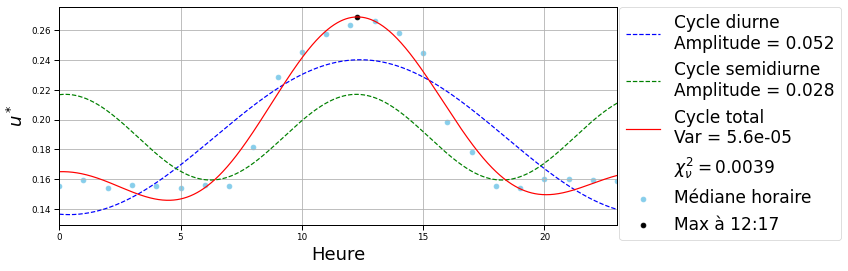

Fitted parameters:
peak_value = 12.294294294294295
C1 = 1.4661828558929038
C2 = 1.4425756622018029
Number of season averaged: 18071
ustar hiver US-IL
ustar_hiver_US-IL
  station_id saison    year
0         10  hiver  2017.0
1         10  hiver  2018.0
2
N hour used:  1785
12.317317317317318 12.0
20.881881881881885 20.0
Chi2 = 0.11084915618162207, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.005542457809081103
ustar_hiver_US-IL
True
saving


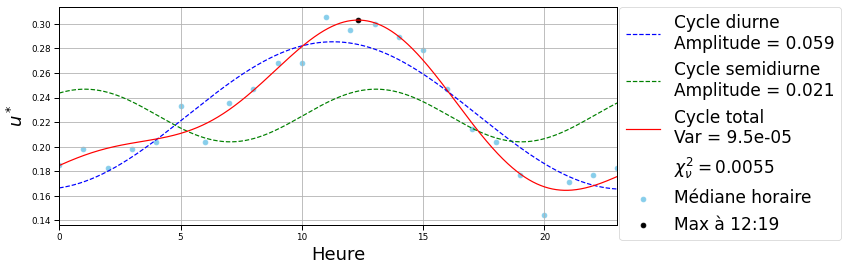

Fitted parameters:
peak_value = 12.317317317317318
C1 = -1.3820819120833243
C2 = 1.0197281433073795
Number of season averaged: 1785
ustar hiver US-ID
ustar_hiver_US-ID
  station_id saison    year
0         12  hiver  2017.0
1         12  hiver  2018.0
2         21  hiver  2015.0
3         21  hiver  2016.0
4         21  hiver  2017.0
5         21  hiver  2018.0
6         33  hiver  2016.0
7         33  hiver  2017.0
8         33  hiver  2018.0
9
N hour used:  11236
12.317317317317318 12.0
19.73073073073073 19.0
Chi2 = 0.2489530763106034, degrees of freedom = 20, p-value = 0.9999999999999998, reduced chi2 = 0.01244765381553017
ustar_hiver_US-ID
True
saving


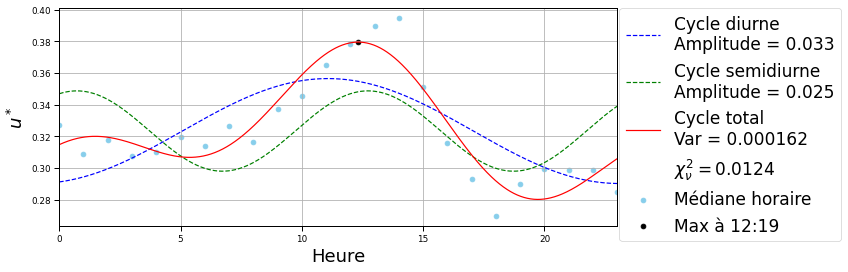

Fitted parameters:
peak_value = 12.317317317317318
C1 = -1.3275163031690584
C2 = 1.190399287740329
Number of season averaged: 11236
ustar hiver CA-ON
ustar_hiver_CA-ON
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
ustar hiver US-AZ
ustar_hiver_US-AZ
  station_id saison    year
0         30  hiver  2016.0
1         30  hiver  2017.0
2
N hour used:  2142
13.376376376376378 13.0
20.766766766766768 20.0
Chi2 = 1.3509086780624762, degrees of freedom = 20, p-value = 0.9999999970472899, reduced chi2 = 0.06754543390312381
ustar_hiver_US-AZ
True
saving


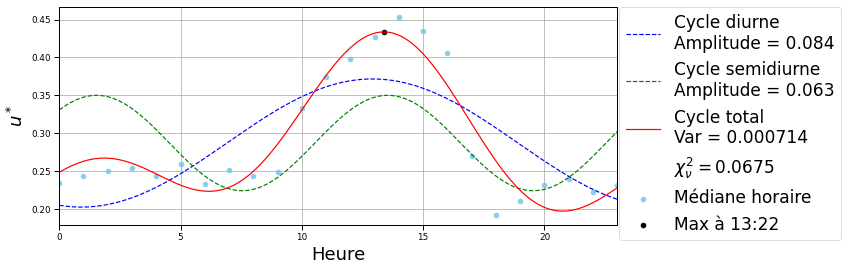

Fitted parameters:
peak_value = 13.376376376376378
C1 = 1.3326615868858054
C2 = 0.7647689282206209
Number of season averaged: 2142
ustar hiver US-DE
ustar_hiver_US-DE
  station_id saison    year
0         31  hiver  2016.0
1         31  hiver  2017.0
2
N hour used:  1925
11.557557557557558 11.0
19.10910910910911 19.0
Chi2 = 0.6282988484288861, degrees of freedom = 20, p-value = 0.9999999999980603, reduced chi2 = 0.031414942421444304
ustar_hiver_US-DE
True
saving


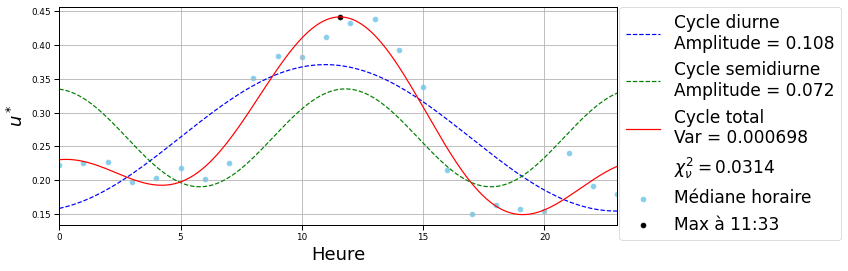

Fitted parameters:
peak_value = 11.557557557557558
C1 = -1.299658627557917
C2 = -1.462989648602101
Number of season averaged: 1925
ustar hiver US-FL
ustar_hiver_US-FL
  station_id saison    year
0         35  hiver  2018.0
1         35  hiver  2019.0
2
N hour used:  2052
12.225225225225227 12.0
20.55955955955956 20.0
Chi2 = 0.19288266891250339, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.00964413344562517
ustar_hiver_US-FL
True
saving


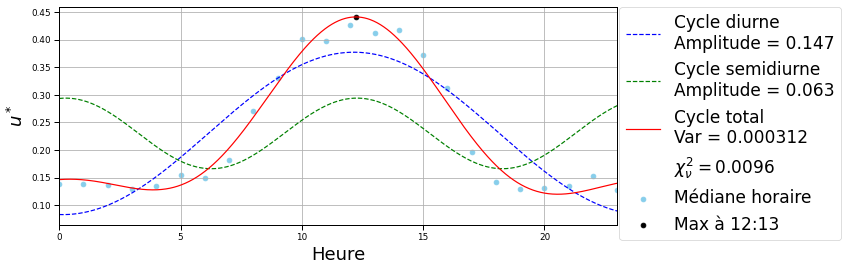

Fitted parameters:
peak_value = 12.225225225225227
C1 = -1.6087547308572314
C2 = 1.4292847129747108
Number of season averaged: 2052
ustar hiver toutes
ustar_hiver_toutes
   station_id saison    year
0           4  hiver  2015.0
1           4  hiver  2016.0
2           4  hiver  2017.0
3           4  hiver  2018.0
4           4  hiver  2019.0
5           4  hiver  2020.0
6           9  hiver  2017.0
7           9  hiver  2018.0
8           9  hiver  2019.0
9           9  hiver  2020.0
10         10  hiver  2017.0
11         10  hiver  2018.0
12         12  hiver  2017.0
13         12  hiver  2018.0
14         17  hiver  2019.0
15         17  hiver  2020.0
16         20  hiver  2016.0
17         20  hiver  2017.0
18         20  hiver  2018.0
19         20  hiver  2019.0
20         20  hiver  2020.0
21         21  hiver  2015.0
22         21  hiver  2016.0
23         21  hiver  2017.0
24         21  hiver  2018.0
25         25  hiver  2017.0
26         25  hiver  2018.0
27         25  hiv

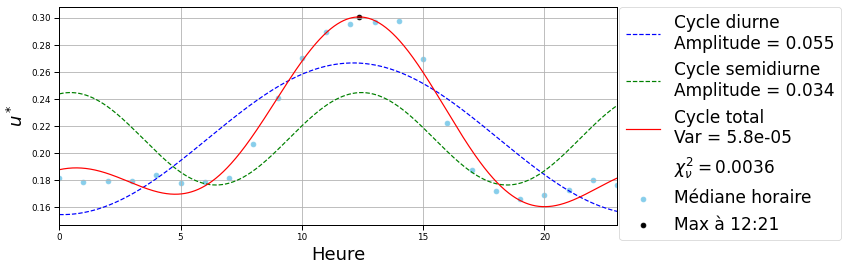

Fitted parameters:
peak_value = 12.363363363363364
C1 = 1.5400350504701223
C2 = 1.3292894163730133
Number of season averaged: 43987
ustar printemps US-WA
ustar_printemps_US-WA
  station_id     saison    year
0          2  printemps  2018.0
1          2  printemps  2020.0
2          5  printemps  2018.0
3
N hour used:  5261
11.557557557557558 11.0
20.605605605605607 20.0
Chi2 = 0.10024932233026208, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.005012466116513104
ustar_printemps_US-WA
True
saving


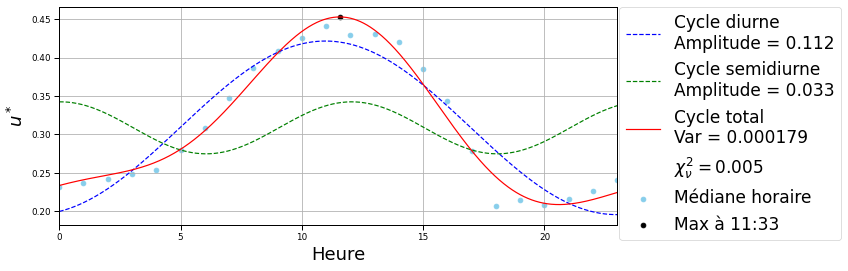

Fitted parameters:
peak_value = 11.557557557557558
C1 = -1.3013132730513393
C2 = 1.5417729617049079
Number of season averaged: 5261
ustar printemps US-CA
ustar_printemps_US-CA
   station_id     saison    year
0           3  printemps  2015.0
1           4  printemps  2015.0
2           4  printemps  2016.0
3           4  printemps  2017.0
4           4  printemps  2018.0
5           4  printemps  2019.0
6           4  printemps  2020.0
7          14  printemps  2017.0
8          14  printemps  2018.0
9          14  printemps  2019.0
10         14  printemps  2020.0
11         15  printemps  2019.0
12         17  printemps  2015.0
13         17  printemps  2016.0
14         17  printemps  2017.0
15         17  printemps  2018.0
16         17  printemps  2019.0
17         17  printemps  2020.0
18         22  printemps  2019.0
19         22  printemps  2020.0
20         23  printemps  2015.0
21         23  printemps  2017.0
22         23  printemps  2018.0
23         23  printemps  2019.0

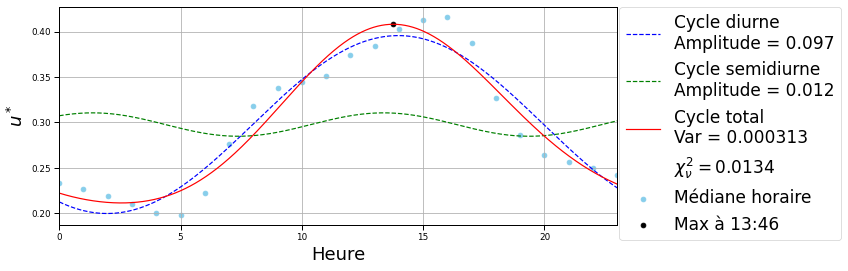

Fitted parameters:
peak_value = 13.767767767767769
C1 = 1.054247619448653
C2 = 0.8513948998817403
Number of season averaged: 57454
ustar printemps US-MN
ustar_printemps_US-MN
   station_id     saison    year
0           9  printemps  2017.0
1           9  printemps  2019.0
2          20  printemps  2016.0
3          20  printemps  2017.0
4          20  printemps  2018.0
5          20  printemps  2019.0
6          20  printemps  2020.0
7          25  printemps  2017.0
8          25  printemps  2018.0
9          25  printemps  2019.0
10         25  printemps  2020.0
11
N hour used:  20566
12.570570570570572 12.0
22.654654654654657 22.0
Chi2 = 0.15621633002458352, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.007810816501229176
ustar_printemps_US-MN
True
saving


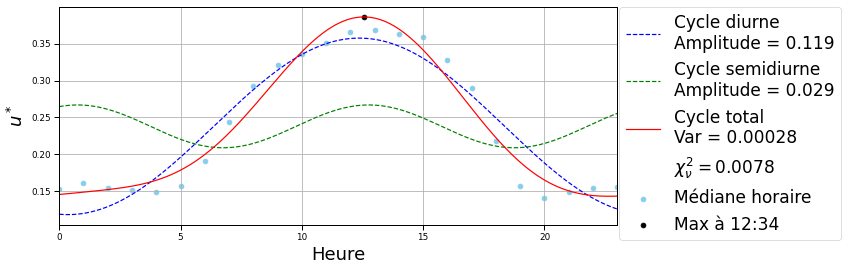

Fitted parameters:
peak_value = 12.570570570570572
C1 = 1.4752988145249335
C2 = 1.1728426322879413
Number of season averaged: 20566
ustar printemps US-IL
ustar_printemps_US-IL
  station_id     saison    year
0         10  printemps  2016.0
1         10  printemps  2017.0
2         10  printemps  2018.0
3         27  printemps  2016.0
4         27  printemps  2018.0
5
N hour used:  8888
12.386386386386388 12.0
0.23023023023023026 0.0
Chi2 = 0.4364700095669173, degrees of freedom = 20, p-value = 0.9999999999999446, reduced chi2 = 0.021823500478345866
ustar_printemps_US-IL
True
saving


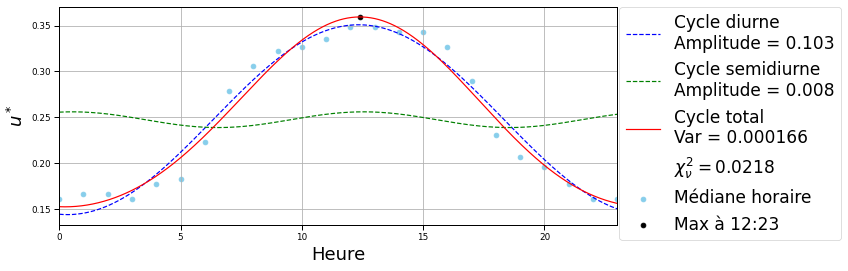

Fitted parameters:
peak_value = 12.386386386386388
C1 = 1.4816940599603026
C2 = 1.2856282963423395
Number of season averaged: 8888
ustar printemps US-ID
ustar_printemps_US-ID
   station_id     saison    year
0          12  printemps  2016.0
1          12  printemps  2017.0
2          12  printemps  2018.0
3          19  printemps  2016.0
4          19  printemps  2017.0
5          19  printemps  2018.0
6          21  printemps  2015.0
7          21  printemps  2017.0
8          21  printemps  2018.0
9          33  printemps  2016.0
10         33  printemps  2017.0
11         33  printemps  2018.0
12
N hour used:  23516
13.284284284284285 13.0
22.516516516516518 22.0
Chi2 = 0.09816558624261662, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.004908279312130831
ustar_printemps_US-ID
True
saving


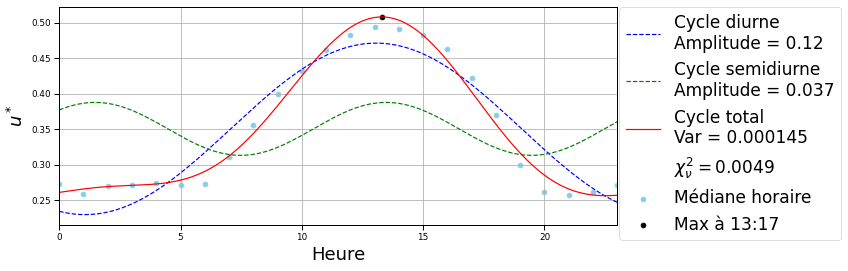

Fitted parameters:
peak_value = 13.284284284284285
C1 = 1.2921842718660292
C2 = 0.7975417607805547
Number of season averaged: 23516
ustar printemps CA-ON
ustar_printemps_CA-ON
  station_id     saison    year
0         24  printemps  2016.0
1         24  printemps  2019.0
2         24  printemps  2020.0
3
N hour used:  5099
12.777777777777779 12.0
23.0 23.0
Chi2 = 0.16272319684425185, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.008136159842212592
ustar_printemps_CA-ON
True
saving


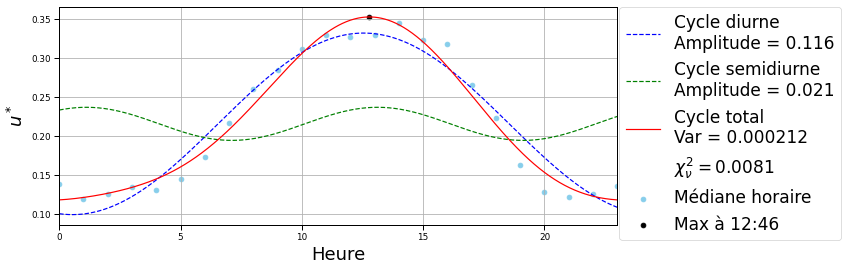

Fitted parameters:
peak_value = 12.777777777777779
C1 = 1.4276596952721523
C2 = 0.9852889358172034
Number of season averaged: 5099
ustar printemps US-AZ
ustar_printemps_US-AZ
  station_id     saison    year
0         30  printemps  2015.0
1         30  printemps  2016.0
2         30  printemps  2017.0
3         30  printemps  2018.0
4
N hour used:  7999
14.182182182182183 14.0
22.53953953953954 22.0
Chi2 = 0.48454788614093464, degrees of freedom = 20, p-value = 0.9999999999998459, reduced chi2 = 0.02422739430704673
ustar_printemps_US-AZ
True
saving


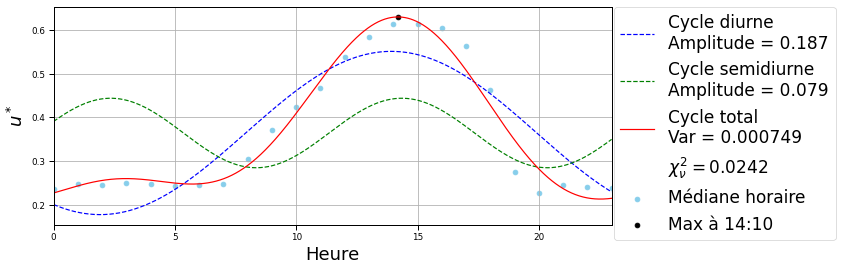

Fitted parameters:
peak_value = 14.182182182182183
C1 = 1.0686309162519492
C2 = 0.33902881548702224
Number of season averaged: 7999
ustar printemps US-DE
ustar_printemps_US-DE
  station_id     saison    year
0         31  printemps  2017.0
1
N hour used:  2087
12.593593593593594 12.0
0.23023023023023026 0.0
Chi2 = 0.5243883668909303, degrees of freedom = 20, p-value = 0.9999999999996665, reduced chi2 = 0.026219418344546514
ustar_printemps_US-DE
True
saving


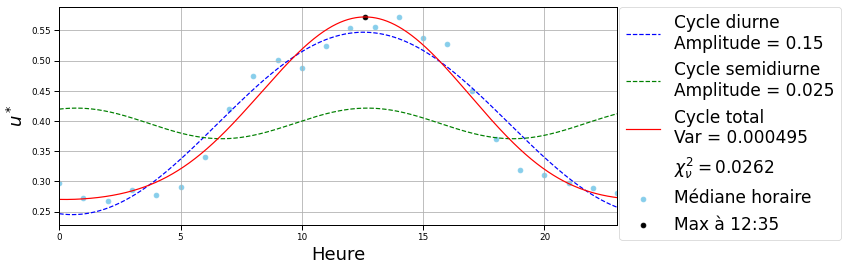

Fitted parameters:
peak_value = 12.593593593593594
C1 = 1.429006341631606
C2 = 1.2055360507794595
Number of season averaged: 2087
ustar printemps US-FL
ustar_printemps_US-FL
  station_id     saison    year
0         35  printemps  2017.0
1         35  printemps  2019.0
2
N hour used:  4261
12.731731731731733 12.0
1.2892892892892893 1.0
Chi2 = 0.36676851764372614, degrees of freedom = 20, p-value = 0.99999999999999, reduced chi2 = 0.01833842588218631
ustar_printemps_US-FL
True
saving


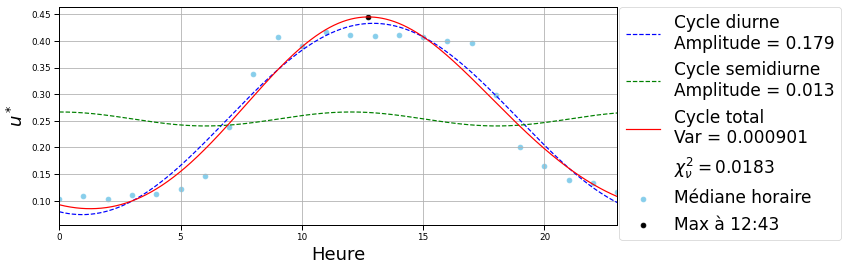

Fitted parameters:
peak_value = 12.731731731731733
C1 = 1.3241871311548938
C2 = -1.5887613010830846
Number of season averaged: 4261
ustar printemps toutes
ustar_printemps_toutes
   station_id     saison    year
0           2  printemps  2018.0
1           2  printemps  2020.0
2           3  printemps  2015.0
3           4  printemps  2015.0
4           4  printemps  2016.0
..        ...        ...     ...
67         33  printemps  2016.0
68         33  printemps  2017.0
69         33  printemps  2018.0
70         35  printemps  2017.0
71         35  printemps  2019.0

[72 rows x 3 columns]
72
N hour used:  135131
13.146146146146148 13.0
0.6906906906906908 0.0
Chi2 = 0.2220779886637675, degrees of freedom = 20, p-value = 0.9999999999999999, reduced chi2 = 0.011103899433188374
ustar_printemps_toutes
True
saving


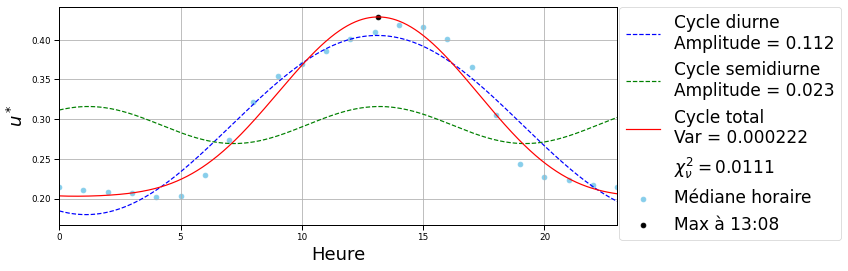

Fitted parameters:
peak_value = 13.146146146146148
C1 = 1.281885675279857
C2 = 0.9449908485743989
Number of season averaged: 135131
ustar été US-WA
ustar_été_US-WA
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
ustar été US-CA
ustar_été_US-CA
   station_id saison    year
0           3    été  2015.0
1           3    été  2016.0
2           3    été  2017.0
3           4    été  2015.0
4           4    été  2016.0
5           4    été  2017.0
6           4    été  2018.0
7           4    été  2019.0
8           4    été  2020.0
9           6    été  2015.0
10          6    été  2016.0
11          6    été  2017.0
12          6    été  2018.0
13          6    été  2019.0
14          6    été  2020.0
15         14    été  2017.0
16         14    été  2018.0
17         14    été  2019.0
18         15    été  2018.0
19         15    été  2019.0
20         17    été  2015.0
21         17    été  2016.0
22         17    été  2017.0
23         17    été  2018.0
24 

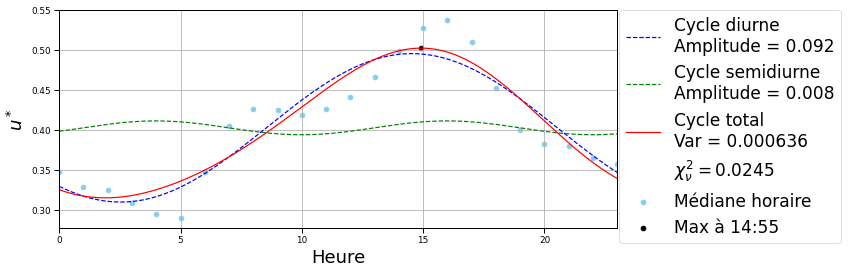

Fitted parameters:
peak_value = 14.91891891891892
C1 = 0.9076984461943595
C2 = -0.5167371406260122
Number of season averaged: 73096
ustar été US-MN
ustar_été_US-MN
   station_id saison    year
0           9    été  2017.0
1           9    été  2018.0
2           9    été  2019.0
3          20    été  2016.0
4          20    été  2017.0
5          20    été  2018.0
6          20    été  2019.0
7          25    été  2017.0
8          25    été  2018.0
9          25    été  2019.0
10         25    été  2020.0
11
N hour used:  20977
12.225225225225227 12.0
22.861861861861865 22.0
Chi2 = 0.14312155472402627, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.007156077736201314
ustar_été_US-MN
True
saving


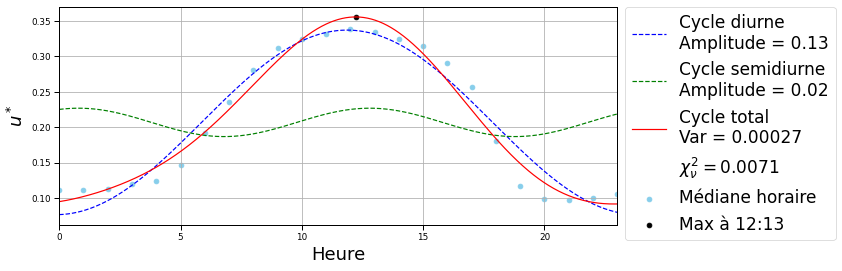

Fitted parameters:
peak_value = 12.225225225225227
C1 = -1.5355119302750482
C2 = 1.1543181500073898
Number of season averaged: 20977
ustar été US-IL
ustar_été_US-IL
  station_id saison    year
0         10    été  2016.0
1         10    été  2017.0
2         27    été  2016.0
3         27    été  2017.0
4         27    été  2018.0
5
N hour used:  8726
12.225225225225227 12.0
22.884884884884887 22.0
Chi2 = 0.14372251227215438, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.007186125613607719
ustar_été_US-IL
True
saving


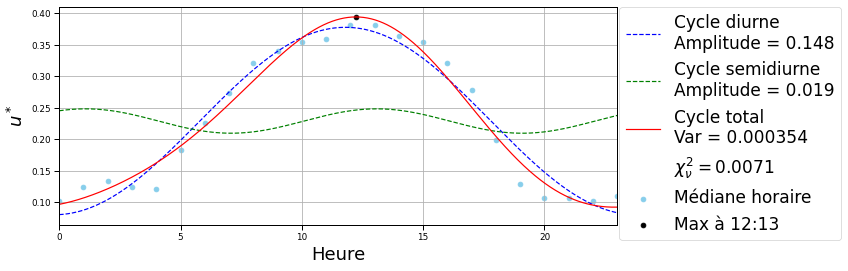

Fitted parameters:
peak_value = 12.225225225225227
C1 = -1.5172880035655774
C2 = 1.0018522040260376
Number of season averaged: 8726
ustar été US-ID
ustar_été_US-ID
   station_id saison    year
0          12    été  2015.0
1          12    été  2016.0
2          12    été  2017.0
3          12    été  2018.0
4          19    été  2015.0
5          19    été  2016.0
6          19    été  2017.0
7          19    été  2018.0
8          21    été  2015.0
9          21    été  2016.0
10         21    été  2017.0
11         21    été  2018.0
12         33    été  2015.0
13         33    été  2016.0
14         33    été  2017.0
15         33    été  2018.0
16
N hour used:  34248
13.284284284284285 13.0
3.3843843843843846 3.0
Chi2 = 0.12298771283975103, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.006149385641987552
ustar_été_US-ID
True
saving


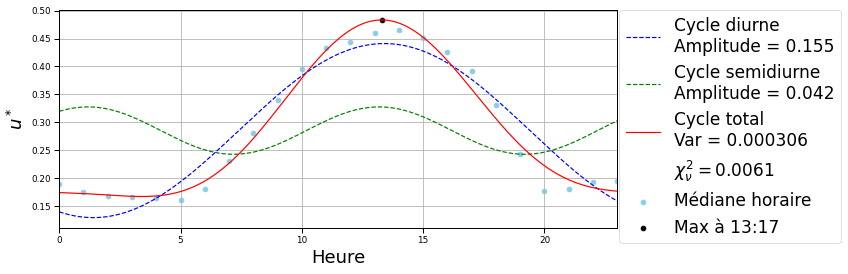

Fitted parameters:
peak_value = 13.284284284284285
C1 = 1.2042634594663313
C2 = 0.9504801228437112
Number of season averaged: 34248
ustar été CA-ON
ustar_été_CA-ON
  station_id saison    year
0         24    été  2016.0
1         24    été  2018.0
2         24    été  2019.0
3
N hour used:  5312
13.123123123123124 13.0
0.0 0.0
Chi2 = 0.2514056821180848, degrees of freedom = 20, p-value = 0.9999999999999998, reduced chi2 = 0.01257028410590424
ustar_été_CA-ON
True
saving


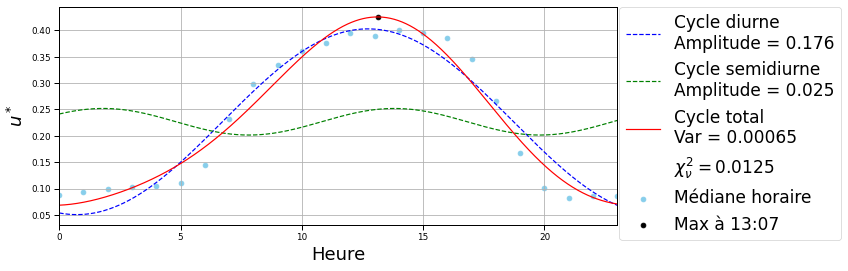

Fitted parameters:
peak_value = 13.123123123123124
C1 = 1.3808004210685736
C2 = 0.6216782343102984
Number of season averaged: 5312
ustar été US-AZ
ustar_été_US-AZ
  station_id saison    year
0         30    été  2016.0
1         30    été  2017.0
2         30    été  2018.0
3
N hour used:  5417
14.366366366366368 14.0
5.617617617617618 5.0
Chi2 = 0.41037975103110846, degrees of freedom = 20, p-value = 0.9999999999999697, reduced chi2 = 0.020518987551555422
ustar_été_US-AZ
True
saving


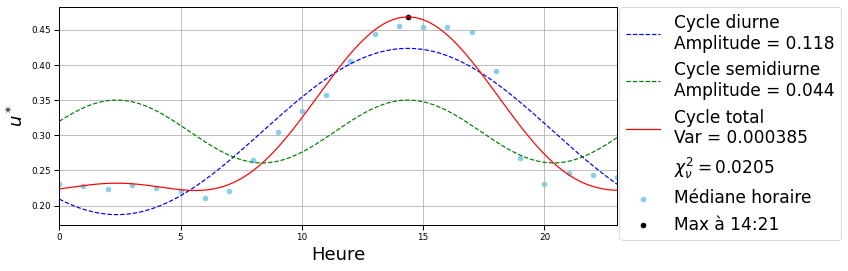

Fitted parameters:
peak_value = 14.366366366366368
C1 = 0.9491123606932913
C2 = 0.32923047848008574
Number of season averaged: 5417
ustar été US-DE
ustar_été_US-DE
  station_id saison    year
0         31    été  2015.0
1         31    été  2016.0
2         31    été  2017.0
3
N hour used:  6175
12.685685685685687 12.0
0.0 0.0
Chi2 = 0.7005064101148334, degrees of freedom = 20, p-value = 0.9999999999944287, reduced chi2 = 0.03502532050574167
ustar_été_US-DE
True
saving


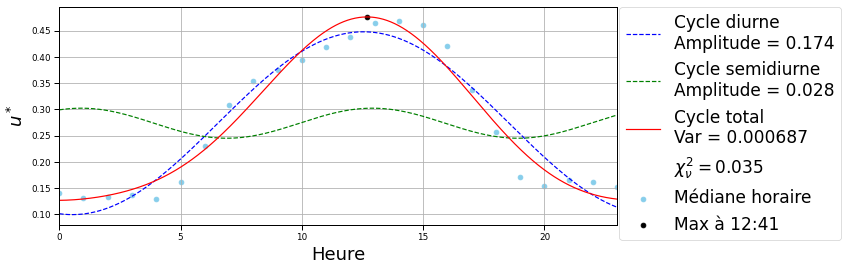

Fitted parameters:
peak_value = 12.685685685685687
C1 = 1.4293186197224599
C2 = 1.096348124900478
Number of season averaged: 6175
ustar été US-FL
ustar_été_US-FL
  station_id saison    year
0         35    été  2016.0
1         35    été  2018.0
2         35    été  2019.0
3
N hour used:  6385
12.478478478478479 12.0
1.1971971971971973 1.0
Chi2 = 0.43359164327349997, degrees of freedom = 20, p-value = 0.999999999999948, reduced chi2 = 0.021679582163675
ustar_été_US-FL
True
saving


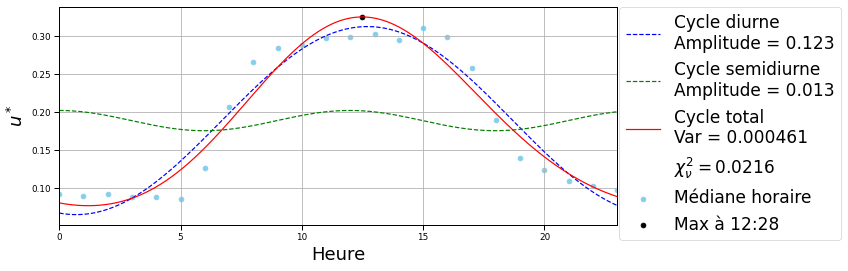

Fitted parameters:
peak_value = 12.478478478478479
C1 = 1.3873349465568905
C2 = 7.866610975273638
Number of season averaged: 6385
ustar été toutes
ustar_été_toutes
   station_id saison    year
0           3    été  2015.0
1           3    été  2016.0
2           3    été  2017.0
3           4    été  2015.0
4           4    été  2016.0
..        ...    ...     ...
75         33    été  2017.0
76         33    été  2018.0
77         35    été  2016.0
78         35    été  2018.0
79         35    été  2019.0

[80 rows x 3 columns]
80
N hour used:  160336
13.445445445445447 13.0
0.920920920920921 0.0
Chi2 = 0.38538679786172125, degrees of freedom = 20, p-value = 0.9999999999999837, reduced chi2 = 0.019269339893086063
ustar_été_toutes
True
saving


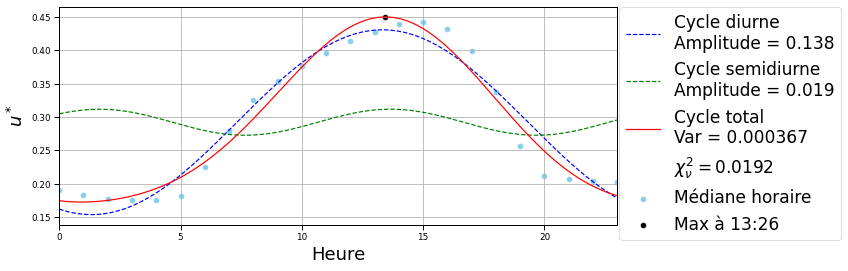

Fitted parameters:
peak_value = 13.445445445445447
C1 = 1.2237257450032473
C2 = 0.7014385489180484
Number of season averaged: 160336
ustar automne US-WA
ustar_automne_US-WA
  station_id   saison    year
0          5  automne  2017.0
1         28  automne  2020.0
2
N hour used:  3305
10.498498498498499 10.0
18.74074074074074 18.0
Chi2 = 0.14735039035416939, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.007367519517708469
ustar_automne_US-WA
True
saving


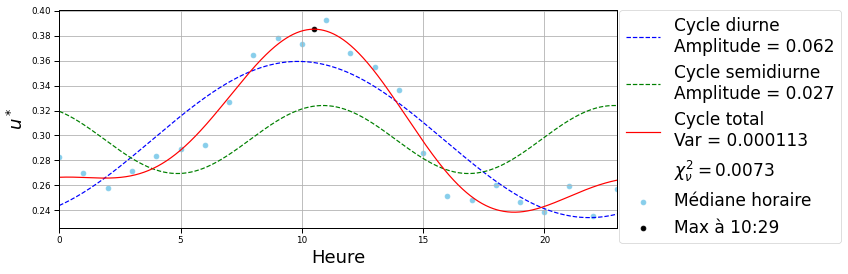

Fitted parameters:
peak_value = 10.498498498498499
C1 = -1.0066414592845947
C2 = -0.9801964680386013
Number of season averaged: 3305
ustar automne US-CA
ustar_automne_US-CA
   station_id   saison    year
0           4  automne  2015.0
1           4  automne  2016.0
2           4  automne  2017.0
3           4  automne  2019.0
4          14  automne  2016.0
5          14  automne  2017.0
6          14  automne  2019.0
7          15  automne  2018.0
8          17  automne  2015.0
9          17  automne  2016.0
10         17  automne  2017.0
11         17  automne  2018.0
12         17  automne  2019.0
13         17  automne  2020.0
14         22  automne  2018.0
15         23  automne  2018.0
16         23  automne  2019.0
17         23  automne  2020.0
18         26  automne  2017.0
19         26  automne  2018.0
20         26  automne  2019.0
21         26  automne  2020.0
22         29  automne  2020.0
23
N hour used:  41861
12.041041041041042 12.0
19.7997997997998 19.0
Chi2 = 0.09510

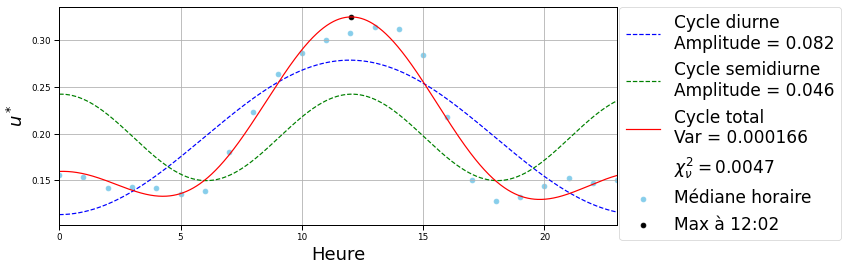

Fitted parameters:
peak_value = 12.041041041041042
C1 = -1.5640165253937464
C2 = 1.5385932068481754
Number of season averaged: 41861
ustar automne US-MN
ustar_automne_US-MN
   station_id   saison    year
0           9  automne  2017.0
1           9  automne  2018.0
2           9  automne  2019.0
3           9  automne  2020.0
4          20  automne  2016.0
5          20  automne  2017.0
6          20  automne  2018.0
7          20  automne  2019.0
8          20  automne  2020.0
9          25  automne  2017.0
10         25  automne  2018.0
11         25  automne  2019.0
12         25  automne  2020.0
13
N hour used:  24026
11.902902902902904 11.0
20.237237237237238 20.0
Chi2 = 0.07494339951227699, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0037471699756138495
ustar_automne_US-MN
True
saving


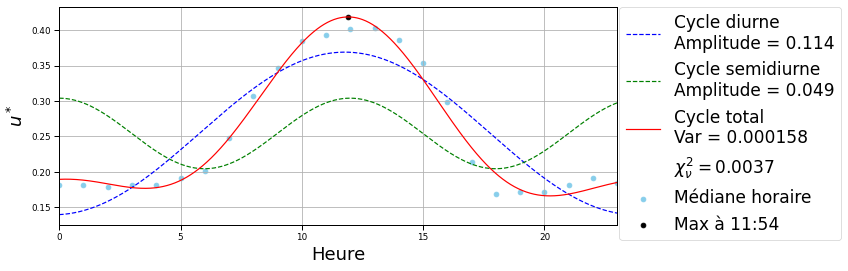

Fitted parameters:
peak_value = 11.902902902902904
C1 = -1.51133458323979
C2 = -1.5653509157291616
Number of season averaged: 24026
ustar automne US-IL
ustar_automne_US-IL
  station_id   saison    year
0         10  automne  2016.0
1         10  automne  2017.0
2         27  automne  2016.0
3         27  automne  2017.0
4         27  automne  2018.0
5
N hour used:  8490
11.580580580580582 11.0
20.421421421421424 20.0
Chi2 = 0.044895890616938834, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0022447945308469415
ustar_automne_US-IL
True
saving


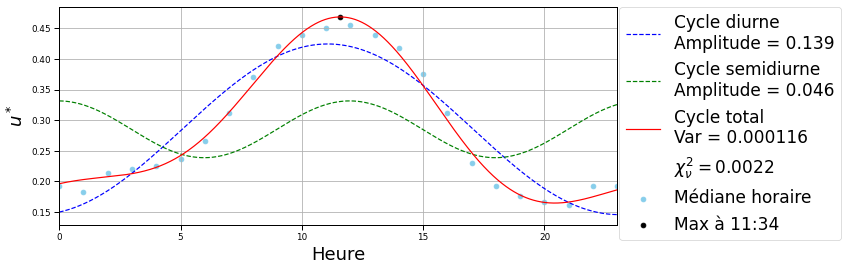

Fitted parameters:
peak_value = 11.580580580580582
C1 = -1.3263362511027452
C2 = 1.5852560140821934
Number of season averaged: 8490
ustar automne US-ID
ustar_automne_US-ID
  station_id   saison    year
0         12  automne  2015.0
1         12  automne  2016.0
2         12  automne  2017.0
3         19  automne  2016.0
4         21  automne  2015.0
5         21  automne  2016.0
6         21  automne  2017.0
7         33  automne  2015.0
8         33  automne  2016.0
9         33  automne  2017.0
10
N hour used:  20070
12.915915915915917 12.0
5.18018018018018 5.0
Chi2 = 0.06658805188805433, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0033294025944027167
ustar_automne_US-ID
True
saving


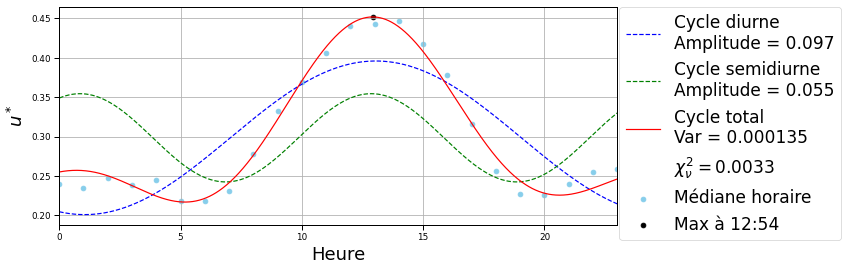

Fitted parameters:
peak_value = 12.915915915915917
C1 = 1.2962662263616438
C2 = 1.1215788195838556
Number of season averaged: 20070
ustar automne CA-ON
ustar_automne_CA-ON
  station_id   saison    year
0         24  automne  2020.0
1
N hour used:  1661
12.616616616616618 12.0
4.1441441441441444 4.0
Chi2 = 0.0640498994813225, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0032024949740661252
ustar_automne_CA-ON
True
saving


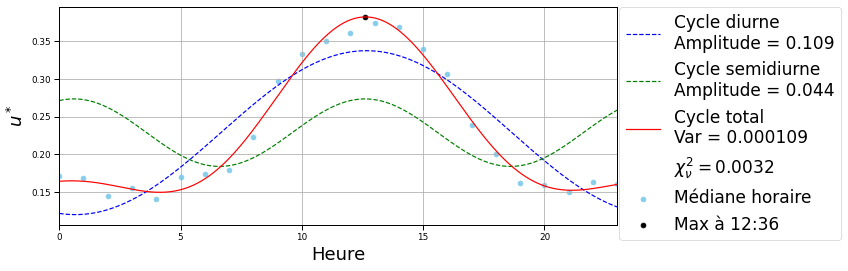

Fitted parameters:
peak_value = 12.616616616616618
C1 = 1.3975273122964076
C2 = 1.2553375746977613
Number of season averaged: 1661
ustar automne US-AZ
ustar_automne_US-AZ
  station_id   saison    year
0         30  automne  2015.0
1         30  automne  2016.0
2
N hour used:  4121
13.307307307307308 13.0
20.766766766766768 20.0
Chi2 = 0.4956944193079157, degrees of freedom = 20, p-value = 0.9999999999998076, reduced chi2 = 0.024784720965395784
ustar_automne_US-AZ
True
saving


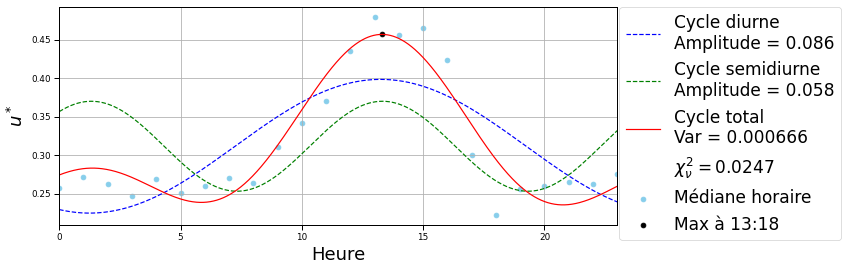

Fitted parameters:
peak_value = 13.307307307307308
C1 = 1.2444048910418444
C2 = 0.8780190602286962
Number of season averaged: 4121
ustar automne US-DE
ustar_automne_US-DE
  station_id   saison    year
0         31  automne  2015.0
1         31  automne  2016.0
2         31  automne  2017.0
3
N hour used:  6257
11.672672672672673 11.0
20.26026026026026 20.0
Chi2 = 0.10488374756262553, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.005244187378131276
ustar_automne_US-DE
True
saving


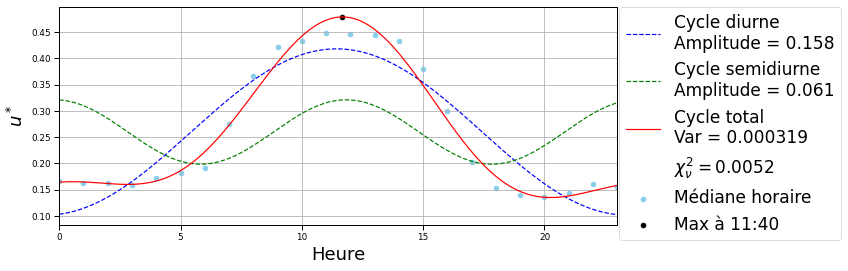

Fitted parameters:
peak_value = 11.672672672672673
C1 = -1.4227359649260696
C2 = -1.4816483902680881
Number of season averaged: 6257
ustar automne US-FL
ustar_automne_US-FL
  station_id   saison    year
0         35  automne  2017.0
1         35  automne  2018.0
2         35  automne  2019.0
3
N hour used:  5813
11.94894894894895 11.0
2.5785785785785786 2.0
Chi2 = 0.2834874512723252, degrees of freedom = 20, p-value = 0.9999999999999992, reduced chi2 = 0.01417437256361626
ustar_automne_US-FL
True
saving


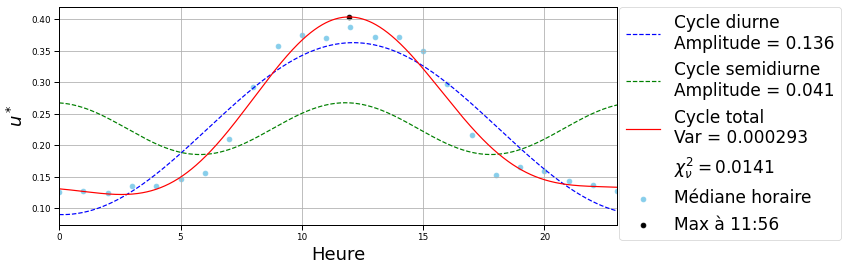

Fitted parameters:
peak_value = 11.94894894894895
C1 = -1.6021845762806517
C2 = -1.463315315919966
Number of season averaged: 5813
ustar automne toutes
ustar_automne_toutes
   station_id   saison    year
0           4  automne  2015.0
1           4  automne  2016.0
2           4  automne  2017.0
3           4  automne  2019.0
4           5  automne  2017.0
..        ...      ...     ...
57         33  automne  2016.0
58         33  automne  2017.0
59         35  automne  2017.0
60         35  automne  2018.0
61         35  automne  2019.0

[62 rows x 3 columns]
62
N hour used:  115604
12.133133133133134 12.0
20.49049049049049 20.0
Chi2 = 0.07693141512064752, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.003846570756032376
ustar_automne_toutes
True
saving


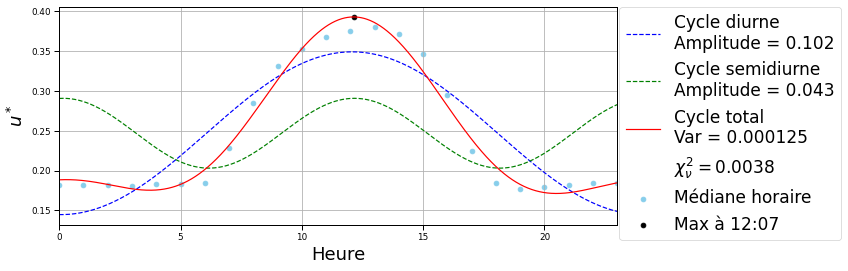

Fitted parameters:
peak_value = 12.133133133133134
C1 = -1.5894641096991462
C2 = 1.484393198367483
Number of season averaged: 115604
ustar toutes US-WA
ustar_toutes_US-WA
  station_id     saison    year
0          2  printemps  2018.0
1          2  printemps  2020.0
2          5    automne  2017.0
3          5  printemps  2018.0
4         28    automne  2020.0
5
N hour used:  8566
11.235235235235235 11.0
20.145145145145147 20.0
Chi2 = 0.03922772689409989, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0019613863447049944
ustar_toutes_US-WA
True
saving


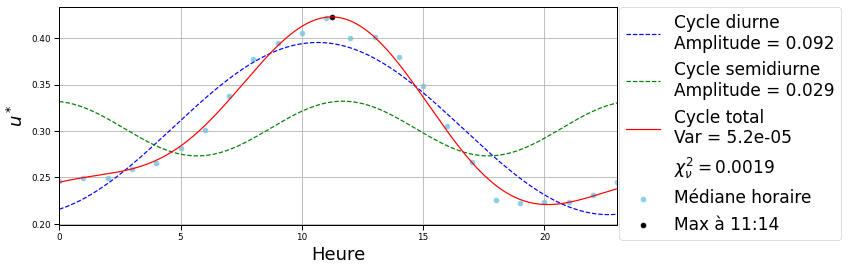

Fitted parameters:
peak_value = 11.235235235235235
C1 = -1.215524038723857
C2 = -1.4082778439999482
Number of season averaged: 8566
ustar toutes US-CA
ustar_toutes_US-CA
   station_id     saison    year
0           3  printemps  2015.0
1           3        été  2015.0
2           3        été  2016.0
3           3        été  2017.0
4           4  printemps  2015.0
..        ...        ...     ...
93         29        été  2017.0
94         29  printemps  2019.0
95         29        été  2019.0
96         29  printemps  2020.0
97         29    automne  2020.0

[98 rows x 3 columns]
98
N hour used:  179187
13.675675675675677 13.0
2.5095095095095097 2.0
Chi2 = 0.3003786414616413, degrees of freedom = 20, p-value = 0.9999999999999986, reduced chi2 = 0.015018932073082063
ustar_toutes_US-CA
True
saving


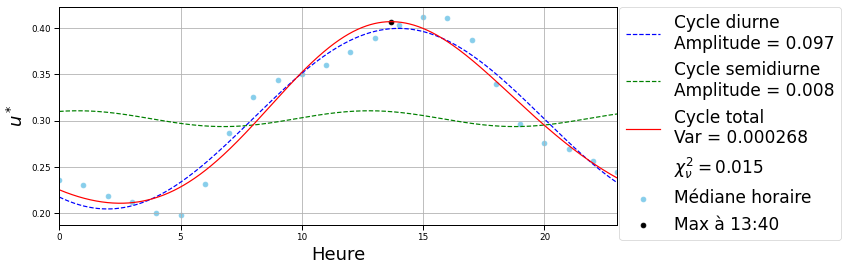

Fitted parameters:
peak_value = 13.675675675675677
C1 = 1.0509678145595878
C2 = 1.1646624021333074
Number of season averaged: 179187
ustar toutes US-MN
ustar_toutes_US-MN
   station_id     saison    year
0           9  printemps  2017.0
1           9        été  2017.0
2           9    automne  2017.0
3           9      hiver  2017.0
4           9      hiver  2018.0
5           9        été  2018.0
6           9    automne  2018.0
7           9      hiver  2019.0
8           9  printemps  2019.0
9           9        été  2019.0
10          9    automne  2019.0
11          9      hiver  2020.0
12          9    automne  2020.0
13         20  printemps  2016.0
14         20        été  2016.0
15         20    automne  2016.0
16         20      hiver  2016.0
17         20      hiver  2017.0
18         20  printemps  2017.0
19         20        été  2017.0
20         20    automne  2017.0
21         20      hiver  2018.0
22         20  printemps  2018.0
23         20        été  2018.0
24  

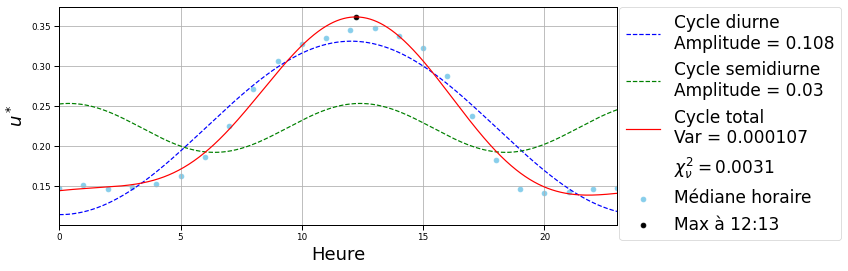

Fitted parameters:
peak_value = 12.225225225225227
C1 = -1.5792000852876718
C2 = 1.3621064571154016
Number of season averaged: 83640
ustar toutes US-IL
ustar_toutes_US-IL
   station_id     saison    year
0          10  printemps  2016.0
1          10        été  2016.0
2          10    automne  2016.0
3          10  printemps  2017.0
4          10        été  2017.0
5          10    automne  2017.0
6          10      hiver  2017.0
7          10      hiver  2018.0
8          10  printemps  2018.0
9          27  printemps  2016.0
10         27        été  2016.0
11         27    automne  2016.0
12         27        été  2017.0
13         27    automne  2017.0
14         27  printemps  2018.0
15         27        été  2018.0
16         27    automne  2018.0
17
N hour used:  27889
11.971971971971973 11.0
22.47047047047047 22.0
Chi2 = 0.09803596184014324, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.004901798092007162
ustar_toutes_US-IL
True
saving


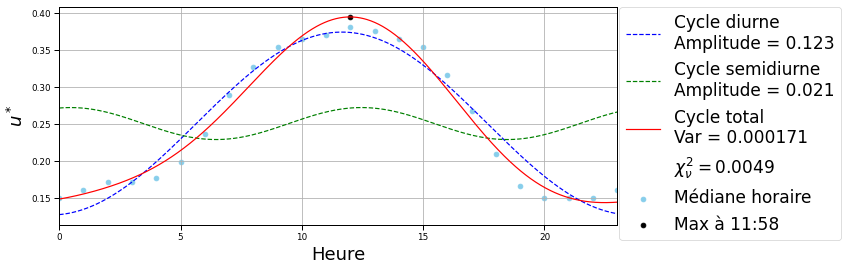

Fitted parameters:
peak_value = 11.971971971971973
C1 = -1.4790388431661259
C2 = 1.3290019709023588
Number of season averaged: 27889
ustar toutes US-ID
ustar_toutes_US-ID
   station_id     saison    year
0          12        été  2015.0
1          12    automne  2015.0
2          12  printemps  2016.0
3          12        été  2016.0
4          12    automne  2016.0
5          12  printemps  2017.0
6          12        été  2017.0
7          12    automne  2017.0
8          12      hiver  2017.0
9          12      hiver  2018.0
10         12  printemps  2018.0
11         12        été  2018.0
12         19        été  2015.0
13         19  printemps  2016.0
14         19        été  2016.0
15         19    automne  2016.0
16         19  printemps  2017.0
17         19        été  2017.0
18         19  printemps  2018.0
19         19        été  2018.0
20         21  printemps  2015.0
21         21        été  2015.0
22         21    automne  2015.0
23         21      hiver  2015.0
24  

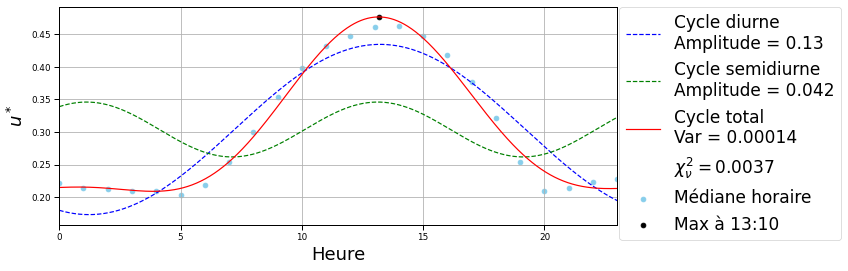

Fitted parameters:
peak_value = 13.16916916916917
C1 = 1.2510336442661525
C2 = 0.9823779235020216
Number of season averaged: 89070
ustar toutes CA-ON
ustar_toutes_CA-ON
  station_id     saison    year
0         24  printemps  2016.0
1         24        été  2016.0
2         24        été  2018.0
3         24  printemps  2019.0
4         24        été  2019.0
5         24  printemps  2020.0
6         24    automne  2020.0
7
N hour used:  12072
12.915915915915917 12.0
0.0 0.0
Chi2 = 0.14991627054547102, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.007495813527273551
ustar_toutes_CA-ON
True
saving


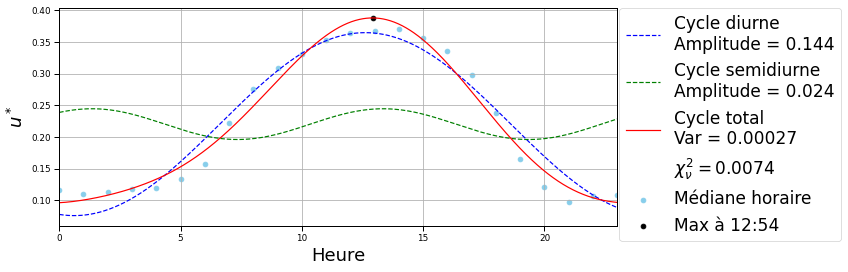

Fitted parameters:
peak_value = 12.915915915915917
C1 = 1.409572171884219
C2 = 0.8653060855664518
Number of season averaged: 12072
ustar toutes US-AZ
ustar_toutes_US-AZ
   station_id     saison    year
0          30  printemps  2015.0
1          30    automne  2015.0
2          30  printemps  2016.0
3          30        été  2016.0
4          30    automne  2016.0
5          30      hiver  2016.0
6          30      hiver  2017.0
7          30  printemps  2017.0
8          30        été  2017.0
9          30  printemps  2018.0
10         30        été  2018.0
11
N hour used:  19679
14.044044044044044 14.0
22.24024024024024 22.0
Chi2 = 0.21873201819605595, degrees of freedom = 20, p-value = 0.9999999999999999, reduced chi2 = 0.010936600909802797
ustar_toutes_US-AZ
True
saving


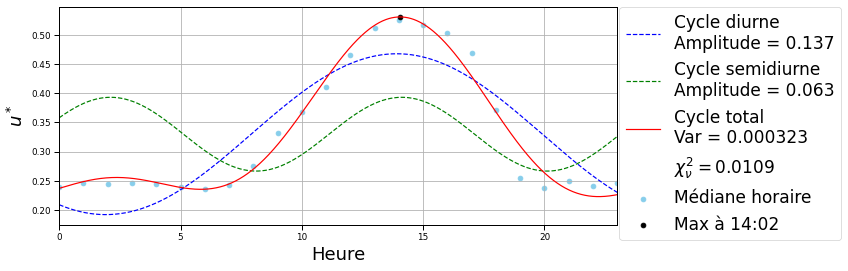

Fitted parameters:
peak_value = 14.044044044044044
C1 = 1.0700740167086145
C2 = 0.46105253654449135
Number of season averaged: 19679
ustar toutes US-DE
ustar_toutes_US-DE
  station_id     saison    year
0         31        été  2015.0
1         31    automne  2015.0
2         31        été  2016.0
3         31    automne  2016.0
4         31      hiver  2016.0
5         31      hiver  2017.0
6         31  printemps  2017.0
7         31        été  2017.0
8         31    automne  2017.0
9
N hour used:  16444
12.156156156156158 12.0
22.14814814814815 22.0
Chi2 = 1.7025144514592818, degrees of freedom = 20, p-value = 0.9999999745386627, reduced chi2 = 0.0851257225729641
ustar_toutes_US-DE
True
saving


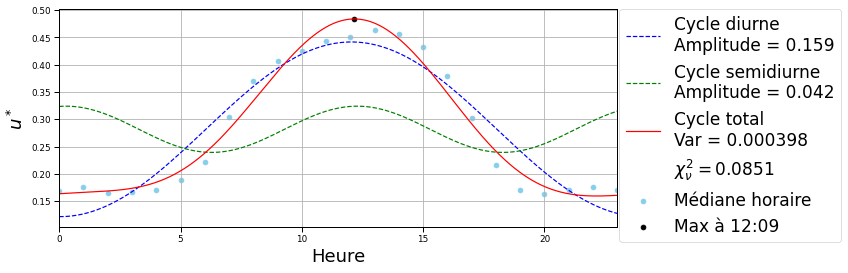

Fitted parameters:
peak_value = 12.156156156156158
C1 = -1.581765737331666
C2 = 1.4220394531324754
Number of season averaged: 16444
ustar toutes US-FL
ustar_toutes_US-FL
  station_id     saison    year
0         35        été  2016.0
1         35  printemps  2017.0
2         35    automne  2017.0
3         35        été  2018.0
4         35    automne  2018.0
5         35      hiver  2018.0
6         35      hiver  2019.0
7         35  printemps  2019.0
8         35        été  2019.0
9         35    automne  2019.0
10
N hour used:  18511
12.317317317317318 12.0
1.6806806806806809 1.0
Chi2 = 0.15879615360772348, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.007939807680386175
ustar_toutes_US-FL
True
saving


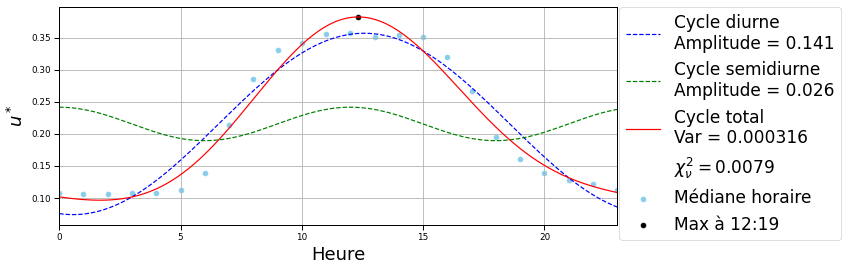

Fitted parameters:
peak_value = 12.317317317317318
C1 = 1.4212752700646198
C2 = -4.7088427216291056
Number of season averaged: 18511
ustar toutes toutes
ustar_toutes_toutes
    station_id     saison    year
0            2  printemps  2018.0
1            2  printemps  2020.0
2            3  printemps  2015.0
3            3        été  2015.0
4            3        été  2016.0
..         ...        ...     ...
247         35      hiver  2018.0
248         35      hiver  2019.0
249         35  printemps  2019.0
250         35        été  2019.0
251         35    automne  2019.0

[252 rows x 3 columns]
252
N hour used:  455058
12.86986986986987 12.0
1.6576576576576578 1.0
Chi2 = 0.09232640605315323, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.004616320302657661
ustar_toutes_toutes
True
saving


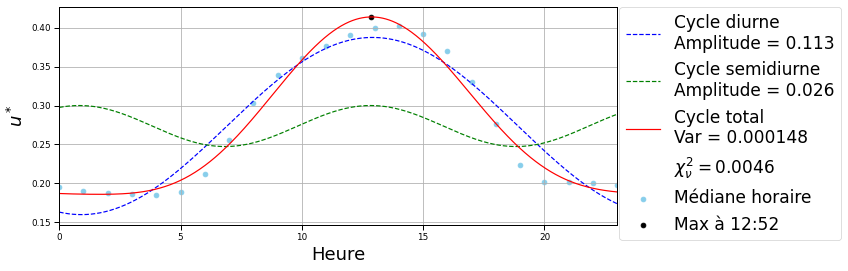

Fitted parameters:
peak_value = 12.86986986986987
C1 = 1.3319013148025218
C2 = 1.1358008129468788
Number of season averaged: 455058
ZL hiver US-WA
ZL_hiver_US-WA
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
ZL hiver US-CA
ZL_hiver_US-CA
  station_id saison    year
0          4  hiver  2015.0
1          4  hiver  2016.0
2          4  hiver  2017.0
3          4  hiver  2018.0
4          4  hiver  2019.0
5          4  hiver  2020.0
6         17  hiver  2019.0
7         17  hiver  2020.0
8
N hour used:  6776
19.753753753753756 19.0
11.511511511511513 11.0
Chi2 = 2.116690487287955, degrees of freedom = 20, p-value = 0.9999998136134676, reduced chi2 = 0.10583452436439775
ZL_hiver_US-CA
True
saving


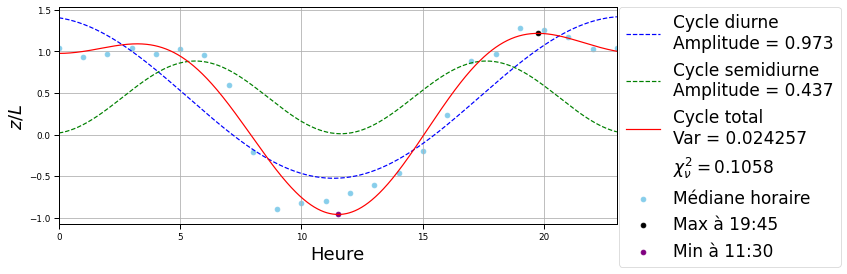

Fitted parameters:
peak_value = 19.753753753753756
C1 = 1.7481288462081899
C2 = -1.3719040137074363
Number of season averaged: 6776
ZL hiver US-MN
ZL_hiver_US-MN
   station_id saison    year
0           9  hiver  2017.0
1           9  hiver  2018.0
2           9  hiver  2019.0
3           9  hiver  2020.0
4          20  hiver  2016.0
5          20  hiver  2017.0
6          20  hiver  2018.0
7          20  hiver  2019.0
8          20  hiver  2020.0
9          25  hiver  2017.0
10         25  hiver  2018.0
11         25  hiver  2019.0
12         25  hiver  2020.0
13
N hour used:  18071
19.27027027027027 19.0
11.511511511511513 11.0
Chi2 = 0.2230827365430901, degrees of freedom = 20, p-value = 0.9999999999999999, reduced chi2 = 0.011154136827154505
ZL_hiver_US-MN
True
saving


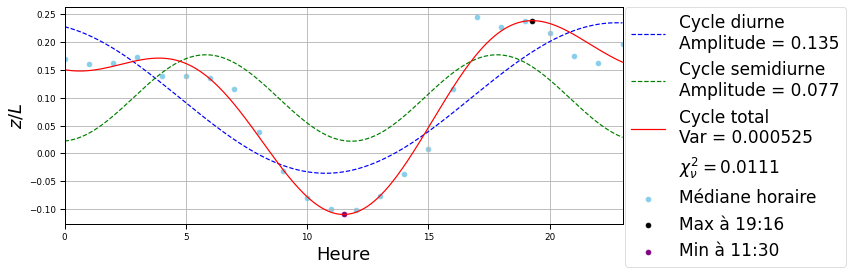

Fitted parameters:
peak_value = 19.27027027027027
C1 = -1.2463668012126732
C2 = -1.478484676976428
Number of season averaged: 18071
ZL hiver US-IL
ZL_hiver_US-IL
  station_id saison    year
0         10  hiver  2017.0
1         10  hiver  2018.0
2
N hour used:  1785
19.24724724724725 19.0
11.488488488488489 11.0
Chi2 = 0.2087020342732266, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.01043510171366133
ZL_hiver_US-IL
True
saving


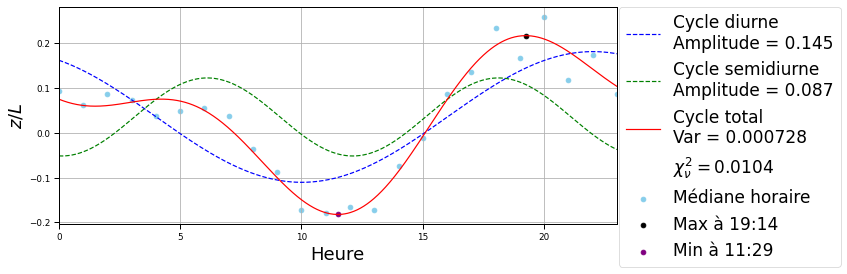

Fitted parameters:
peak_value = 19.24724724724725
C1 = -1.050759419429405
C2 = 1.5110092654533882
Number of season averaged: 1785
ZL hiver US-ID
ZL_hiver_US-ID
  station_id saison    year
0         12  hiver  2017.0
1         12  hiver  2018.0
2         21  hiver  2015.0
3         21  hiver  2016.0
4         21  hiver  2017.0
5         21  hiver  2018.0
6         33  hiver  2016.0
7         33  hiver  2017.0
8         33  hiver  2018.0
9
N hour used:  11236
20.651651651651655 20.0
12.501501501501503 12.0
Chi2 = 0.1910860719103077, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009554303595515384
ZL_hiver_US-ID
True
saving


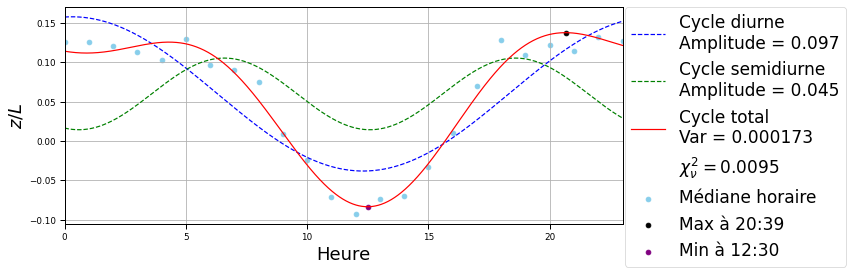

Fitted parameters:
peak_value = 20.651651651651655
C1 = 1.4894790526452093
C2 = 1.2626600233455478
Number of season averaged: 11236
ZL hiver CA-ON
ZL_hiver_CA-ON
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
ZL hiver US-AZ
ZL_hiver_US-AZ
  station_id saison    year
0         30  hiver  2016.0
1         30  hiver  2017.0
2
N hour used:  2142
19.2012012012012 19.0
11.488488488488489 11.0
Chi2 = 4.580987095619888, degrees of freedom = 20, p-value = 0.9998607225840496, reduced chi2 = 0.22904935478099442
ZL_hiver_US-AZ
True
saving


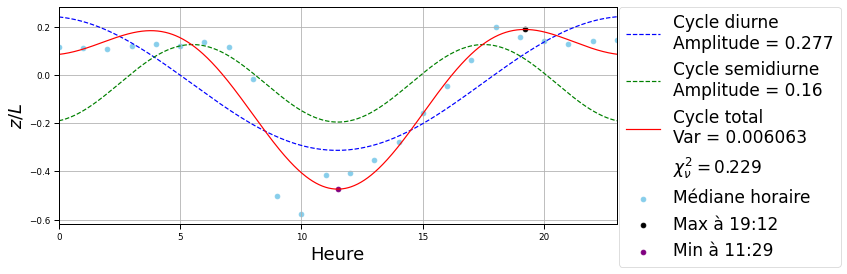

Fitted parameters:
peak_value = 19.2012012012012
C1 = -1.4307929118318332
C2 = -1.310825136144533
Number of season averaged: 2142
ZL hiver US-DE
ZL_hiver_US-DE
  station_id saison    year
0         31  hiver  2016.0
1         31  hiver  2017.0
2
N hour used:  1925
19.10910910910911 19.0
11.166166166166168 11.0
Chi2 = 0.21571222881837537, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.010785611440918769
ZL_hiver_US-DE
True
saving


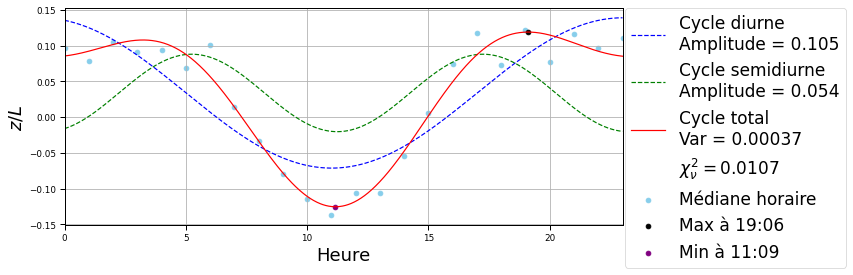

Fitted parameters:
peak_value = 19.10910910910911
C1 = -1.3120910326318107
C2 = -1.1740163844641411
Number of season averaged: 1925
ZL hiver US-FL
ZL_hiver_US-FL
  station_id saison    year
0         35  hiver  2018.0
1         35  hiver  2019.0
2
N hour used:  2052
20.352352352352355 20.0
11.971971971971973 11.0
Chi2 = 0.9822143445133887, degrees of freedom = 20, p-value = 0.9999999998559636, reduced chi2 = 0.04911071722566944
ZL_hiver_US-FL
True
saving


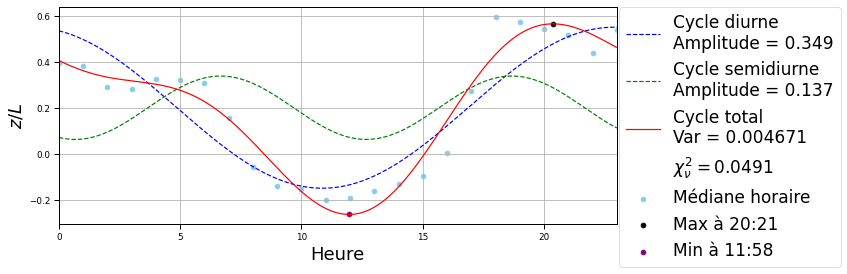

Fitted parameters:
peak_value = 20.352352352352355
C1 = -1.2736790570730578
C2 = 1.2196645078720236
Number of season averaged: 2052
ZL hiver toutes
ZL_hiver_toutes
   station_id saison    year
0           4  hiver  2015.0
1           4  hiver  2016.0
2           4  hiver  2017.0
3           4  hiver  2018.0
4           4  hiver  2019.0
5           4  hiver  2020.0
6           9  hiver  2017.0
7           9  hiver  2018.0
8           9  hiver  2019.0
9           9  hiver  2020.0
10         10  hiver  2017.0
11         10  hiver  2018.0
12         12  hiver  2017.0
13         12  hiver  2018.0
14         17  hiver  2019.0
15         17  hiver  2020.0
16         20  hiver  2016.0
17         20  hiver  2017.0
18         20  hiver  2018.0
19         20  hiver  2019.0
20         20  hiver  2020.0
21         21  hiver  2015.0
22         21  hiver  2016.0
23         21  hiver  2017.0
24         21  hiver  2018.0
25         25  hiver  2017.0
26         25  hiver  2018.0
27         25  hiver  20

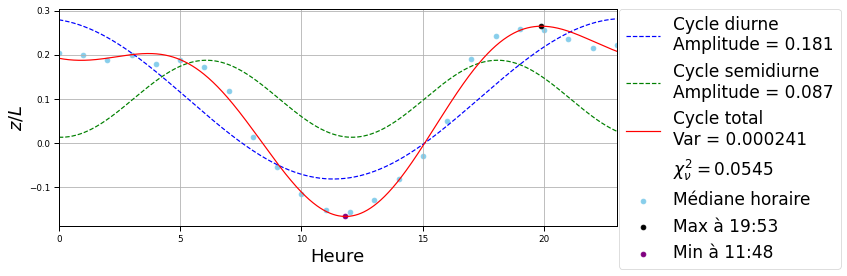

Fitted parameters:
peak_value = 19.891891891891895
C1 = -1.3913714779600104
C2 = -1.6121072182918315
Number of season averaged: 43987
ZL printemps US-WA
ZL_printemps_US-WA
  station_id     saison    year
0          2  printemps  2018.0
1          2  printemps  2020.0
2          5  printemps  2018.0
3
N hour used:  5261
22.37837837837838 22.0
11.764764764764765 11.0
Chi2 = 1.9248923132552336, degrees of freedom = 20, p-value = 0.9999999213935267, reduced chi2 = 0.09624461566276168
ZL_printemps_US-WA
True
saving


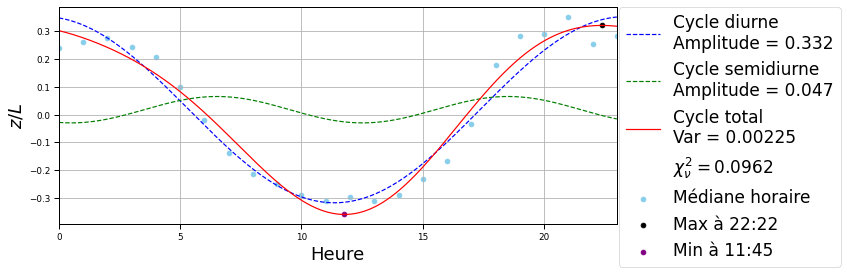

Fitted parameters:
peak_value = 22.37837837837838
C1 = 1.7385016460134137
C2 = 1.3008816342772025
Number of season averaged: 5261
ZL printemps US-CA
ZL_printemps_US-CA
   station_id     saison    year
0           3  printemps  2015.0
1           4  printemps  2015.0
2           4  printemps  2016.0
3           4  printemps  2017.0
4           4  printemps  2018.0
5           4  printemps  2019.0
6           4  printemps  2020.0
7          14  printemps  2017.0
8          14  printemps  2018.0
9          14  printemps  2019.0
10         14  printemps  2020.0
11         15  printemps  2019.0
12         17  printemps  2015.0
13         17  printemps  2016.0
14         17  printemps  2017.0
15         17  printemps  2018.0
16         17  printemps  2019.0
17         17  printemps  2020.0
18         22  printemps  2019.0
19         22  printemps  2020.0
20         23  printemps  2015.0
21         23  printemps  2017.0
22         23  printemps  2018.0
23         23  printemps  2019.0
24     

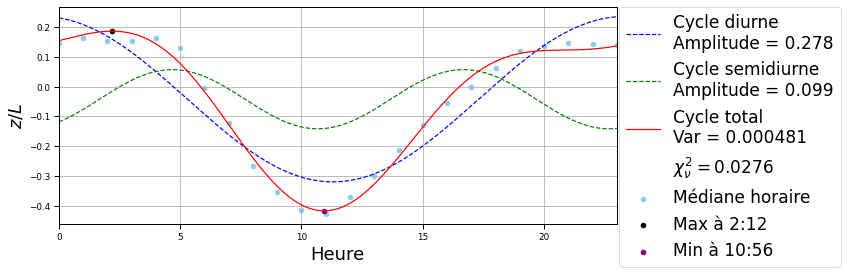

Fitted parameters:
peak_value = 2.21021021021021
C1 = -1.38777756973005
C2 = -0.8763426976954523
Number of season averaged: 57454
ZL printemps US-MN
ZL_printemps_US-MN
   station_id     saison    year
0           9  printemps  2017.0
1           9  printemps  2019.0
2          20  printemps  2016.0
3          20  printemps  2017.0
4          20  printemps  2018.0
5          20  printemps  2019.0
6          20  printemps  2020.0
7          25  printemps  2017.0
8          25  printemps  2018.0
9          25  printemps  2019.0
10         25  printemps  2020.0
11
N hour used:  20566
23.0 23.0
11.327327327327328 11.0
Chi2 = 0.5623957245994742, degrees of freedom = 20, p-value = 0.9999999999993401, reduced chi2 = 0.028119786229973708
ZL_printemps_US-MN
True
saving


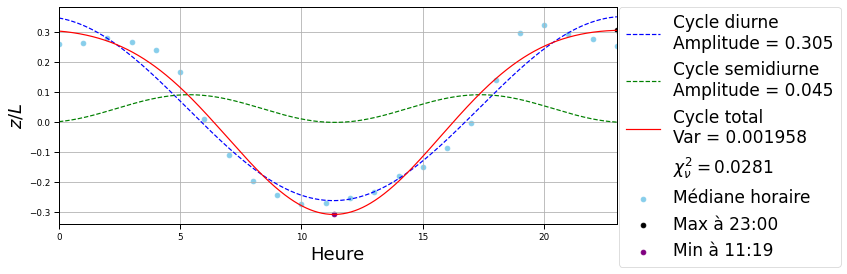

Fitted parameters:
peak_value = 23.0
C1 = -1.3900793281344774
C2 = -1.241771108407387
Number of season averaged: 20566
ZL printemps US-IL
ZL_printemps_US-IL
  station_id     saison    year
0         10  printemps  2016.0
1         10  printemps  2017.0
2         10  printemps  2018.0
3         27  printemps  2016.0
4         27  printemps  2018.0
5
N hour used:  8888
22.401401401401404 22.0
11.212212212212213 11.0
Chi2 = 0.18734678507842537, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009367339253921268
ZL_printemps_US-IL
True
saving


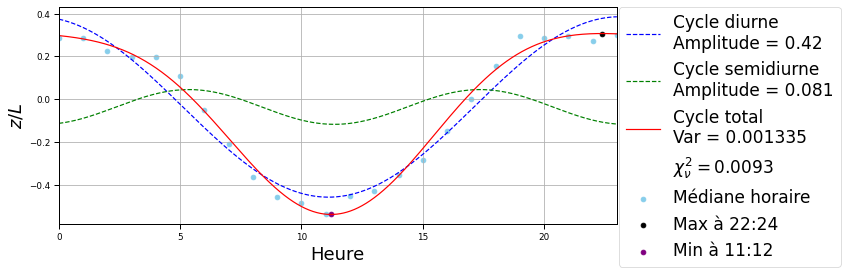

Fitted parameters:
peak_value = 22.401401401401404
C1 = -1.3380443714874461
C2 = -1.2356694642333315
Number of season averaged: 8888
ZL printemps US-ID
ZL_printemps_US-ID
   station_id     saison    year
0          12  printemps  2016.0
1          12  printemps  2017.0
2          12  printemps  2018.0
3          19  printemps  2016.0
4          19  printemps  2017.0
5          19  printemps  2018.0
6          21  printemps  2015.0
7          21  printemps  2017.0
8          21  printemps  2018.0
9          33  printemps  2016.0
10         33  printemps  2017.0
11         33  printemps  2018.0
12
N hour used:  23516
0.4604604604604605 0.0
11.925925925925927 11.0
Chi2 = 0.35457269137641134, degrees of freedom = 20, p-value = 0.9999999999999928, reduced chi2 = 0.017728634568820567
ZL_printemps_US-ID
True
saving


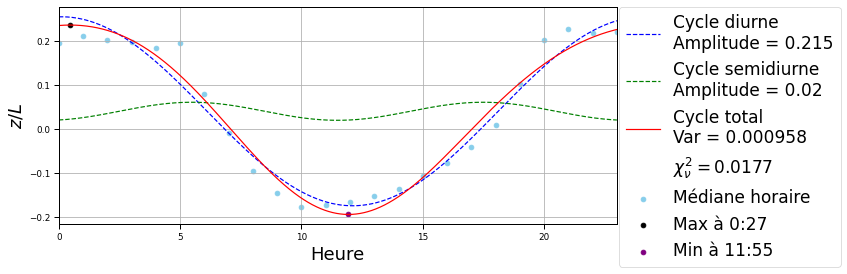

Fitted parameters:
peak_value = 0.4604604604604605
C1 = 1.5424737895927028
C2 = -1.300914548261963
Number of season averaged: 23516
ZL printemps CA-ON
ZL_printemps_CA-ON
  station_id     saison    year
0         24  printemps  2016.0
1         24  printemps  2019.0
2         24  printemps  2020.0
3
N hour used:  5099
22.631631631631635 22.0
11.557557557557558 11.0
Chi2 = 1.6986979993804263, degrees of freedom = 20, p-value = 0.999999975060763, reduced chi2 = 0.08493489996902132
ZL_printemps_CA-ON
True
saving


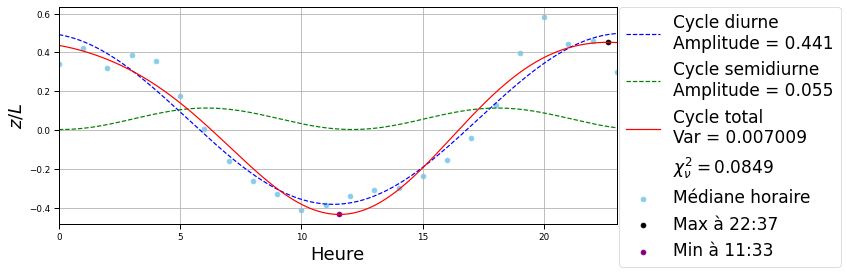

Fitted parameters:
peak_value = 22.631631631631635
C1 = -4.530036662800929
C2 = 1.5254085748359576
Number of season averaged: 5099
ZL printemps US-AZ
ZL_printemps_US-AZ
  station_id     saison    year
0         30  printemps  2015.0
1         30  printemps  2016.0
2         30  printemps  2017.0
3         30  printemps  2018.0
4
N hour used:  7999
1.841841841841842 1.0
10.337337337337338 10.0
Chi2 = 2.374734000676056, degrees of freedom = 20, p-value = 0.9999994757759337, reduced chi2 = 0.1187367000338028
ZL_printemps_US-AZ
True
saving


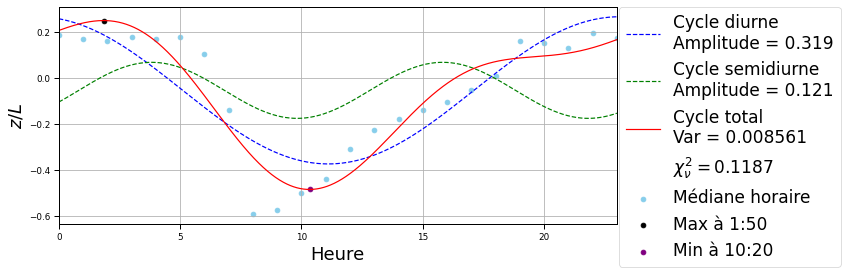

Fitted parameters:
peak_value = 1.841841841841842
C1 = -1.336668021955678
C2 = -0.42965507430590655
Number of season averaged: 7999
ZL printemps US-DE
ZL_printemps_US-DE
  station_id     saison    year
0         31  printemps  2017.0
1
N hour used:  2087
1.3353353353353354 1.0
11.64964964964965 11.0
Chi2 = 0.10884455913371342, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.005442227956685671
ZL_printemps_US-DE
True
saving


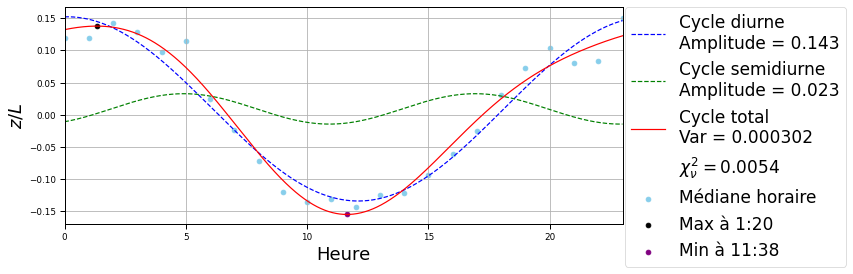

Fitted parameters:
peak_value = 1.3353353353353354
C1 = 1.5427325361017163
C2 = -1.0062883719458116
Number of season averaged: 2087
ZL printemps US-FL
ZL_printemps_US-FL
  station_id     saison    year
0         35  printemps  2017.0
1         35  printemps  2019.0
2
N hour used:  4261
0.32232232232232233 0.0
11.488488488488489 11.0
Chi2 = 38.194891711331834, degrees of freedom = 20, p-value = 0.008382343880159238, reduced chi2 = 1.9097445855665918
ZL_printemps_US-FL
True
saving


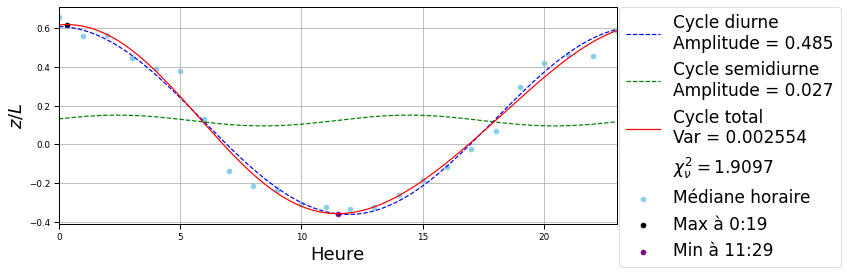

Fitted parameters:
peak_value = 0.32232232232232233
C1 = 1.587603689432785
C2 = 0.3000938902701801
Number of season averaged: 4261
ZL printemps toutes
ZL_printemps_toutes
   station_id     saison    year
0           2  printemps  2018.0
1           2  printemps  2020.0
2           3  printemps  2015.0
3           4  printemps  2015.0
4           4  printemps  2016.0
..        ...        ...     ...
67         33  printemps  2016.0
68         33  printemps  2017.0
69         33  printemps  2018.0
70         35  printemps  2017.0
71         35  printemps  2019.0

[72 rows x 3 columns]
72
N hour used:  135131
1.0360360360360361 1.0
11.143143143143144 11.0
Chi2 = 0.18221629183745164, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009110814591872582
ZL_printemps_toutes
True
saving


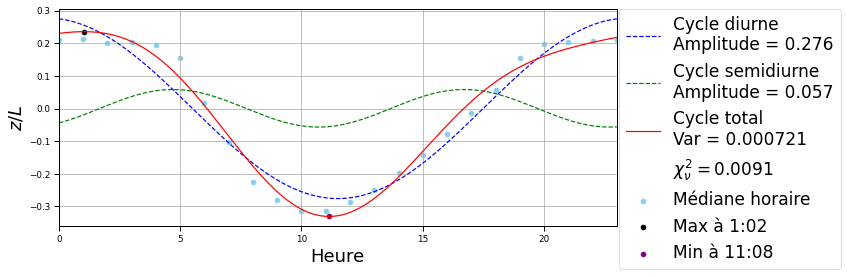

Fitted parameters:
peak_value = 1.0360360360360361
C1 = -1.4393998599813085
C2 = -0.8910948870250307
Number of season averaged: 135131
ZL été US-WA
ZL_été_US-WA
Empty DataFrame
Columns: [station_id, saison, year]
Index: []
0
not seasons
ZL été US-CA
ZL_été_US-CA
   station_id saison    year
0           3    été  2015.0
1           3    été  2016.0
2           3    été  2017.0
3           4    été  2015.0
4           4    été  2016.0
5           4    été  2017.0
6           4    été  2018.0
7           4    été  2019.0
8           4    été  2020.0
9           6    été  2015.0
10          6    été  2016.0
11          6    été  2017.0
12          6    été  2018.0
13          6    été  2019.0
14          6    été  2020.0
15         14    été  2017.0
16         14    été  2018.0
17         14    été  2019.0
18         15    été  2018.0
19         15    été  2019.0
20         17    été  2015.0
21         17    été  2016.0
22         17    été  2017.0
23         17    été  2018.0
24         1

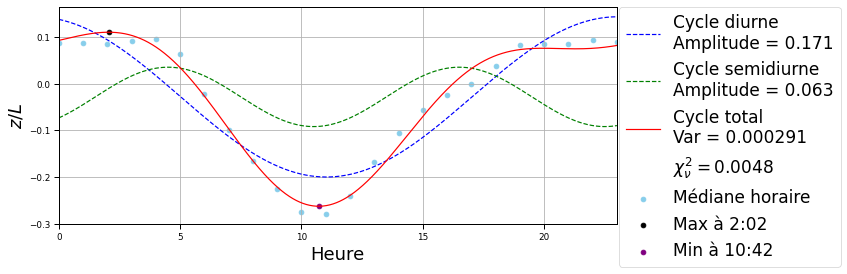

Fitted parameters:
peak_value = 2.0490490490490494
C1 = -1.3152677296023627
C2 = -0.7858187311447101
Number of season averaged: 73096
ZL été US-MN
ZL_été_US-MN
   station_id saison    year
0           9    été  2017.0
1           9    été  2018.0
2           9    été  2019.0
3          20    été  2016.0
4          20    été  2017.0
5          20    été  2018.0
6          20    été  2019.0
7          25    été  2017.0
8          25    été  2018.0
9          25    été  2019.0
10         25    été  2020.0
11
N hour used:  20977
0.0 0.0
10.774774774774775 10.0
Chi2 = 0.9787900213036201, degrees of freedom = 20, p-value = 0.9999999998606912, reduced chi2 = 0.04893950106518101
ZL_été_US-MN
True
saving


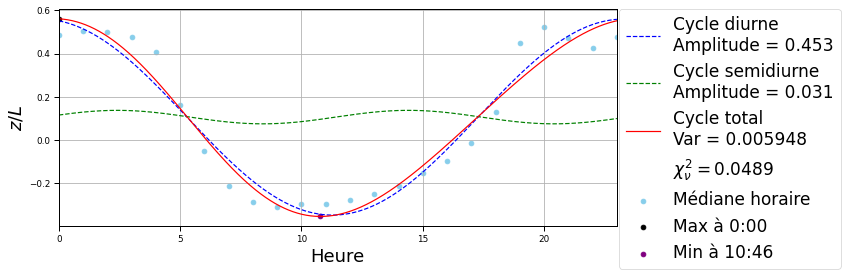

Fitted parameters:
peak_value = 0.0
C1 = 1.7599265220966946
C2 = 0.30932568555925916
Number of season averaged: 20977
ZL été US-IL
ZL_été_US-IL
  station_id saison    year
0         10    été  2016.0
1         10    été  2017.0
2         27    été  2016.0
3         27    été  2017.0
4         27    été  2018.0
5
N hour used:  8726
21.434434434434436 21.0
11.764764764764765 11.0
Chi2 = 2.4096342155470585, degrees of freedom = 20, p-value = 0.9999994028872331, reduced chi2 = 0.12048171077735292
ZL_été_US-IL
True
saving


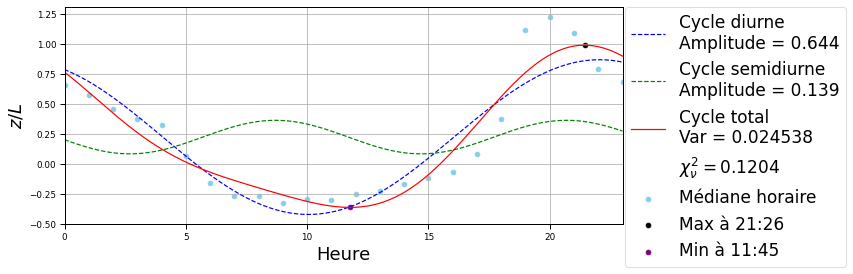

Fitted parameters:
peak_value = 21.434434434434436
C1 = -1.0611534748075515
C2 = 0.1588076318113404
Number of season averaged: 8726
ZL été US-ID
ZL_été_US-ID
   station_id saison    year
0          12    été  2015.0
1          12    été  2016.0
2          12    été  2017.0
3          12    été  2018.0
4          19    été  2015.0
5          19    été  2016.0
6          19    été  2017.0
7          19    été  2018.0
8          21    été  2015.0
9          21    été  2016.0
10         21    été  2017.0
11         21    été  2018.0
12         33    été  2015.0
13         33    été  2016.0
14         33    été  2017.0
15         33    été  2018.0
16
N hour used:  34248
1.5195195195195197 1.0
10.95895895895896 10.0
Chi2 = 21.915456025368982, degrees of freedom = 20, p-value = 0.3451158039468607, reduced chi2 = 1.0957728012684491
ZL_été_US-ID
True
saving


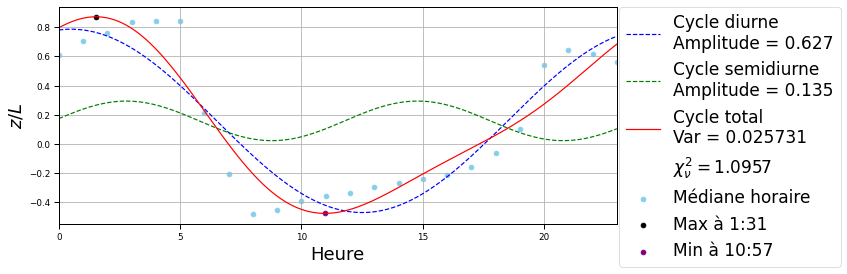

Fitted parameters:
peak_value = 1.5195195195195197
C1 = 1.4381890656525587
C2 = 0.11417122424503237
Number of season averaged: 34248
ZL été CA-ON
ZL_été_CA-ON
  station_id saison    year
0         24    été  2016.0
1         24    été  2018.0
2         24    été  2019.0
3
N hour used:  5312
23.0 23.0
11.18918918918919 11.0
Chi2 = 2.495887377485019, degrees of freedom = 20, p-value = 0.9999991835318537, reduced chi2 = 0.12479436887425095
ZL_été_CA-ON
True
saving


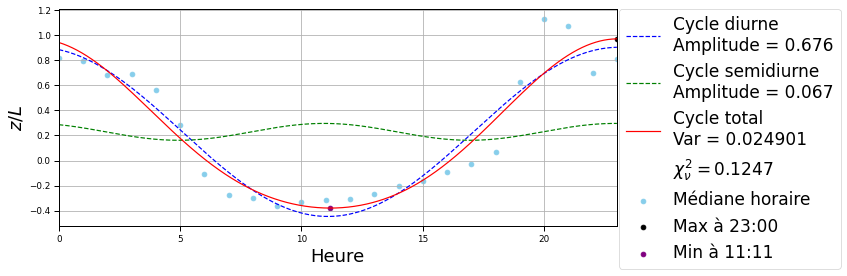

Fitted parameters:
peak_value = 23.0
C1 = 1.8095163097452684
C2 = -1.0123197996289182
Number of season averaged: 5312
ZL été US-AZ
ZL_été_US-AZ
  station_id saison    year
0         30    été  2016.0
1         30    été  2017.0
2         30    été  2018.0
3
N hour used:  5417
2.0490490490490494 2.0
10.521521521521523 10.0
Chi2 = 8.60470631220744, degrees of freedom = 20, p-value = 0.9870499554792516, reduced chi2 = 0.43023531561037204
ZL_été_US-AZ
True
saving


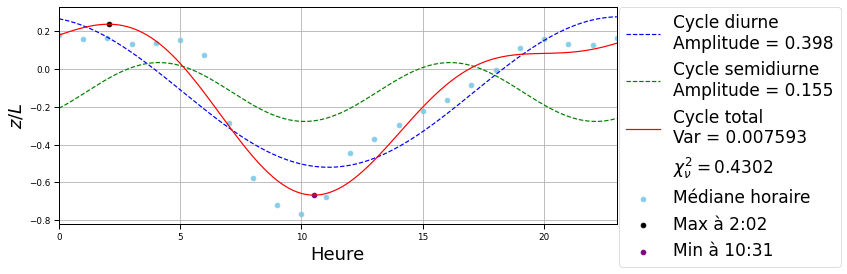

Fitted parameters:
peak_value = 2.0490490490490494
C1 = -1.3386158352128332
C2 = -0.5889779486328366
Number of season averaged: 5417
ZL été US-DE
ZL_été_US-DE
  station_id saison    year
0         31    été  2015.0
1         31    été  2016.0
2         31    été  2017.0
3
N hour used:  6175
0.0 0.0
10.567567567567568 10.0
Chi2 = 0.6409879429684167, degrees of freedom = 20, p-value = 0.9999999999976447, reduced chi2 = 0.03204939714842083
ZL_été_US-DE
True
saving


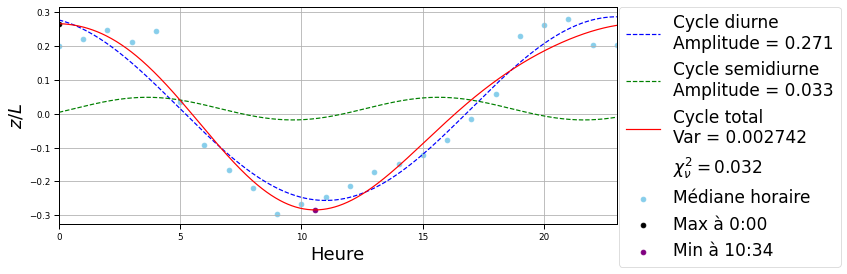

Fitted parameters:
peak_value = 0.0
C1 = -1.306942565192239
C2 = -0.33496824027320266
Number of season averaged: 6175
ZL été US-FL
ZL_été_US-FL
  station_id saison    year
0         35    été  2016.0
1         35    été  2018.0
2         35    été  2019.0
3
N hour used:  6385
1.2202202202202204 1.0
10.65965965965966 10.0
Chi2 = 0.9218362509270758, degrees of freedom = 20, p-value = 0.9999999999215086, reduced chi2 = 0.04609181254635379
ZL_été_US-FL
True
saving


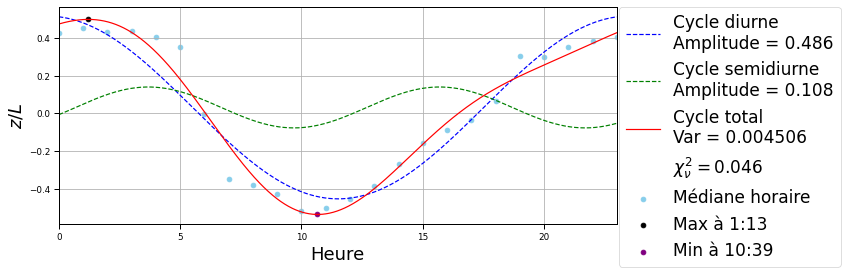

Fitted parameters:
peak_value = 1.2202202202202204
C1 = 1.6983926515910994
C2 = -0.3604386315294471
Number of season averaged: 6385
ZL été toutes
ZL_été_toutes
   station_id saison    year
0           3    été  2015.0
1           3    été  2016.0
2           3    été  2017.0
3           4    été  2015.0
4           4    été  2016.0
..        ...    ...     ...
75         33    été  2017.0
76         33    été  2018.0
77         35    été  2016.0
78         35    été  2018.0
79         35    été  2019.0

[80 rows x 3 columns]
80
N hour used:  160336
1.0360360360360361 1.0
10.65965965965966 10.0
Chi2 = 2.870019593699482, degrees of freedom = 20, p-value = 0.9999972106664887, reduced chi2 = 0.1435009796849741
ZL_été_toutes
True
saving


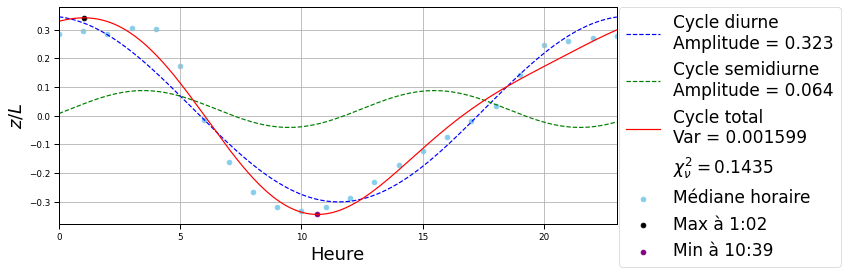

Fitted parameters:
peak_value = 1.0360360360360361
C1 = 1.691364348749368
C2 = -0.2500576947441473
Number of season averaged: 160336
ZL automne US-WA
ZL_automne_US-WA
  station_id   saison    year
0          5  automne  2017.0
1         28  automne  2020.0
2
N hour used:  3305
19.73073073073073 19.0
11.488488488488489 11.0
Chi2 = 0.19862327726673637, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.009931163863336818
ZL_automne_US-WA
True
saving


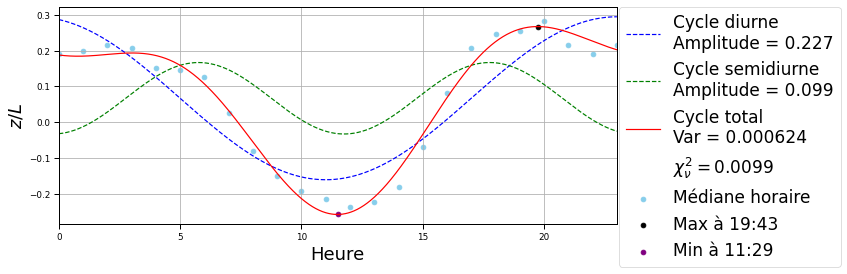

Fitted parameters:
peak_value = 19.73073073073073
C1 = -1.3084744169017857
C2 = -1.4425198370197856
Number of season averaged: 3305
ZL automne US-CA
ZL_automne_US-CA
   station_id   saison    year
0           4  automne  2015.0
1           4  automne  2016.0
2           4  automne  2017.0
3           4  automne  2019.0
4          14  automne  2016.0
5          14  automne  2017.0
6          14  automne  2019.0
7          15  automne  2018.0
8          17  automne  2015.0
9          17  automne  2016.0
10         17  automne  2017.0
11         17  automne  2018.0
12         17  automne  2019.0
13         17  automne  2020.0
14         22  automne  2018.0
15         23  automne  2018.0
16         23  automne  2019.0
17         23  automne  2020.0
18         26  automne  2017.0
19         26  automne  2018.0
20         26  automne  2019.0
21         26  automne  2020.0
22         29  automne  2020.0
23
N hour used:  41861
2.762762762762763 2.0
11.074074074074074 11.0
Chi2 = 0.356133345667

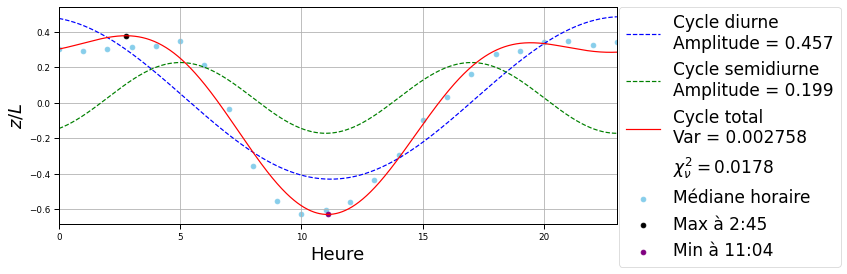

Fitted parameters:
peak_value = 2.762762762762763
C1 = -1.361988463753314
C2 = -1.0477615537456486
Number of season averaged: 41861
ZL automne US-MN
ZL_automne_US-MN
   station_id   saison    year
0           9  automne  2017.0
1           9  automne  2018.0
2           9  automne  2019.0
3           9  automne  2020.0
4          20  automne  2016.0
5          20  automne  2017.0
6          20  automne  2018.0
7          20  automne  2019.0
8          20  automne  2020.0
9          25  automne  2017.0
10         25  automne  2018.0
11         25  automne  2019.0
12         25  automne  2020.0
13
N hour used:  24026
1.6806806806806809 1.0
11.258258258258259 11.0
Chi2 = 0.16646856408826624, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.008323428204413312
ZL_automne_US-MN
True
saving


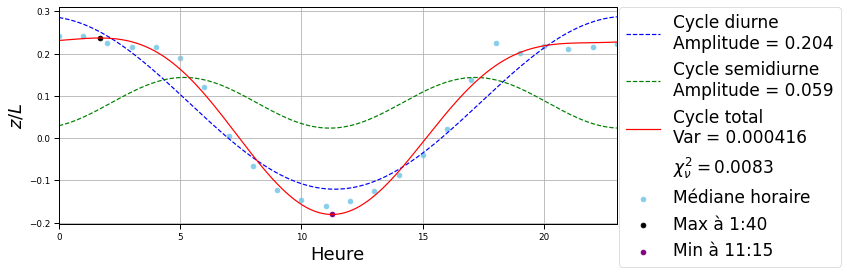

Fitted parameters:
peak_value = 1.6806806806806809
C1 = -1.4056890432588098
C2 = -1.1302279408758864
Number of season averaged: 24026
ZL automne US-IL
ZL_automne_US-IL
  station_id   saison    year
0         10  automne  2016.0
1         10  automne  2017.0
2         27  automne  2016.0
3         27  automne  2017.0
4         27  automne  2018.0
5
N hour used:  8490
19.845845845845847 19.0
11.166166166166168 11.0
Chi2 = 0.45569952727927265, degrees of freedom = 20, p-value = 0.9999999999999155, reduced chi2 = 0.022784976363963632
ZL_automne_US-IL
True
saving


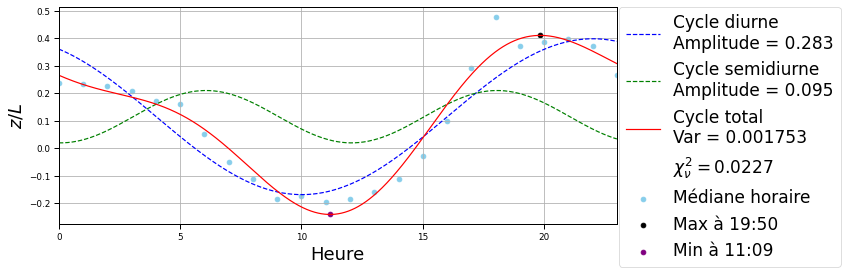

Fitted parameters:
peak_value = 19.845845845845847
C1 = -1.050215701104264
C2 = 1.539011565133534
Number of season averaged: 8490
ZL automne US-ID
ZL_automne_US-ID
  station_id   saison    year
0         12  automne  2015.0
1         12  automne  2016.0
2         12  automne  2017.0
3         19  automne  2016.0
4         21  automne  2015.0
5         21  automne  2016.0
6         21  automne  2017.0
7         33  automne  2015.0
8         33  automne  2016.0
9         33  automne  2017.0
10
N hour used:  20070
3.2922922922922924 3.0
12.11011011011011 12.0
Chi2 = 0.9122837353068589, degrees of freedom = 20, p-value = 0.9999999999289666, reduced chi2 = 0.04561418676534294
ZL_automne_US-ID
True
saving


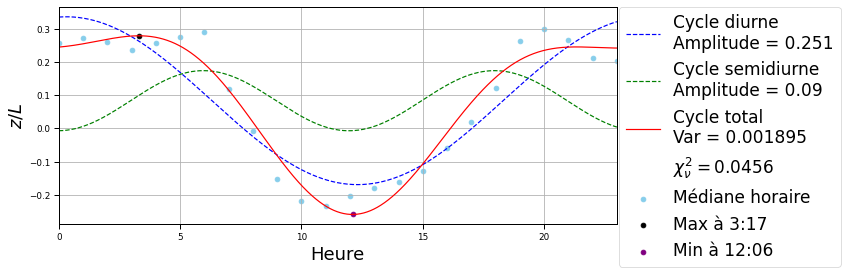

Fitted parameters:
peak_value = 3.2922922922922924
C1 = 1.4896015195681553
C2 = -1.546770539542747
Number of season averaged: 20070
ZL automne CA-ON
ZL_automne_CA-ON
  station_id   saison    year
0         24  automne  2020.0
1
N hour used:  1661
20.352352352352355 20.0
11.41941941941942 11.0
Chi2 = 1.5064831116019612, degrees of freedom = 20, p-value = 0.9999999918141061, reduced chi2 = 0.07532415558009806
ZL_automne_CA-ON
True
saving


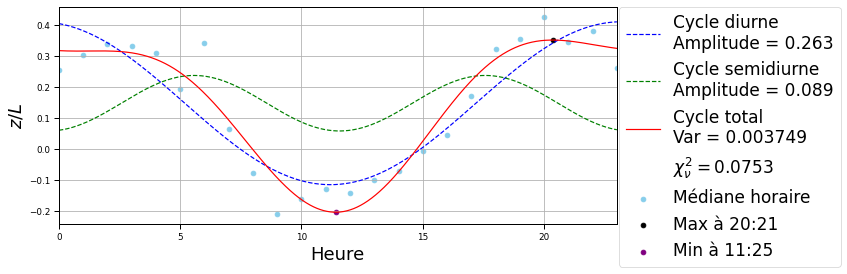

Fitted parameters:
peak_value = 20.352352352352355
C1 = -1.3588625466725095
C2 = -1.3460817783169474
Number of season averaged: 1661
ZL automne US-AZ
ZL_automne_US-AZ
  station_id   saison    year
0         30  automne  2015.0
1         30  automne  2016.0
2
N hour used:  4121
2.96996996996997 2.0
10.774774774774775 10.0
Chi2 = 1.0891904733420583, degrees of freedom = 20, p-value = 0.9999999996141523, reduced chi2 = 0.05445952366710292
ZL_automne_US-AZ
True
saving


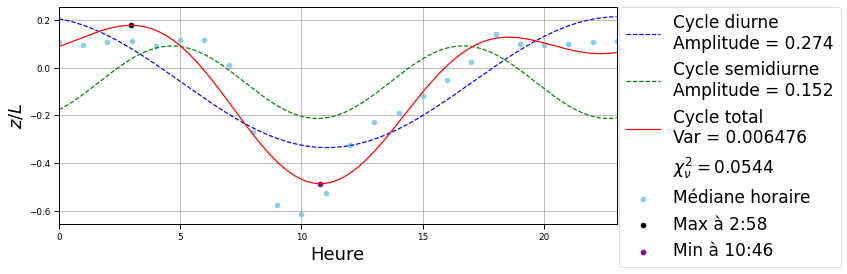

Fitted parameters:
peak_value = 2.96996996996997
C1 = -1.3201726944994958
C2 = -0.8670970989293103
Number of season averaged: 4121
ZL automne US-DE
ZL_automne_US-DE
  station_id   saison    year
0         31  automne  2015.0
1         31  automne  2016.0
2         31  automne  2017.0
3
N hour used:  6257
21.54954954954955 21.0
11.051051051051052 11.0
Chi2 = 0.7696205921780302, degrees of freedom = 20, p-value = 0.9999999999861643, reduced chi2 = 0.03848102960890151
ZL_automne_US-DE
True
saving


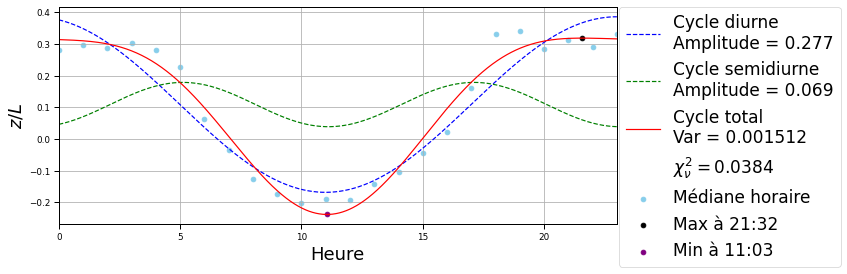

Fitted parameters:
peak_value = 21.54954954954955
C1 = -1.3064463448362567
C2 = -1.1040023359179565
Number of season averaged: 6257
ZL automne US-FL
ZL_automne_US-FL
  station_id   saison    year
0         35  automne  2017.0
1         35  automne  2018.0
2         35  automne  2019.0
3
N hour used:  5813
22.7007007007007 22.0
11.442442442442443 11.0
Chi2 = 2.338456911703801, degrees of freedom = 20, p-value = 0.9999995431713362, reduced chi2 = 0.11692284558519006
ZL_automne_US-FL
True
saving


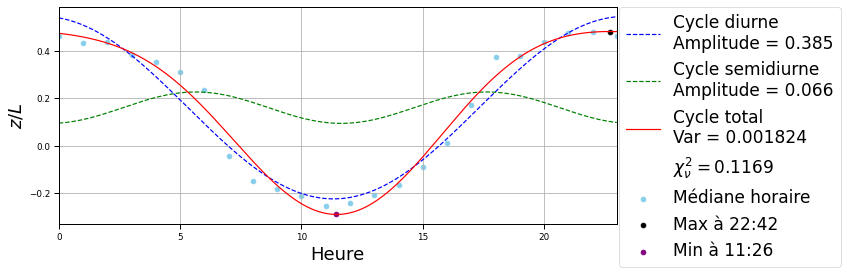

Fitted parameters:
peak_value = 22.7007007007007
C1 = 1.7481763855587993
C2 = -1.381764336456451
Number of season averaged: 5813
ZL automne toutes
ZL_automne_toutes
   station_id   saison    year
0           4  automne  2015.0
1           4  automne  2016.0
2           4  automne  2017.0
3           4  automne  2019.0
4           5  automne  2017.0
..        ...      ...     ...
57         33  automne  2016.0
58         33  automne  2017.0
59         35  automne  2017.0
60         35  automne  2018.0
61         35  automne  2019.0

[62 rows x 3 columns]
62
N hour used:  115604
20.651651651651655 20.0
11.35035035035035 11.0
Chi2 = 0.14682935008222048, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.007341467504111024
ZL_automne_toutes
True
saving


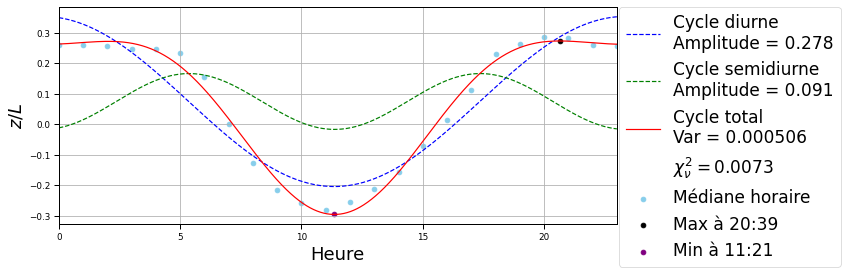

Fitted parameters:
peak_value = 20.651651651651655
C1 = -1.4006817931083484
C2 = -1.2377246887630624
Number of season averaged: 115604
ZL toutes US-WA
ZL_toutes_US-WA
  station_id     saison    year
0          2  printemps  2018.0
1          2  printemps  2020.0
2          5    automne  2017.0
3          5  printemps  2018.0
4         28    automne  2020.0
5
N hour used:  8566
21.45745745745746 21.0
11.71871871871872 11.0
Chi2 = 0.17253503013822924, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.008626751506911463
ZL_toutes_US-WA
True
saving


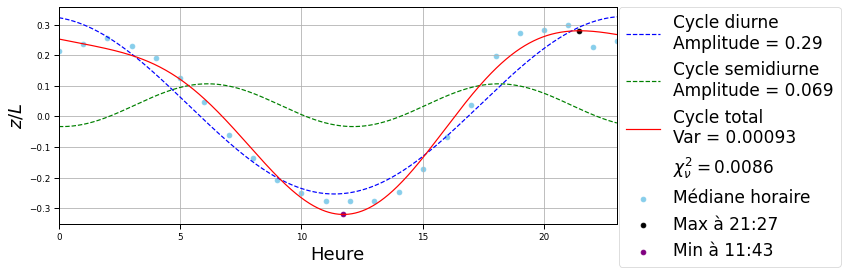

Fitted parameters:
peak_value = 21.45745745745746
C1 = -1.4002586751630495
C2 = 1.5043449693026871
Number of season averaged: 8566
ZL toutes US-CA
ZL_toutes_US-CA
   station_id     saison    year
0           3  printemps  2015.0
1           3        été  2015.0
2           3        été  2016.0
3           3        été  2017.0
4           4  printemps  2015.0
..        ...        ...     ...
93         29        été  2017.0
94         29  printemps  2019.0
95         29        été  2019.0
96         29  printemps  2020.0
97         29    automne  2020.0

[98 rows x 3 columns]
98
N hour used:  179187
2.2332332332332334 2.0
10.88988988988989 10.0
Chi2 = 0.10512941315752283, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.005256470657876142
ZL_toutes_US-CA
True
saving


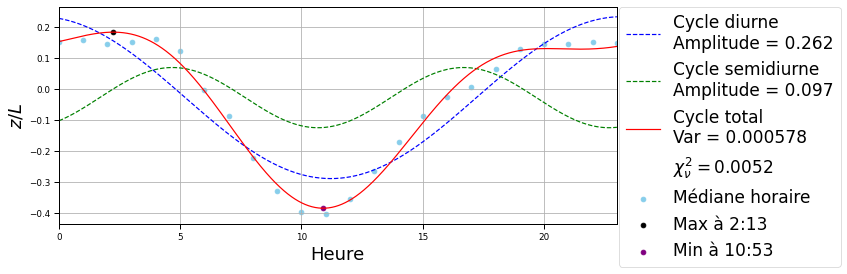

Fitted parameters:
peak_value = 2.2332332332332334
C1 = -1.3638488787557541
C2 = -0.8803224673350366
Number of season averaged: 179187
ZL toutes US-MN
ZL_toutes_US-MN
   station_id     saison    year
0           9  printemps  2017.0
1           9        été  2017.0
2           9    automne  2017.0
3           9      hiver  2017.0
4           9      hiver  2018.0
5           9        été  2018.0
6           9    automne  2018.0
7           9      hiver  2019.0
8           9  printemps  2019.0
9           9        été  2019.0
10          9    automne  2019.0
11          9      hiver  2020.0
12          9    automne  2020.0
13         20  printemps  2016.0
14         20        été  2016.0
15         20    automne  2016.0
16         20      hiver  2016.0
17         20      hiver  2017.0
18         20  printemps  2017.0
19         20        été  2017.0
20         20    automne  2017.0
21         20      hiver  2018.0
22         20  printemps  2018.0
23         20        été  2018.0
24      

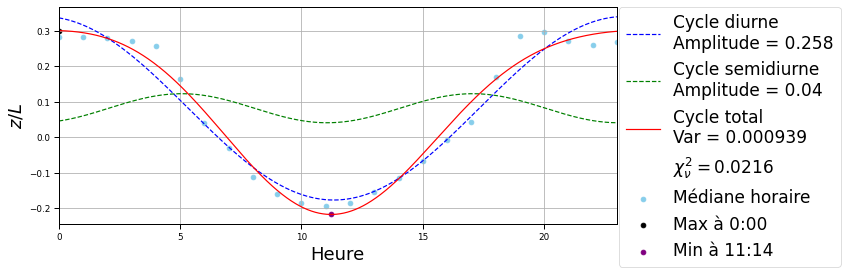

Fitted parameters:
peak_value = 0.0
C1 = -1.3955466535892118
C2 = -1.076865935335534
Number of season averaged: 83640
ZL toutes US-IL
ZL_toutes_US-IL
   station_id     saison    year
0          10  printemps  2016.0
1          10        été  2016.0
2          10    automne  2016.0
3          10  printemps  2017.0
4          10        été  2017.0
5          10    automne  2017.0
6          10      hiver  2017.0
7          10      hiver  2018.0
8          10  printemps  2018.0
9          27  printemps  2016.0
10         27        été  2016.0
11         27    automne  2016.0
12         27        été  2017.0
13         27    automne  2017.0
14         27  printemps  2018.0
15         27        été  2018.0
16         27    automne  2018.0
17
N hour used:  27889
21.31931931931932 21.0
11.304304304304305 11.0
Chi2 = 0.5608285486792801, degrees of freedom = 20, p-value = 0.9999999999993578, reduced chi2 = 0.028041427433964004
ZL_toutes_US-IL
True
saving


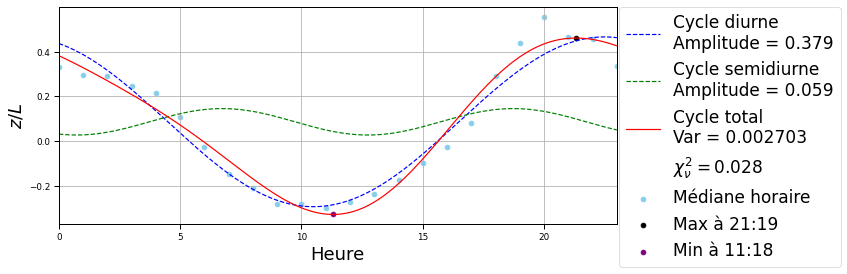

Fitted parameters:
peak_value = 21.31931931931932
C1 = -1.1748251237477465
C2 = 1.1880786870986768
Number of season averaged: 27889
ZL toutes US-ID
ZL_toutes_US-ID
   station_id     saison    year
0          12        été  2015.0
1          12    automne  2015.0
2          12  printemps  2016.0
3          12        été  2016.0
4          12    automne  2016.0
5          12  printemps  2017.0
6          12        été  2017.0
7          12    automne  2017.0
8          12      hiver  2017.0
9          12      hiver  2018.0
10         12  printemps  2018.0
11         12        été  2018.0
12         19        été  2015.0
13         19  printemps  2016.0
14         19        été  2016.0
15         19    automne  2016.0
16         19  printemps  2017.0
17         19        été  2017.0
18         19  printemps  2018.0
19         19        été  2018.0
20         21  printemps  2015.0
21         21        été  2015.0
22         21    automne  2015.0
23         21      hiver  2015.0
24         

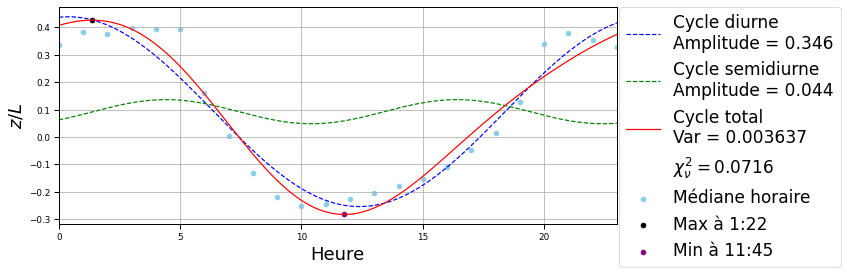

Fitted parameters:
peak_value = 1.3813813813813816
C1 = 1.4688421614139648
C2 = -0.7391541800879894
Number of season averaged: 89070
ZL toutes CA-ON
ZL_toutes_CA-ON
  station_id     saison    year
0         24  printemps  2016.0
1         24        été  2016.0
2         24        été  2018.0
3         24  printemps  2019.0
4         24        été  2019.0
5         24  printemps  2020.0
6         24    automne  2020.0
7
N hour used:  12072
22.861861861861865 22.0
11.373373373373374 11.0
Chi2 = 2.7271357764377653, degrees of freedom = 20, p-value = 0.9999982151639242, reduced chi2 = 0.13635678882188826
ZL_toutes_CA-ON
True
saving


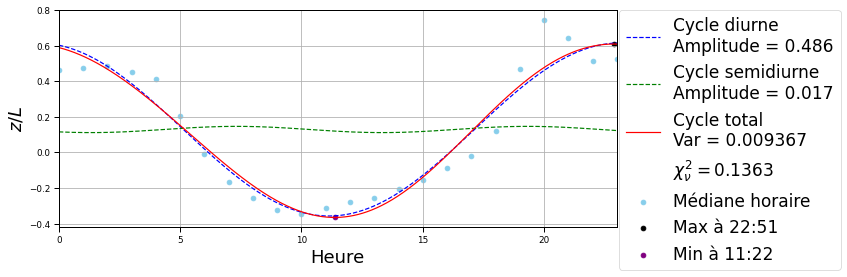

Fitted parameters:
peak_value = 22.861861861861865
C1 = 1.798296411525232
C2 = 0.8753641121083787
Number of season averaged: 12072
ZL toutes US-AZ
ZL_toutes_US-AZ
   station_id     saison    year
0          30  printemps  2015.0
1          30    automne  2015.0
2          30  printemps  2016.0
3          30        été  2016.0
4          30    automne  2016.0
5          30      hiver  2016.0
6          30      hiver  2017.0
7          30  printemps  2017.0
8          30        été  2017.0
9          30  printemps  2018.0
10         30        été  2018.0
11
N hour used:  19679
2.3943943943943946 2.0
10.682682682682684 10.0
Chi2 = 1.5981570258566458, degrees of freedom = 20, p-value = 0.999999985821421, reduced chi2 = 0.07990785129283229
ZL_toutes_US-AZ
True
saving


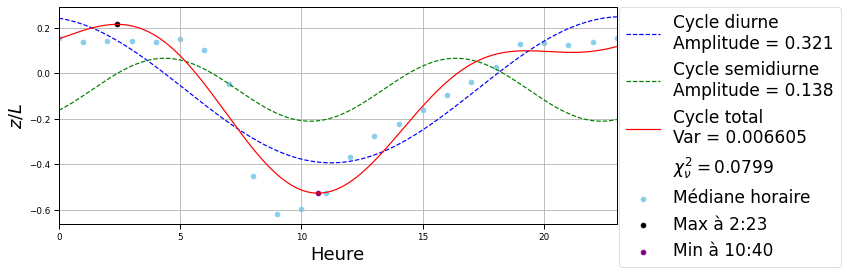

Fitted parameters:
peak_value = 2.3943943943943946
C1 = -1.3661048336336372
C2 = -0.7148601993977459
Number of season averaged: 19679
ZL toutes US-DE
ZL_toutes_US-DE
  station_id     saison    year
0         31        été  2015.0
1         31    automne  2015.0
2         31        été  2016.0
3         31    automne  2016.0
4         31      hiver  2016.0
5         31      hiver  2017.0
6         31  printemps  2017.0
7         31        été  2017.0
8         31    automne  2017.0
9
N hour used:  16444
0.23023023023023026 0.0
10.981981981981983 10.0
Chi2 = 0.20172483597697036, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.010086241798848518
ZL_toutes_US-DE
True
saving


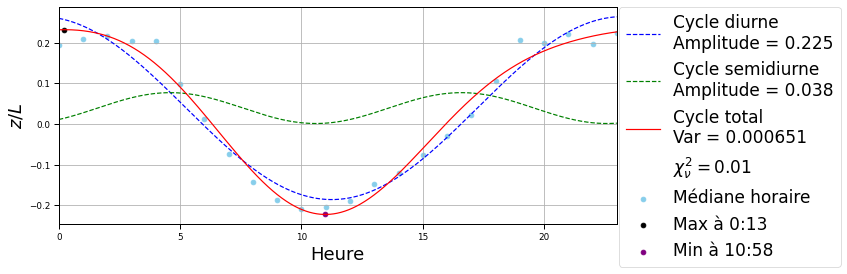

Fitted parameters:
peak_value = 0.23023023023023026
C1 = -1.3735245356803891
C2 = -0.8330847881856925
Number of season averaged: 16444
ZL toutes US-FL
ZL_toutes_US-FL
  station_id     saison    year
0         35        été  2016.0
1         35  printemps  2017.0
2         35    automne  2017.0
3         35        été  2018.0
4         35    automne  2018.0
5         35      hiver  2018.0
6         35      hiver  2019.0
7         35  printemps  2019.0
8         35        été  2019.0
9         35    automne  2019.0
10
N hour used:  18511
0.41441441441441446 0.0
11.235235235235235 11.0
Chi2 = 0.5287855589222484, degrees of freedom = 20, p-value = 0.9999999999996382, reduced chi2 = 0.02643927794611242
ZL_toutes_US-FL
True
saving


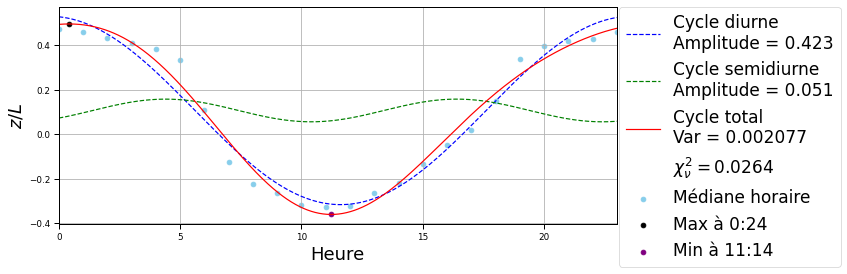

Fitted parameters:
peak_value = 0.41441441441441446
C1 = 1.67258139435001
C2 = -0.7329710924152902
Number of season averaged: 18511
ZL toutes toutes
ZL_toutes_toutes
    station_id     saison    year
0            2  printemps  2018.0
1            2  printemps  2020.0
2            3  printemps  2015.0
3            3        été  2015.0
4            3        été  2016.0
..         ...        ...     ...
247         35      hiver  2018.0
248         35      hiver  2019.0
249         35  printemps  2019.0
250         35        été  2019.0
251         35    automne  2019.0

[252 rows x 3 columns]
252
N hour used:  455058
1.013013013013013 1.0
11.12012012012012 11.0
Chi2 = 0.22065412287675135, degrees of freedom = 20, p-value = 0.9999999999999999, reduced chi2 = 0.011032706143837567
ZL_toutes_toutes
True
saving


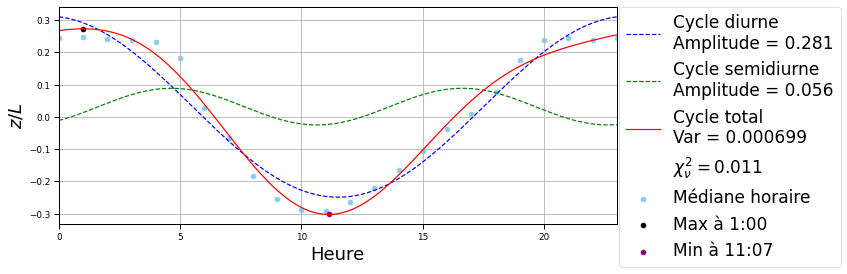

Fitted parameters:
peak_value = 1.013013013013013
C1 = 1.6993206415814341
C2 = -0.8561672440535796
Number of season averaged: 455058


In [130]:
# each unique value of station loc:
unique_station_locs = df_raw_norm['station_loc'].unique()
unique_station_locs = np.append(unique_station_locs, 'toutes')

#each unique value of season:
unique_seasons = ['hiver', 'printemps', 'été', 'automne', 'toutes']

# each unique param:
unique_params = ['WS', 'ustar', 'ZL']

# Iterate over each unique param
for param in unique_params:
    # Iterate over each unique season
    for season in unique_seasons:
        # Iterate over each unique station_loc
        for station_loc in unique_station_locs:
            print(param, season, station_loc)
            file_name = param+'_'+season+'_'+station_loc
            print(file_name)
            Cycle_Diurne(season, param, station_loc, file_name)

In [96]:
Cycle_Diurne('hiver', 'WS', 'toutes', 'WS_hiver_toutes-AZ')

Empty DataFrame
Columns: [saison, year]
Index: []
0
not seasons


hiver
   station_loc saison    year
0        US-CA  hiver  2015.0
1        US-CA  hiver  2016.0
2        US-CA  hiver  2017.0
3        US-CA  hiver  2018.0
4        US-CA  hiver  2019.0
5        US-CA  hiver  2020.0
6        US-MN  hiver  2017.0
7        US-MN  hiver  2018.0
8        US-MN  hiver  2019.0
9        US-MN  hiver  2020.0
10       US-IL  hiver  2017.0
11       US-IL  hiver  2018.0
12       US-ID  hiver  2017.0
13       US-ID  hiver  2018.0
14       US-MN  hiver  2016.0
15       US-ID  hiver  2015.0
16       US-ID  hiver  2016.0
17       US-AZ  hiver  2016.0
18       US-AZ  hiver  2017.0
19       US-DE  hiver  2016.0
20       US-DE  hiver  2017.0
21       US-FL  hiver  2018.0
22       US-FL  hiver  2019.0
23
N hour used:  43987
12.363363363363364 12.0
Chi2 = 0.07380696851011005, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.0036903484255055028
None
False


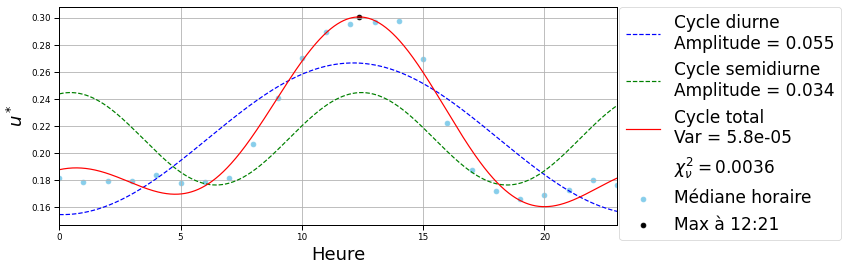

Fitted parameters:
peak_value = 12.363363363363364
C1 = 1.5400350504701223
C2 = 1.3292894163730133
Number of season averaged: 43987
   station_loc saison    year
0        US-CA  hiver  2015.0
1        US-CA  hiver  2016.0
2        US-CA  hiver  2017.0
3        US-CA  hiver  2018.0
4        US-CA  hiver  2019.0
5        US-CA  hiver  2020.0
6        US-MN  hiver  2017.0
7        US-MN  hiver  2018.0
8        US-MN  hiver  2019.0
9        US-MN  hiver  2020.0
10       US-IL  hiver  2017.0
11       US-IL  hiver  2018.0
12       US-ID  hiver  2017.0
13       US-ID  hiver  2018.0
14       US-MN  hiver  2016.0
15       US-ID  hiver  2015.0
16       US-ID  hiver  2016.0
17       US-AZ  hiver  2016.0
18       US-AZ  hiver  2017.0
19       US-DE  hiver  2016.0
20       US-DE  hiver  2017.0
21       US-FL  hiver  2018.0
22       US-FL  hiver  2019.0
23
N hour used:  43987
19.891891891891895 19.0
Chi2 = 1.0906154885080221, degrees of freedom = 20, p-value = 0.9999999996093264, reduced chi2 = 0.05

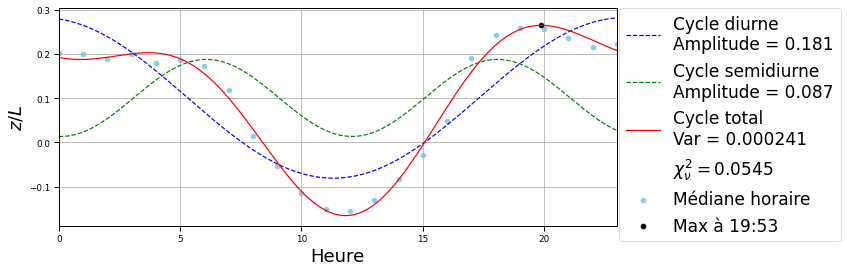

Fitted parameters:
peak_value = 19.891891891891895
C1 = -1.3913714779600104
C2 = -1.6121072182918315
Number of season averaged: 43987
été
   station_loc saison    year
0        US-CA    été  2015.0
1        US-CA    été  2016.0
2        US-CA    été  2017.0
3        US-CA    été  2018.0
4        US-CA    été  2019.0
5        US-CA    été  2020.0
6        US-MN    été  2017.0
7        US-MN    été  2018.0
8        US-MN    été  2019.0
9        US-IL    été  2016.0
10       US-IL    été  2017.0
11       US-ID    été  2015.0
12       US-ID    été  2016.0
13       US-ID    été  2017.0
14       US-ID    été  2018.0
15       US-MN    été  2016.0
16       CA-ON    été  2016.0
17       CA-ON    été  2018.0
18       CA-ON    été  2019.0
19       US-MN    été  2020.0
20       US-IL    été  2018.0
21       US-AZ    été  2016.0
22       US-AZ    été  2017.0
23       US-AZ    été  2018.0
24       US-DE    été  2015.0
25       US-DE    été  2016.0
26       US-DE    été  2017.0
27       US-FL    été 

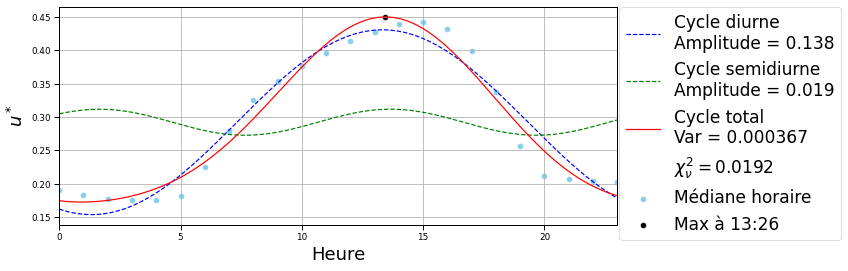

Fitted parameters:
peak_value = 13.445445445445447
C1 = 1.2237257450032473
C2 = 0.7014385489180484
Number of season averaged: 160336
   station_loc saison    year
0        US-CA    été  2015.0
1        US-CA    été  2016.0
2        US-CA    été  2017.0
3        US-CA    été  2018.0
4        US-CA    été  2019.0
5        US-CA    été  2020.0
6        US-MN    été  2017.0
7        US-MN    été  2018.0
8        US-MN    été  2019.0
9        US-IL    été  2016.0
10       US-IL    été  2017.0
11       US-ID    été  2015.0
12       US-ID    été  2016.0
13       US-ID    été  2017.0
14       US-ID    été  2018.0
15       US-MN    été  2016.0
16       CA-ON    été  2016.0
17       CA-ON    été  2018.0
18       CA-ON    été  2019.0
19       US-MN    été  2020.0
20       US-IL    été  2018.0
21       US-AZ    été  2016.0
22       US-AZ    été  2017.0
23       US-AZ    été  2018.0
24       US-DE    été  2015.0
25       US-DE    été  2016.0
26       US-DE    été  2017.0
27       US-FL    été  2016

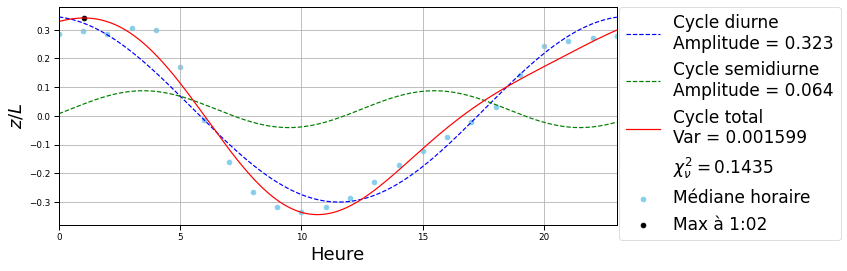

Fitted parameters:
peak_value = 1.0360360360360361
C1 = 1.691364348749368
C2 = -0.2500576947441473
Number of season averaged: 160336
toutes
Empty DataFrame
Columns: [station_loc, saison, year]
Index: []
0
not seasons
Empty DataFrame
Columns: [station_loc, saison, year]
Index: []
0
not seasons


In [98]:
'''#each unique value of season:
seasons_important = ['hiver', 'été', 'toutes']

# Iterate over each unique season
for season in seasons_important:
    print(season)
    Cycle_Diurne(season, 'ustar', 'toutes')
    Cycle_Diurne(season, 'ZL', 'toutes')
    plt.show()'''


 WS toutes
    station_loc     saison    year
0         US-WA  printemps  2018.0
1         US-WA  printemps  2020.0
2         US-CA  printemps  2015.0
3         US-CA        été  2015.0
4         US-CA        été  2016.0
..          ...        ...     ...
106       US-FL      hiver  2018.0
107       US-FL      hiver  2019.0
108       US-FL  printemps  2019.0
109       US-FL        été  2019.0
110       US-FL    automne  2019.0

[111 rows x 3 columns]
111
N hour used:  455058
14.38938938938939 14.0
Chi2 = 0.06004306944030262, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.003002153472015131
None
False


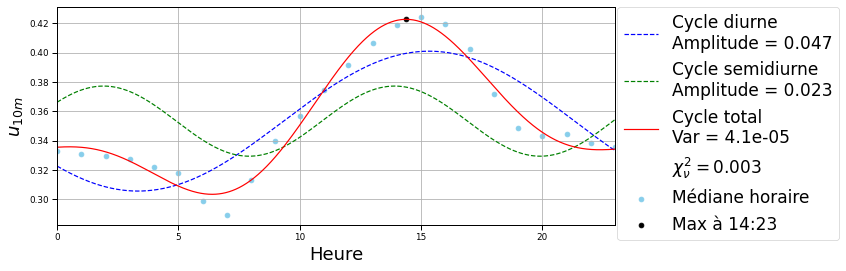

Fitted parameters:
peak_value = 14.38938938938939
C1 = 0.6988323287448557
C2 = 0.5694513822423798
Number of season averaged: 455058

 ustar toutes
    station_loc     saison    year
0         US-WA  printemps  2018.0
1         US-WA  printemps  2020.0
2         US-CA  printemps  2015.0
3         US-CA        été  2015.0
4         US-CA        été  2016.0
..          ...        ...     ...
106       US-FL      hiver  2018.0
107       US-FL      hiver  2019.0
108       US-FL  printemps  2019.0
109       US-FL        été  2019.0
110       US-FL    automne  2019.0

[111 rows x 3 columns]
111
N hour used:  455058
12.86986986986987 12.0
Chi2 = 0.09232640605315323, degrees of freedom = 20, p-value = 1.0, reduced chi2 = 0.004616320302657661
None
False


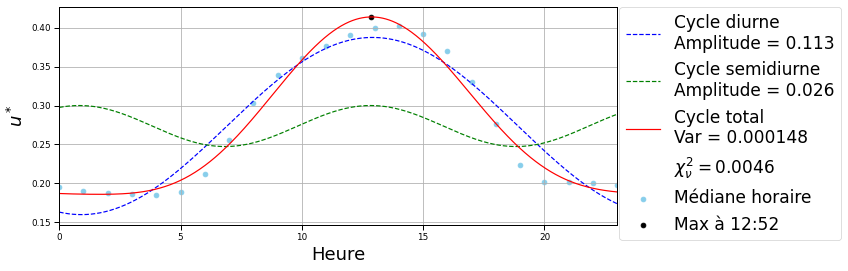

Fitted parameters:
peak_value = 12.86986986986987
C1 = 1.3319013148025218
C2 = 1.1358008129468788
Number of season averaged: 455058

 ZL toutes
    station_loc     saison    year
0         US-WA  printemps  2018.0
1         US-WA  printemps  2020.0
2         US-CA  printemps  2015.0
3         US-CA        été  2015.0
4         US-CA        été  2016.0
..          ...        ...     ...
106       US-FL      hiver  2018.0
107       US-FL      hiver  2019.0
108       US-FL  printemps  2019.0
109       US-FL        été  2019.0
110       US-FL    automne  2019.0

[111 rows x 3 columns]
111
N hour used:  455058
1.013013013013013 1.0
Chi2 = 0.22065412287675135, degrees of freedom = 20, p-value = 0.9999999999999999, reduced chi2 = 0.011032706143837567
None
False


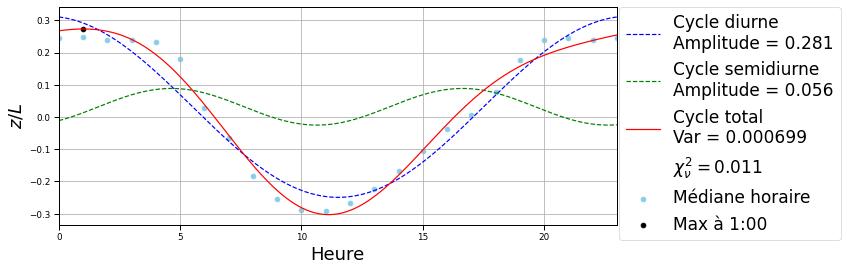

Fitted parameters:
peak_value = 1.013013013013013
C1 = 1.6993206415814341
C2 = -0.8561672440535796
Number of season averaged: 455058


In [104]:
'''#each unique value of season:
seasons_important = ['toutes']

# each unique param:
unique_params = ['WS', 'ustar', 'ZL']

# Iterate over each unique param
for param in unique_params:
    # Iterate over each unique season
    for season in seasons_important:
        print('\n', param, season)
        Cycle_Diurne(season, param, 'toutes')'''

WS hiver US-CA
WS_hiver_US-CA
  station_loc saison    year
0       US-CA  hiver  2015.0
1       US-CA  hiver  2016.0
2       US-CA  hiver  2017.0
3       US-CA  hiver  2018.0
4       US-CA  hiver  2019.0
5       US-CA  hiver  2020.0
6
N hour used:  6776
1.933933933933934 1.0
Chi2 = 1.0253317690899633, degrees of freedom = 20, p-value = 0.9999999997829421, reduced chi2 = 0.05126658845449816
WS_hiver_US-CA
True
saving


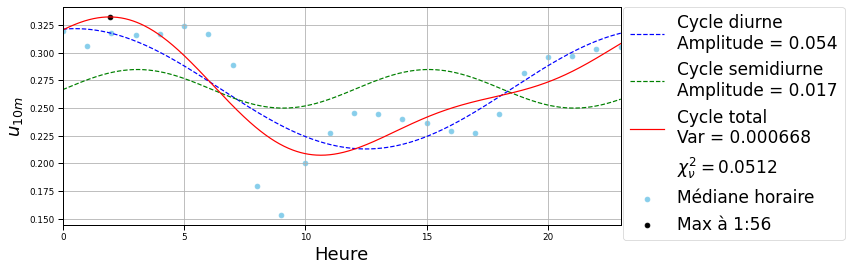

Fitted parameters:
peak_value = 1.933933933933934
C1 = 1.440890107513856
C2 = -0.0426709204012892
Number of season averaged: 6776


In [101]:
'''# each unique value of station loc:
unique_station_locs = ['US-CA']

#each unique value of season:
unique_seasons = ['hiver']

# each unique param:
unique_params = ['WS']

# Iterate over each unique param
for param in unique_params:
    # Iterate over each unique season
    for season in unique_seasons:
        # Iterate over each unique station_loc
        for station_loc in unique_station_locs:
            print(param, season, station_loc)
            file_name = param+'_'+season+'_'+station_loc
            print(file_name)
            Cycle_Diurne(season, param, station_loc, file_name)'''

In [57]:
df_loop_saisons_norm

,station_id,station_loc,year,saison,xz_angle_deg,yz_angle_deg,xc,yc,zc,var,perim,area,var_ratio_1,var_ratio_2,var_ratio_3,var_ratio_12,var_ratio_13,var_ratio_23
0,2,[US-WA],2018.0,printemps,146.801205,71.551507,0.526719,0.319399,0.005232,0.000224,1.993612,0.102381,0.920533,0.076059,0.003409,12.102918,270.064665,22.314013
1,2,[US-WA],2020.0,printemps,115.726141,72.877210,0.497653,0.321213,0.049401,0.000866,2.310578,0.007669,0.967932,0.020543,0.011525,47.118138,83.982267,1.782377
2,3,[US-CA],2015.0,printemps,102.333386,78.096858,0.515676,0.420081,-0.009862,0.000064,1.557660,0.000945,0.899957,0.098515,0.001527,9.135187,589.261879,64.504633
3,3,[US-CA],2015.0,été,106.810669,74.639971,0.604888,0.497553,-0.028085,0.000025,1.150575,0.002220,0.813887,0.185022,0.001091,4.398856,746.267857,169.650434
4,3,[US-CA],2016.0,été,106.039396,75.626699,0.619613,0.504859,-0.030821,0.000033,1.122087,0.002587,0.818259,0.180032,0.001709,4.545064,478.862704,105.358855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,35,[US-FL],2017.0,automne,98.665697,80.548524,0.276052,0.221639,0.177414,0.000109,2.365937,0.006061,0.987668,0.011249,0.001083,87.802867,912.069614,10.387697
234,35,[US-FL],2019.0,hiver,98.950955,79.709092,0.276108,0.229883,0.199768,0.000053,2.168272,0.009278,0.972235,0.027185,0.000580,35.763618,1677.403495,46.902512
235,35,[US-FL],2019.0,printemps,102.154614,79.836806,0.276344,0.242204,0.077183,0.000103,2.070886,0.015708,0.979454,0.019643,0.000903,49.862602,1085.004035,21.759876
236,35,[US-FL],2019.0,été,97.128291,83.248609,0.213215,0.198067,0.019837,0.000088,1.967935,0.004562,0.962488,0.036498,0.001015,26.371310,948.689461,35.974301


# Create seaborn plots

In [44]:
def plot_saison_2D(df_saisons, param_1, param_2, param_name_1, param_name_2, plot_title = 'None'):

    # define saison
    saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}

    selected_columns = df_saisons[[param_1, param_2, 'saison']]

    # Plot using seaborn
    ax = sns.scatterplot(x=param_1, y=param_2, data=selected_columns, hue='saison', palette=saison_colors)
    
    # label axis
    plt.xlabel(param_name_1, fontsize=18)
    plt.ylabel(param_name_2, fontsize=18)
    
    # label legend
    plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize='20') # for legend title  
    
    # Save figure
    if plot_title != 'None':
        plt.savefig('./Plots_report/'+plot_title+'.pdf', bbox_inches='tight')
        
    # Show the plot
    plt.show()
    plt.close()
    
    
def convert_to_str(value):
    if isinstance(value, (list, np.ndarray)):
        return str(value)
    return value

def plot_saison_1D(df_saisons, param_1, param_name_1, plot_title = 'None'):
    
    # convert to locations from numpy to string, looks like it was saved wrong...
    if param_1 == 'station_loc':
        df_saisons[param_1] = df_saisons[param_1].apply(convert_to_str)

    # define saison 
    saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}

    print(df_saisons.columns)
    print(param_1)
    
    # Plot using seaborn
    ax = sns.histplot(data=df_saisons, x=param_1, hue='saison', multiple='stack', palette=saison_colors)
    
    # label axis
    plt.xlabel(param_name_1, fontsize=16)
    plt.ylabel('Nombre de Saisons', fontsize=16)
    
    # label legend
    plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize='20') # for legend title 
    
    # Save figure
    if plot_title != 'None':
        plt.savefig('./Plots_report/'+plot_title+'.pdf', bbox_inches='tight')

    # Show the plot
    plt.show()
    plt.close()

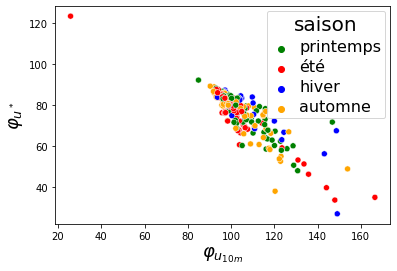

In [45]:
plot_saison_2D(df_loop_saisons_norm, param_1='xz_angle_deg', param_2='yz_angle_deg', 
                 param_name_1='$\\varphi_{u_{10m}}$', param_name_2='$\\varphi_{u^*}$', 
                 plot_title = 'Angles_non_norm')

In [46]:
'''# normalize angles
df_loop_saisons['xz_angle_deg'] = df_loop_saisons['xz_angle_deg'].apply(normalize_angle)
df_loop_saisons['yz_angle_deg'] = df_loop_saisons['yz_angle_deg'].apply(normalize_angle)'''

NameError: name 'df_loop_saisons' is not defined

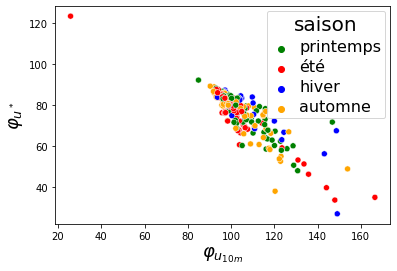

In [47]:
plot_saison_2D(df_loop_saisons_norm, param_1='xz_angle_deg', param_2='yz_angle_deg', 
                 param_name_1='$\\varphi_{u_{10m}}$', param_name_2='$\\varphi_{u^*}}$',  
                 plot_title = 'Angles_norm')

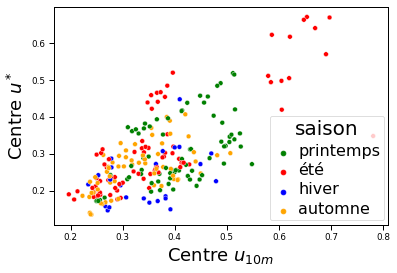

In [151]:
plot_saison_2D(df_loop_saisons_norm, param_1='xc', param_2='yc', 
                 param_name_1='Centre $u_{10m}$', param_name_2='Centre $u^*$', 
                 plot_title = 'u10m_vs_ustar')

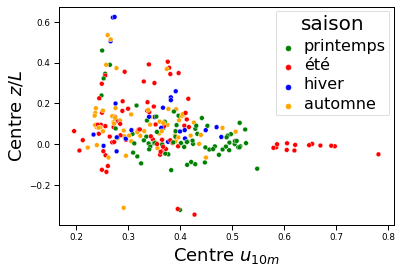

In [152]:
plot_saison_2D(df_loop_saisons_norm, param_1='xc', param_2='zc', 
                 param_name_1='Centre $u_{10m}$', param_name_2='Centre $z/L$', 
                 plot_title = 'u10m_vs_zl')

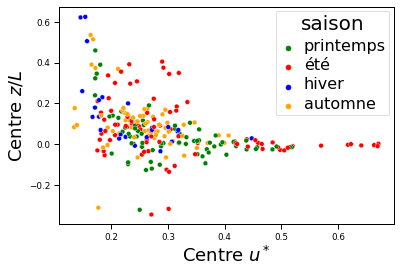

In [153]:
plot_saison_2D(df_loop_saisons_norm, param_1='yc', param_2='zc', 
                 param_name_1='Centre $u^*$', param_name_2='Centre $z/L$', 
                 plot_title = 'ustar_vs_zl')

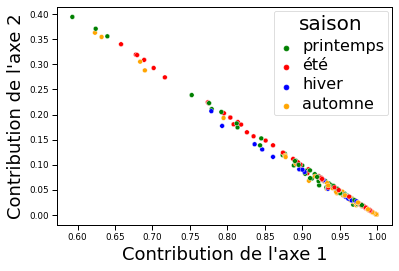

In [156]:
plot_saison_2D(df_loop_saisons_norm, param_1='var_ratio_1', param_2='var_ratio_2', 
                 param_name_1='Contribution de l\'axe 1', 
                 param_name_2='Contribution de l\'axe 2', 
                 plot_title = 'var1_vs_var2')

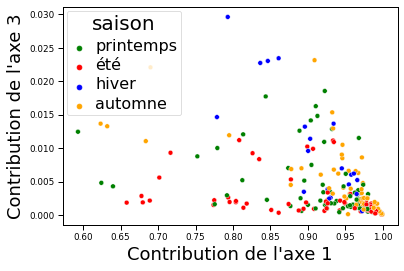

In [157]:
plot_saison_2D(df_loop_saisons_norm, param_1='var_ratio_1', param_2='var_ratio_3', 
                 param_name_1='Contribution de l\'axe 1', 
                 param_name_2='Contribution de l\'axe 3', 
                 plot_title = 'var1_vs_var3')

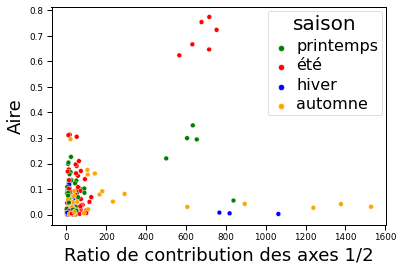

In [159]:
plot_saison_2D(df_loop_saisons_norm, param_1='var_ratio_12', param_2='area', 
                 param_name_1='Ratio de contribution des axes 1/2', 
                 param_name_2='Aire', 
                 plot_title = 'var12_vs_aire')

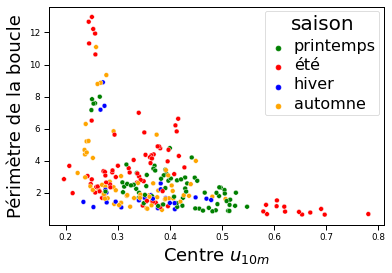

In [161]:
plot_saison_2D(df_loop_saisons_norm, param_1='xc', param_2='perim', 
                 param_name_1='Centre $u_{10m}$', 
                 param_name_2='Périmètre de la boucle', 
                 plot_title = 'WS_vs_perim')

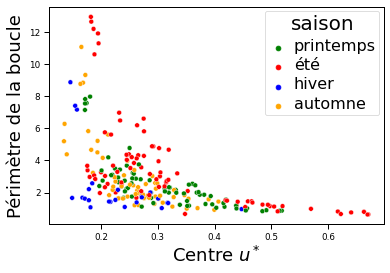

In [162]:
plot_saison_2D(df_loop_saisons_norm, param_1='yc', param_2='perim', 
                 param_name_1='Centre $u^*$', 
                 param_name_2='Périmètre de la boucle', 
                 plot_title = 'ustar_vs_perim')

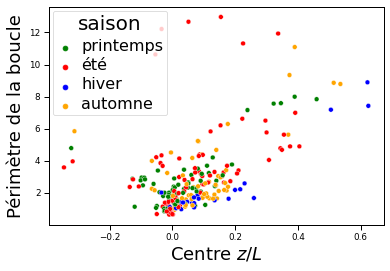

In [163]:
plot_saison_2D(df_loop_saisons_norm, param_1='zc', param_2='perim', 
                 param_name_1='Centre $z/L$', 
                 param_name_2='Périmètre de la boucle', 
                 plot_title = 'zl_vs_perim')

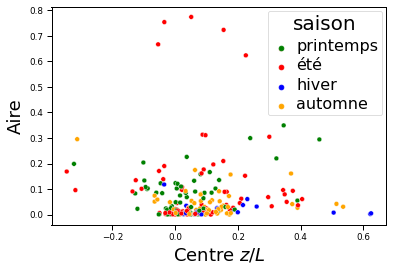

In [169]:
df_restricted = df_loop_saisons_norm[['zc', 'area', 'saison']]
df_restricted = df_restricted[df_restricted['area']<1.9]

plot_saison_2D(df_restricted, param_1='zc', param_2='area', 
                 param_name_1='Centre $z/L$', 
                 param_name_2='Aire', 
                 plot_title = 'zl_vs_aire')

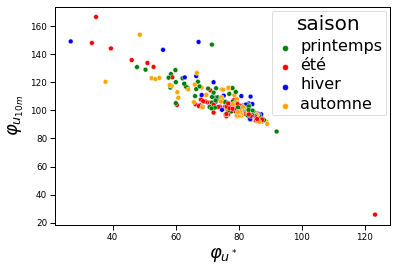

In [179]:
plot_saison_2D(df_loop_saisons_norm, param_1='yz_angle_deg', param_2='xz_angle_deg', 
                 param_name_1='$\\varphi_{u^*}$', 
                 param_name_2='$\\varphi_{u_{10m}}$', 
                 plot_title = 'angle_vs_angle')

Index(['station_id', 'station_loc', 'year', 'saison', 'xz_angle_deg',
       'yz_angle_deg', 'xc', 'yc', 'zc', 'var', 'perim', 'area', 'var_ratio_1',
       'var_ratio_2', 'var_ratio_3', 'var_ratio_12', 'var_ratio_13',
       'var_ratio_23'],
      dtype='object')
station_loc


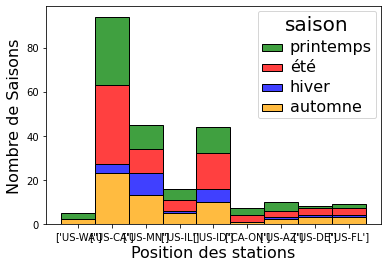

In [49]:
plot_saison_1D(df_loop_saisons_norm, param_1='station_loc', param_name_1="Position des stations", 
               plot_title = 'Distribution_positions')

Index(['station_id', 'station_loc', 'year', 'saison', 'xz_angle_deg',
       'yz_angle_deg', 'xc', 'yc', 'zc', 'var', 'perim', 'area', 'var_ratio_1',
       'var_ratio_2', 'var_ratio_3', 'var_ratio_12', 'var_ratio_13',
       'var_ratio_23'],
      dtype='object')
year


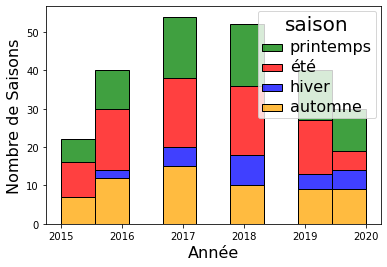

In [50]:
plot_saison_1D(df_loop_saisons_norm, param_1='year', param_name_1="Année", 
               plot_title = 'Distribution_annees')

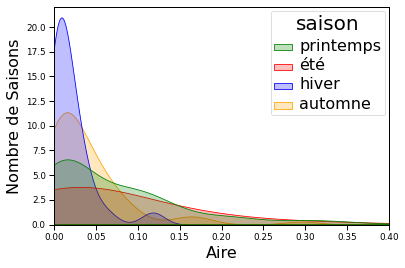

In [191]:
# define saison 
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}

# Create the KDE plot
ax = sns.kdeplot(data=df_loop_saisons_norm, x='area', hue='saison', palette=saison_colors, common_norm=False, fill=True)

# Add title and labels
plt.xlabel('Aire', size=16)
plt.ylabel('Nombre de Saisons', size=16)
plt.xlim(0, 0.4)
    
# label legend
plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='20') # for legend title  
    
# Save figure
plt.savefig('./Plots_report/Aire_saison.pdf', bbox_inches='tight')
plt.show()

In [183]:
print(df_loop_saisons_norm.columns)

Index(['station_id', 'station_loc', 'year', 'saison', 'xz_angle_deg',
       'yz_angle_deg', 'xc', 'yc', 'zc', 'var', 'perim', 'area', 'var_ratio_1',
       'var_ratio_2', 'var_ratio_3', 'angle_axe_principal', 'var_ratio_12',
       'var_ratio_13', 'var_ratio_23'],
      dtype='object')


In [213]:
def plot_saison_2D_fit(df_saisons, param_1, param_2, param_name_1, param_name_2, plot_title = 'None'):

    # define saison
    saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}

    selected_columns = df_saisons[[param_1, param_2, 'saison']]

    # Plot using seaborn
    ax = sns.lmplot(x=param_1, y=param_2, data=selected_columns, hue='saison', palette=saison_colors, legend=False)
    
    # label axis
    plt.xlabel(param_name_1, fontsize=18)
    plt.ylabel(param_name_2, fontsize=18)
    
    # label legend
    #plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
    #plt.setp(ax.get_legend().get_title(), fontsize='20') # for legend title  
    
    legend = plt.legend(loc='upper center', bbox_to_anchor=(1.2025, 1.04), prop={'size': 16})
    legend.set_title("Saisons", prop = {'size': 18})   

    
    # Save figure
    if plot_title != 'None':
        plt.savefig('./Plots_report/'+plot_title+'.pdf', bbox_inches='tight')
        
    # Show the plot
    plt.show()
    plt.close()

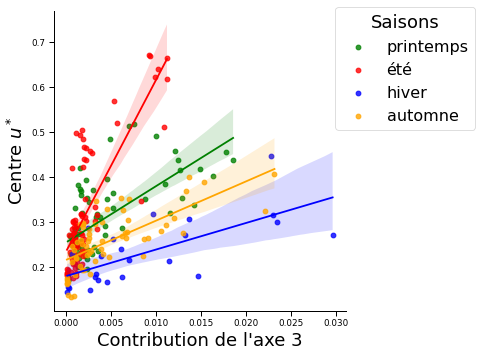

In [214]:
plot_saison_2D_fit(df_loop_saisons_norm, param_1='var_ratio_3', param_2='yc', 
                 param_name_1='Contribution de l\'axe 3', 
                 param_name_2='Centre $u^*$', 
                 plot_title = 'var3_vs_ustar')

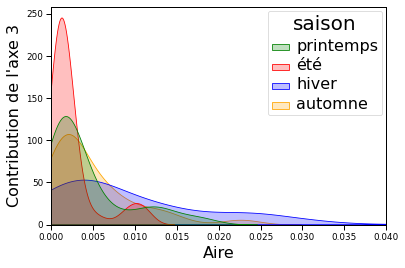

In [194]:
# define saison 
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}

# Create the KDE plot
ax = sns.kdeplot(data=df_loop_saisons_norm, x='var_ratio_3', hue='saison', palette=saison_colors, common_norm=False, fill=True)

# Add title and labels
plt.xlabel('Aire', size=16)
plt.ylabel('Contribution de l\'axe 3', size=16)
plt.xlim(0, 0.04)
    
# label legend
plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='20') # for legend title  
    
# Save figure
plt.savefig('./Plots_report/Var3_saison.pdf', bbox_inches='tight')
plt.show()

In [ ]:
# define saison 
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}

df_restricted = df_loop_saisons_norm[df_loop_saisons_norm['area']<0.75]

#saison_order = ['hiver', 'automne', 'printemps', 'été']
saison_order = [ 'été', 'printemps', 'automne', 'hiver']

# Plot using seaborn
ax = sns.histplot(data=df_loop_saisons_norm, x='var_ratio_3', hue='saison', multiple='stack', 
             palette=saison_colors, bins=50, hue_order=saison_order, kde=False)

# label axis
plt.xlabel('Contribution de l\'axe 3', size=16)
plt.ylabel('Nombre de Saisons', size=16)

# label legend
plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='20') # for legend title  

plt.savefig('./Plots_report/var_ratio_3_hist.pdf', bbox_inches='tight')

# Show the plot
plt.show()
plt.close()

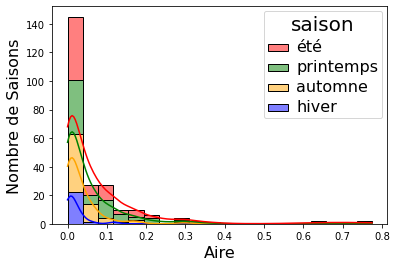

In [52]:
# define saison 
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}

df_restricted = df_loop_saisons_norm[df_loop_saisons_norm['area']<0.75]

#saison_order = ['hiver', 'automne', 'printemps', 'été']
saison_order = [ 'été', 'printemps', 'automne', 'hiver']

# Plot using seaborn
ax = sns.histplot(data=df_loop_saisons_norm, x='area', hue='saison', multiple='stack', 
             palette=saison_colors, bins=20, hue_order=saison_order, kde=True)

# label axis
plt.xlabel('Aire', size=16)
plt.ylabel('Nombre de Saisons', size=16)
    
# label legend
plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
plt.setp(ax.get_legend().get_title(), fontsize='20') # for legend title  

plt.savefig('./Plots_report/Aire_saison_hist.pdf', bbox_inches='tight')

# Show the plot
plt.show()
plt.close()

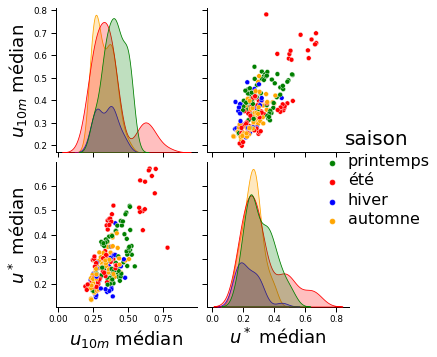

In [53]:
# define colors for each saison
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}


df_restricted = df_loop_saisons_norm[['xc', 'yc', 'saison']]
df_restricted = df_restricted.rename(columns={"xc": "$u_{10m}$ médian", "yc": "$u^*$ médian"})
# for all stations
sns.set_context("paper", rc={"axes.labelsize":18})
ax = sns.pairplot(df_restricted, hue='saison', palette=saison_colors)

# label legend
plt.setp(ax._legend.get_texts(), fontsize=16) # for legend text
plt.setp(ax._legend.get_title(), fontsize=20) # for legend title  
plt.savefig('./Plots_report/pairplot_mediane_xy.pdf', bbox_inches='tight')

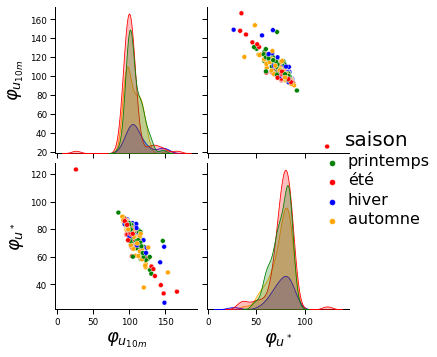

In [54]:
# define colors for each saison
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}


df_restricted = df_loop_saisons_norm[['xz_angle_deg', 'yz_angle_deg', 'saison']]
df_restricted = df_restricted.rename(columns={"xz_angle_deg": "$\\varphi_{u_{10m}}$", "yz_angle_deg": "$\\varphi_{u^*}$"})
# for all stations
ax = sns.pairplot(df_restricted, hue='saison', palette=saison_colors)

# label legend
plt.setp(ax._legend.get_texts(), fontsize=16) # for legend text
plt.setp(ax._legend.get_title(), fontsize=20) # for legend title  
plt.savefig('./Plots_report/pairplot_angles.pdf', bbox_inches='tight')

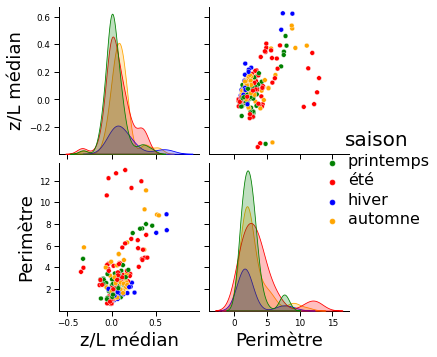

In [55]:
# define colors for each saison
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}

df_restricted = df_loop_saisons_norm[df_loop_saisons_norm['area']<1.9]
df_restricted = df_restricted[['zc', 'perim', 'saison']]
df_restricted = df_restricted.rename(columns={"zc": "z/L médian", "perim": "Perimètre"})


# for all stations
ax =sns.pairplot(df_restricted, hue='saison', palette=saison_colors)

# label legend
plt.setp(ax._legend.get_texts(), fontsize=16) # for legend text
plt.setp(ax._legend.get_title(), fontsize=20) # for legend title  
plt.savefig('./Plots_report/pairplot_zc_perim.pdf', bbox_inches='tight')

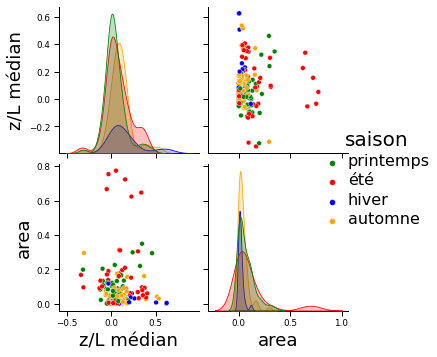

In [56]:
# define colors for each saison
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}


df_restricted = df_loop_saisons_norm[['zc', 'area', 'saison']]
df_restricted = df_restricted.rename(columns={"zc": "z/L médian", "area_flat": "Aire"})

# for all stations
ax = sns.pairplot(df_restricted, hue='saison', palette=saison_colors)

# label legend
plt.setp(ax._legend.get_texts(), fontsize=16) # for legend text
plt.setp(ax._legend.get_title(), fontsize=20) # for legend title  
plt.savefig('./Plots_report/pairplot_zc_aire.pdf', bbox_inches='tight')

In [131]:
df_loop_saisons_norm

,station_id,station_loc,year,saison,xz_angle_deg,yz_angle_deg,xc,yc,zc,var,perim,area,var_ratio_1,var_ratio_2,var_ratio_3,angle_axe_principal,var_ratio_12,var_ratio_13,var_ratio_23
0,2,[US-WA],2018.0,printemps,146.801205,71.551507,0.526719,0.319399,0.005232,0.000224,1.993612,0.102381,0.920533,0.076059,0.003409,97.692453,12.102918,270.064665,22.314013
1,2,[US-WA],2020.0,printemps,115.726141,72.877210,0.497653,0.321213,0.049401,0.000866,2.310578,0.007669,0.967932,0.020543,0.011525,99.430372,47.118138,83.982267,1.782377
2,3,[US-CA],2015.0,printemps,102.333386,78.096858,0.515676,0.420081,-0.009862,0.000064,1.557660,0.000945,0.899957,0.098515,0.001527,114.056512,9.135187,589.261879,64.504633
3,3,[US-CA],2015.0,été,106.810669,74.639971,0.604888,0.497553,-0.028085,0.000025,1.150575,0.002220,0.813887,0.185022,0.001091,118.199762,4.398856,746.267857,169.650434
4,3,[US-CA],2016.0,été,106.039396,75.626699,0.619613,0.504859,-0.030821,0.000033,1.122087,0.002587,0.818259,0.180032,0.001709,111.479756,4.545064,478.862704,105.358855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,35,[US-FL],2017.0,automne,98.665697,80.548524,0.276052,0.221639,0.177414,0.000109,2.365937,0.006061,0.987668,0.011249,0.001083,97.984528,87.802867,912.069614,10.387697
234,35,[US-FL],2019.0,hiver,98.950955,79.709092,0.276108,0.229883,0.199768,0.000053,2.168272,0.009278,0.972235,0.027185,0.000580,100.028521,35.763618,1677.403495,46.902512
235,35,[US-FL],2019.0,printemps,102.154614,79.836806,0.276344,0.242204,0.077183,0.000103,2.070886,0.015708,0.979454,0.019643,0.000903,102.179783,49.862602,1085.004035,21.759876
236,35,[US-FL],2019.0,été,97.128291,83.248609,0.213215,0.198067,0.019837,0.000088,1.967935,0.004562,0.962488,0.036498,0.001015,102.023351,26.371310,948.689461,35.974301


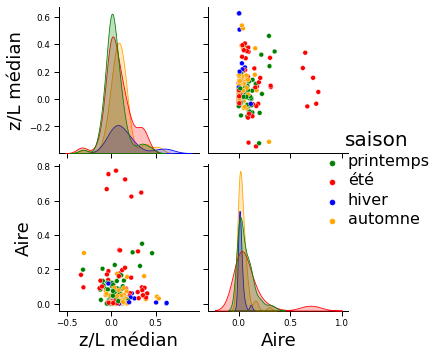

In [165]:
# define colors for each saison
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}


df_restricted = df_loop_saisons_norm[['zc', 'area', 'saison']]
df_restricted = df_restricted[df_restricted['area']<1.9]
df_restricted = df_restricted.rename(columns={"zc": "z/L médian", "area": "Aire"})

# for all stations
ax = sns.pairplot(df_restricted, hue='saison', palette=saison_colors)

# label legend
plt.setp(ax._legend.get_texts(), fontsize=16) # for legend text
plt.setp(ax._legend.get_title(), fontsize=20) # for legend title  
plt.savefig('./Plots_report/pairplot_zc_aire_clean.pdf', bbox_inches='tight')

In [ ]:
# define colors for each saison
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}


df_restricted = df_loop_saisons[['zc', 'xc', 'saison']]
df_restricted = df_restricted.rename(columns={"xc": "$u_{10m}$ médian", "zc": '$z/L$ médian'})
# for all stations
sns.set_context("paper", rc={"axes.labelsize":18})
ax = sns.pairplot(df_restricted, hue='saison', palette=saison_colors)

# label legend
plt.setp(ax._legend.get_texts(), fontsize=16) # for legend text
plt.setp(ax._legend.get_title(), fontsize=20) # for legend title  
plt.savefig('./Plots_report/pairplot_mediane_zx.pdf', bbox_inches='tight')
plt.show()
plt.close()



df_restricted = df_loop_saisons[['zc', 'yc', 'saison']]
df_restricted = df_restricted.rename(columns={"zc": '$z/L$ médian', "yc": "$u^*$ médian"})
# for all stations
sns.set_context("paper", rc={"axes.labelsize":18})
ax = sns.pairplot(df_restricted, hue='saison', palette=saison_colors)

# label legend
plt.setp(ax._legend.get_texts(), fontsize=16) # for legend text
plt.setp(ax._legend.get_title(), fontsize=20) # for legend title  
plt.savefig('./Plots_report/pairplot_mediane_zy.pdf', bbox_inches='tight')
plt.show()
plt.close()

In [ ]:
plot_saison_2D(df_loop_saisons, param_1='zc', param_2='xc', 
                 param_name_1='$z/L$ médian', param_name_2='$u_{10m}$ médian', 
                 plot_title = 'pair_plot_zc_xc')

In [ ]:
plot_saison_2D(df_loop_saisons, param_1='zc', param_2='yc', 
                 param_name_1='$z/L$ médian', param_name_2='$u^*$ médian', 
                 plot_title = 'pair_plot_zc_yc')

In [ ]:
# comparaison des 2 cycles diurnes
Cycle_Diurne('toutes', 'ustar', 'toutes', file_name='cycle_diurne_ustar_all')
Cycle_Diurne('toutes', 'WS',    'toutes', file_name='cycle_diurne_WS_all')

In [ ]:
# comparaison des 2 cycles diurnes
Cycle_Diurne('toutes', 'ustar', 'toutes', file_name='cycle_diurne_ustar_all')
Cycle_Diurne('toutes', 'ZL',    'toutes', file_name='cycle_diurne_ZL_all')

In [ ]:
# comparaison des 2 cycles diurnes été 
Cycle_Diurne('été', 'ustar', 'toutes', file_name='cycle_diurne_ustar_été')
Cycle_Diurne('été', 'WS',    'toutes', file_name='cycle_diurne_WS_été')
Cycle_Diurne('été', 'ZL',    'toutes', file_name='cycle_diurne_ZL_été')
# comparaison des 2 cycles diurnes de l'hiver
Cycle_Diurne('hiver', 'ustar', 'toutes', file_name='cycle_diurne_ustar_hiver')
Cycle_Diurne('hiver', 'WS',    'toutes', file_name='cycle_diurne_WS_hiver')
Cycle_Diurne('hiver', 'ZL',    'toutes', file_name='cycle_diurne_ZL_hiver')

In [ ]:
fin

PermissionError: [Errno 13] Permission denied: './pairplots/pairplot_all.pdf'

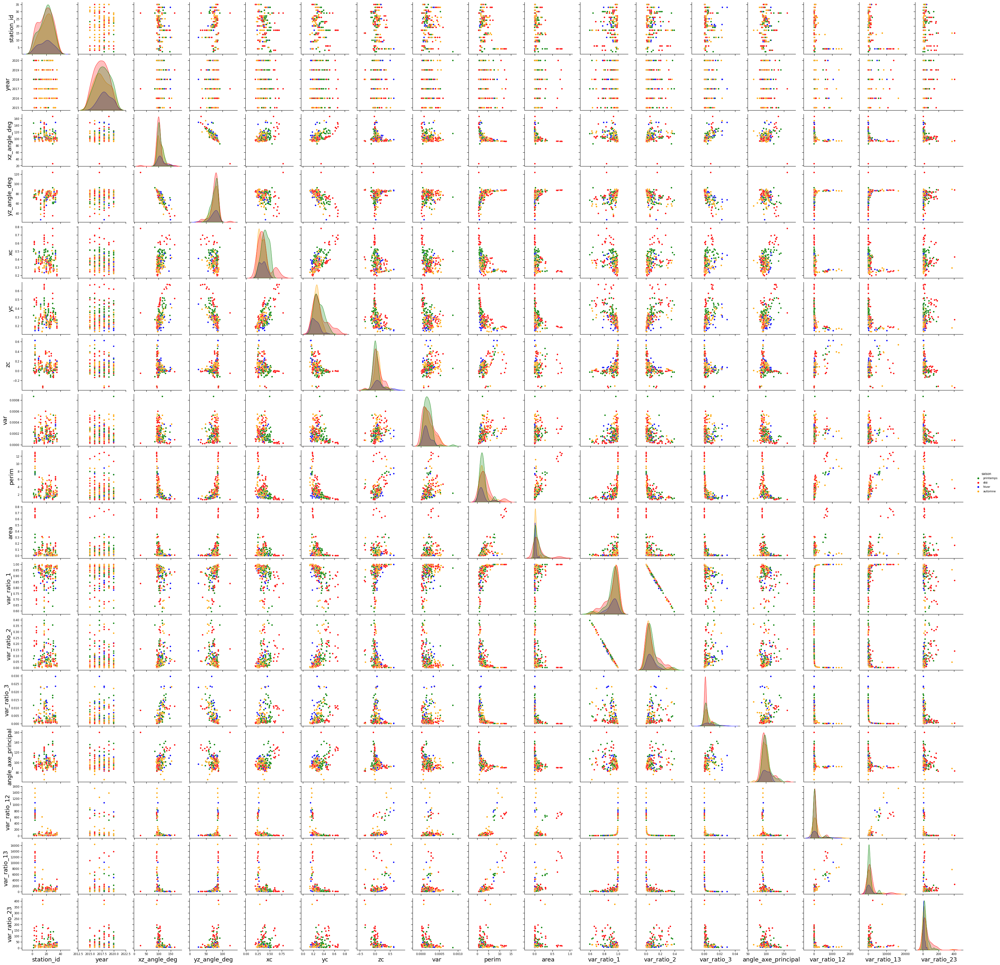

In [129]:
# define colors for each saison
saison_colors = {'hiver': 'blue', 'été': 'red', 'automne': 'orange', 'printemps': 'green'}


df_station_loc = pd.read_pickle("Station_loc_info.pkl")
station_locs = df_station_loc['location']

# for all stations
sns.pairplot(df_loop_saisons_norm, hue='saison', palette=saison_colors)
plt.savefig('./pairplots/pairplot_all.pdf')

'''#segragated by location
for station_loc in station_locs:
    sns.pairplot(df_loop_saisons_norm[df_loop_saisons_norm['station_loc'] == station_loc], hue='saison', palette=saison_colors)
    plt.savefig('./Plots_report/pairplot_station_in_'+station_loc+'.pdf')'''
    


In [58]:
print(df_loop_saisons_norm['var_ratio_13'].min(), df_loop_saisons_norm['var_ratio_13'].max())
print(df_loop_saisons_norm['var_ratio_23'].min(), df_loop_saisons_norm['var_ratio_23'].max())
print(df_loop_saisons_norm['var_ratio_3'].min(), df_loop_saisons_norm['var_ratio_3'].max())

26.76362277336349 16355.250223777908
1.7823766049918255 406.4165041573389
6.109875354270504e-05 0.02962940466296645


In [135]:
df_loop_saisons_norm[df_loop_saisons_norm['var_ratio_3']==df_loop_saisons_norm['var_ratio_3'].min()]

,station_id,station_loc,year,saison,xz_angle_deg,yz_angle_deg,xc,yc,zc,var,perim,area,var_ratio_1,var_ratio_2,var_ratio_3,angle_axe_principal,var_ratio_12,var_ratio_13,var_ratio_23
18,4,[US-CA],2016.0,automne,93.731331,85.518477,0.260974,0.163873,0.535336,0.000113,8.783844,0.030925,0.999285,0.000653,0.000061,91.663157,1529.131444,16355.250224,10.695778


In [137]:
df_loop_saisons_norm[df_loop_saisons_norm['var_ratio_3']==df_loop_saisons_norm['var_ratio_3'].max()]

,station_id,station_loc,year,saison,xz_angle_deg,yz_angle_deg,xc,yc,zc,var,perim,area,var_ratio_1,var_ratio_2,var_ratio_3,angle_axe_principal,var_ratio_12,var_ratio_13,var_ratio_23
225,33,[US-ID],2017.0,hiver,148.680275,67.303229,0.449325,0.271907,0.068989,0.000337,1.699441,0.007521,0.79299,0.17738,0.029629,113.788972,4.470563,26.763623,5.986633


# Only summer and winter

In [ ]:
# define colors for each saison
saison_colors = {'hiver': 'blue', 'été': 'red'}

# filter the DataFrame to include only summer and winter saisons
df_filtered = df_loop_saisons[df_loop_saisons['saison'].isin(['hiver', 'été'])]

unique_locations = df_filtered['station_loc'].unique()

for station_loc in unique_locations:
    sns.pairplot(df_filtered[df_filtered['station_loc'] == station_loc], hue='saison', palette=saison_colors)
    plt.savefig('./Plots_report/pairplot_station_in_'+station_loc+'_SW.pdf')

sns.pairplot(df_filtered, hue='saison', palette=saison_colors)
plt.savefig('./pairplots/pairplot_all_SW.pdf')